**Просматриваем и анализируем  исходные данные 2022 г по измененной сетке**

Ред 6. Стационарные данные из SSE_Power

В этом руководстве мы используем модель трансформатора временного слияния из библиотеки прогнозирования PyTorch и PyTorch 

In [1]:
import warnings
import pickle
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger
#from pytorch_lightning.strategies import DDPStrategy
from pytorch_lightning.strategies import ParallelStrategy
import torch

from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
#from pytorch_forecasting.models import TemporalFusionTransformer
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters

import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf 
import tensorboard as tb 
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

### Функции

In [2]:
from pytorch_forecasting.metrics import MultiHorizonMetric


class MAE(MultiHorizonMetric):
    def loss(self, y_pred, target):
        loss = (self.to_prediction(y_pred) - target).abs()
        return loss

In [3]:
def generate_int_id(dataframe, id_col_name):
    """
    Generate unique integer id for users, questions and answers

    Parameters
    ----------
    dataframe: Dataframe
        Pandas Dataframe for Users or Q&A. 
    id_col_name : String 
        New integer id's column name.
        
    Returns
    -------
    Dataframe
        Updated dataframe containing new id column 
    """
    new_dataframe=dataframe.assign(
        int_id_col_name=np.arange(len(dataframe))
        ).reset_index(drop=True)
    return new_dataframe.rename(columns={'int_id_col_name': id_col_name})


In [4]:
def display_data(dataframe, list_columns=None):
    '''
    Развернутая информация по датасету с фильтрацией по списку колонок,
    по умолчнию без фильтрации,
    названия признаков упорядочены по алфавиту
    '''
    if list_columns==None:
        index_ = sorted(dataframe.columns)
    else: 
        index_ = sorted([x for x in set(dataframe.dtypes.index).intersection(set(list_columns))])
    
    df = dataframe[index_]
    d = pd.concat([df.dtypes,df.count() + df.isna().sum(),\
               round((df.isna().sum()/(df.count() + df.isna().sum()))*100,2),df.nunique(),],axis=1)
    d.columns = ['Тип', 'Общ.кол', '% пропусков','Кол-во уник.значений']
    display(d)
    
    return

In [5]:
def show_correlation(df, features):
    '''
    plot correlation matrix
    '''
    
    #corr_matrix = df.drop(categorial_feature, axis=1).corr()
    corr_matrix = df[features].corr()
    plt.rcParams['figure.figsize'] = (15,15)
    sns.heatmap(corr_matrix, square=True,
                annot=True, fmt=".1f", linewidths=0.1, cmap="RdBu");
    plt.tight_layout()

In [6]:
def create_features(df):
    '''
    Производные от даты,
    категорий точек
    
    '''
    df['year'] = df['datatime'].dt.year.astype(str).astype("category")
    df['month'] = df['datatime'].dt.month.astype(str).astype("category")
    df['day'] = df['datatime'].dt.day.astype(str).astype("category")
    df['hour'] = (df['datatime'].dt.hour).astype(str).astype("category")
    df['dow'] = df['datatime'].dt.day_of_week.astype(str).astype("category")
    
    df['es_label'] = df['es_label'].astype(str).astype("category")
    df['subject_label'] = df['subject_label'].astype(str).astype("category")
    df['district_label'] = df['district_label'].astype(str).astype("category")
    df['price_zone'] = df['price_zone'].astype(str).astype("category")

    return df

### Данные 6 точек

In [320]:
# Исходные данные
#data = pd.read_csv(r'D:\tmp\svod_1_6.csv')
# Получение данные из sse_power: D:\WorkE\rffi2022\sse_power_parameters.xlsx
data = pd.read_csv(r'F:\svod.csv')

In [108]:
#display_data(data)

In [109]:
#data[['lat', 'lon', 'datatime','sse_15','sse_42', 'sse_45', 'sse_23']][0:24]

In [321]:
arr_sse = []
for i in [10,12,17,18,20,23,27,38,39,40,29,30]:
    arr_sse.append('sse_%s'%i)
    data['sse_%s'%i].fillna(0, inplace=True)

In [322]:
for i in [15,42,45]:
    arr_sse.append('sse_%s'%i)
    data['sse_%s'%i].fillna(method='ffill', limit=1, inplace=True)
    data['sse_%s'%i].fillna(method='bfill', limit=1, inplace=True)
    data['sse_%s'%i].fillna(0, inplace=True)
arr_sse       

['sse_10',
 'sse_12',
 'sse_17',
 'sse_18',
 'sse_20',
 'sse_23',
 'sse_27',
 'sse_38',
 'sse_39',
 'sse_40',
 'sse_29',
 'sse_30',
 'sse_15',
 'sse_42',
 'sse_45']

In [18]:
data['datatime'].agg(['min', 'max'])

min    2020-01-15 01:00:00
max    2022-04-01 00:00:00
Name: datatime, dtype: object

Во-первых, нам нужно преобразовать наш временной ряд в фрейм данных pandas, где каждая строка может быть идентифицирована с временным шагом и временным рядом.Набор данных, описывающий часовые данные по радиации для 6 различные географических точек. Наша задача - составить 24-часовой прогноз по выработкам для 2 устройств: hevel395 и jam72s. Существует 19368 почасовых исторических записей о погоде и выработке для каждой точки за прошлые 2 года. В дополнение к историческим данным возможно найти информацию о различных природных и климатических данных по местоположению точки: высота над уровнем моря, точка росы, загрязненность воздуха и т.д.

Набор данных уже находится в правильном формате, но в нем отсутствуют некоторые важные функции. Самое главное, нам нужно добавить временной индекс, который увеличивается на единицу для каждого временного шага. Кроме того, полезно добавить функции даты, что в данном случае означает извлечение месяца из записи даты.

In [323]:
data['datatime'] = pd.to_datetime(data['datatime'])
data['lat'] = np.int16(data['lat'])
data['lon'] = np.int16(data['lon'])

In [324]:
for col in data.columns:
    if data[col].dtypes=='float64':
        data[col] = np.float32(data[col])
    if data[col].dtypes=='int64':
        data[col] = np.int16(data[col])

### EDA для новых признаков

In [22]:
data[['idpoint','ceres_hevel395']].groupby('idpoint').mean()

,ceres_hevel395
idpoint,
2486,35.557204
3702,69.250125
5221,71.392167
6087,60.916568
6128,52.955359
6260,62.784100


KeyError: 'year'

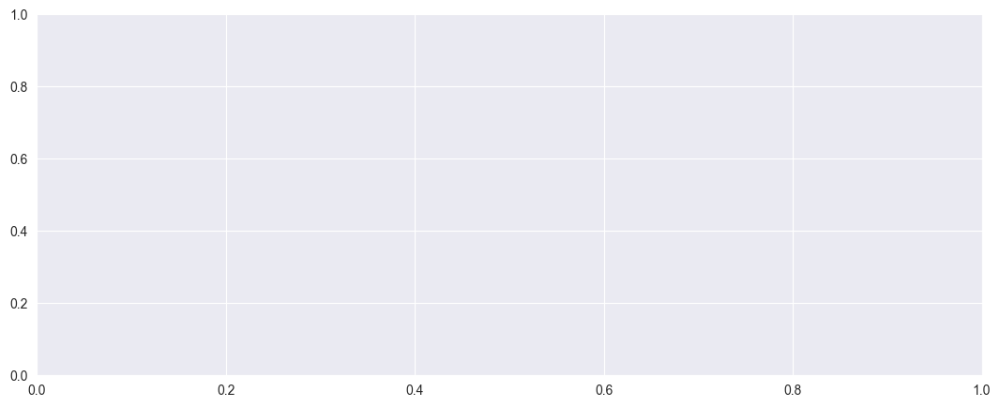

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

#plt.rcParams.update(plt.rcParamsDefault)
sns.set_style('darkgrid')
sns.color_palette("tab10")

fig, ax = plt.subplots(figsize=(13, 5))

sns.lineplot(data=data[(np.int32(data['month']) == 5)&(np.int32(data['year']) == 2020)], 
             x='datatime', 
             y='ceres_hevel395', 
             hue='idpoint', 
             legend='full',
             palette='husl').set_title('Power')

ax.set_xlabel("Date", fontdict={"color":  "black", "size": 13} )
ax.set_ylabel("Power usage (KWs)", fontdict={"color":  "black", "size": 13})
ax.tick_params(axis = 'both', which = 'major', labelsize = 10)
ax.set_title(label = "Power usage of consumers", fontdict={"color":  "black", "size": 15})

In [17]:
data[['sse_29', 'sse_30','sse_15', 'sse_42', 'sse_45']].describe()

,sse_29,sse_30,sse_15,sse_42,sse_45
count,116208.000000,116208.000000,116208.000000,116208.000000,116208.000000
mean,11.308228,87.981841,0.116316,40.646838,22.137596
std,15.978151,101.472009,0.165479,30.627995,29.028617
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.010000,57.300000,0.000000
75%,19.700000,180.000000,0.200000,65.600000,54.300000
max,67.000000,349.000000,0.650000,81.900000,78.400000


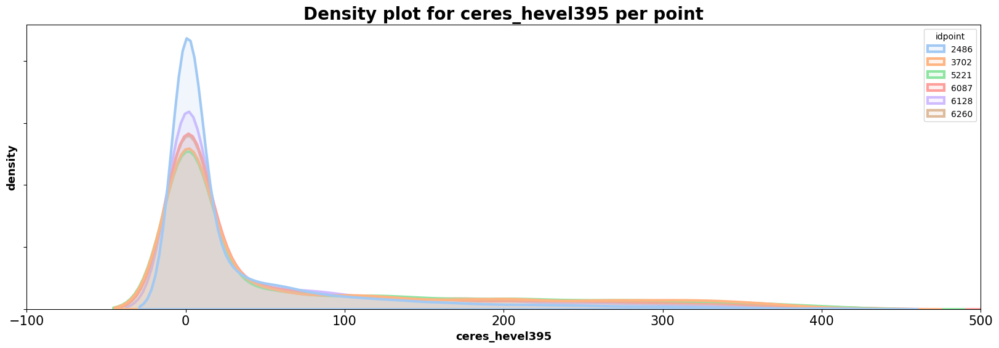

In [18]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'ceres_hevel395', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('ceres_hevel395', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-100, 500)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for ceres_hevel395 per point', fontweight = 'bold', fontsize = 20);

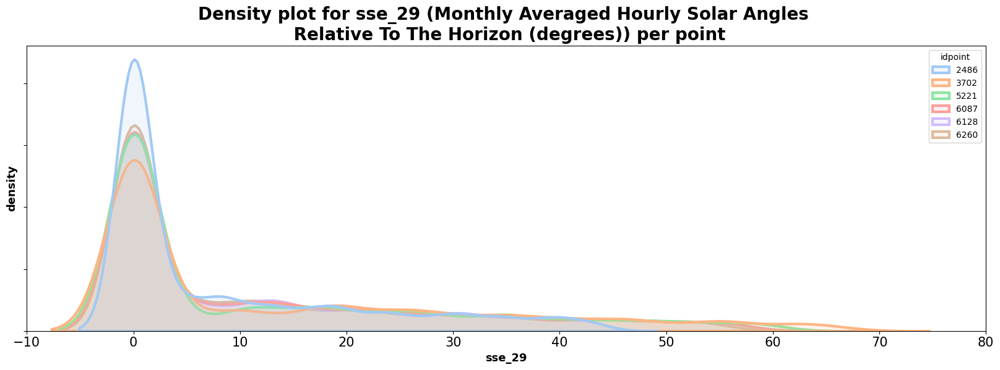

In [19]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_29', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_29', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-10, 80)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_29 (Monthly Averaged Hourly Solar Angles \n Relative To The Horizon (degrees)) per point', fontweight = 'bold', fontsize = 20);

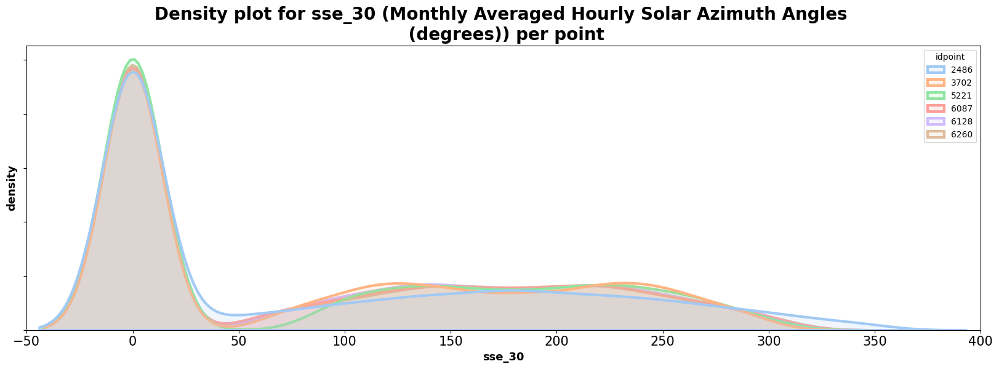

In [20]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_30', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_30', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-50, 400)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_30 (Monthly Averaged Hourly Solar Azimuth Angles \n (degrees)) per point', fontweight = 'bold', fontsize = 20);

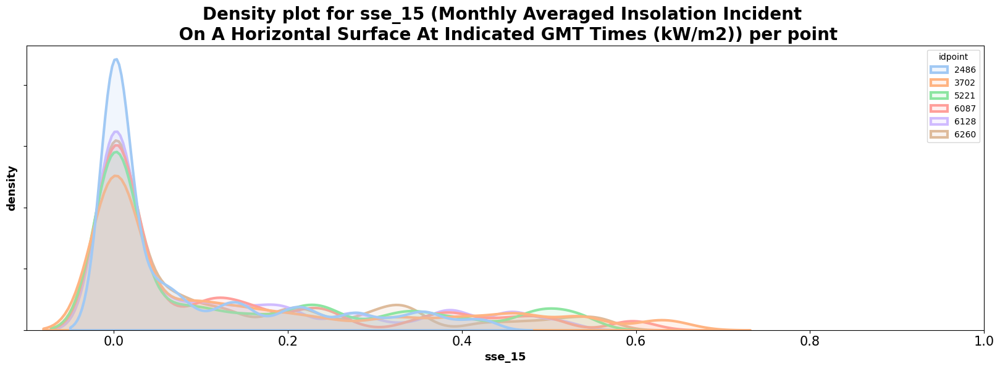

In [24]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_15', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_15', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-0.1, 1)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_15 (Monthly Averaged Insolation Incident \n On A Horizontal Surface At Indicated GMT Times (kW/m2)) per point', fontweight = 'bold', fontsize = 20);

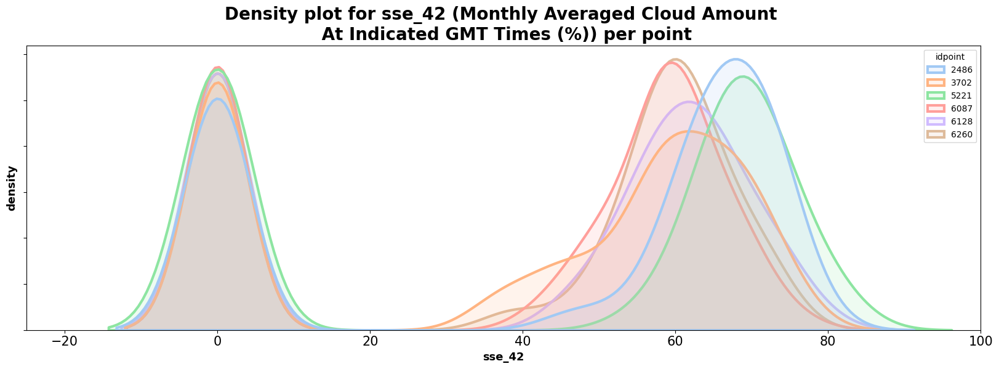

In [25]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_42', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_42', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-25, 100)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_42 (Monthly Averaged Cloud Amount \n At Indicated GMT Times (%)) per point', fontweight = 'bold', fontsize = 20);

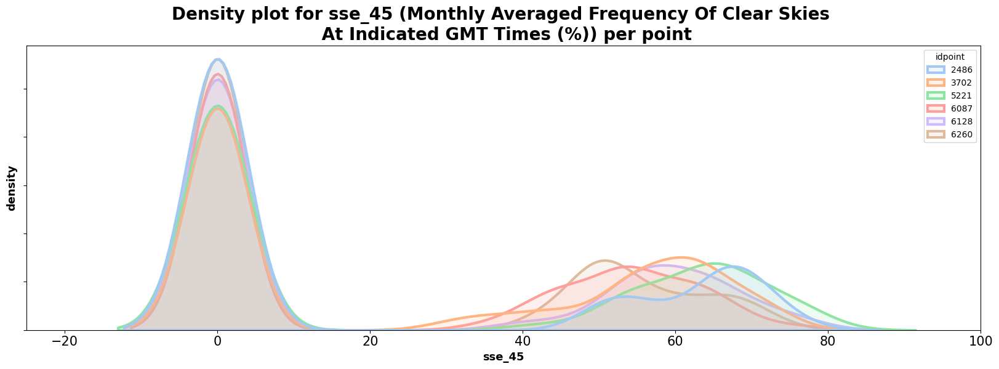

In [26]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_45', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_45', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-25, 100)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_45 (Monthly Averaged Frequency Of Clear Skies \n At Indicated GMT Times (%)) per point', fontweight = 'bold', fontsize = 20);

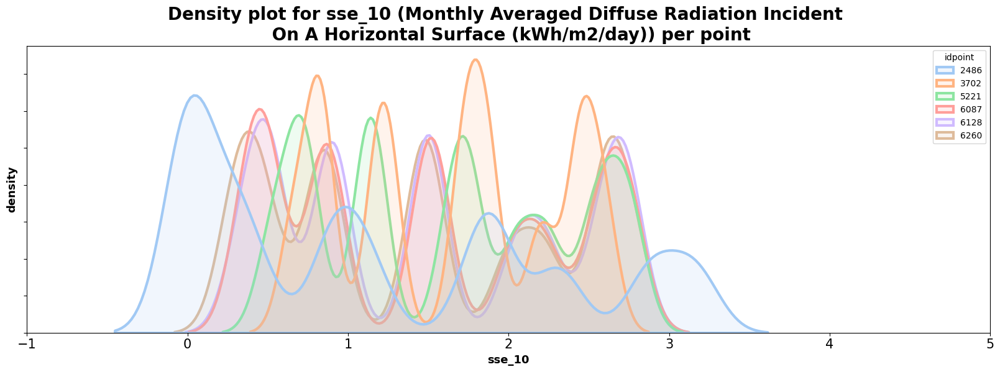

In [27]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_10', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_10', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-1, 5)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_10 (Monthly Averaged Diffuse Radiation Incident \n On A Horizontal Surface (kWh/m2/day)) per point', fontweight = 'bold', fontsize = 20);

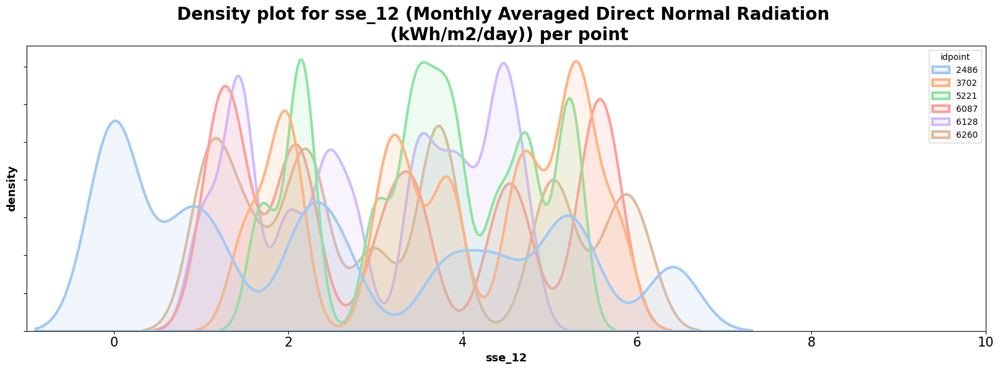

In [28]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_12', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_12', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-1, 10)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_12 (Monthly Averaged Direct Normal Radiation \n (kWh/m2/day)) per point', fontweight = 'bold', fontsize = 20);

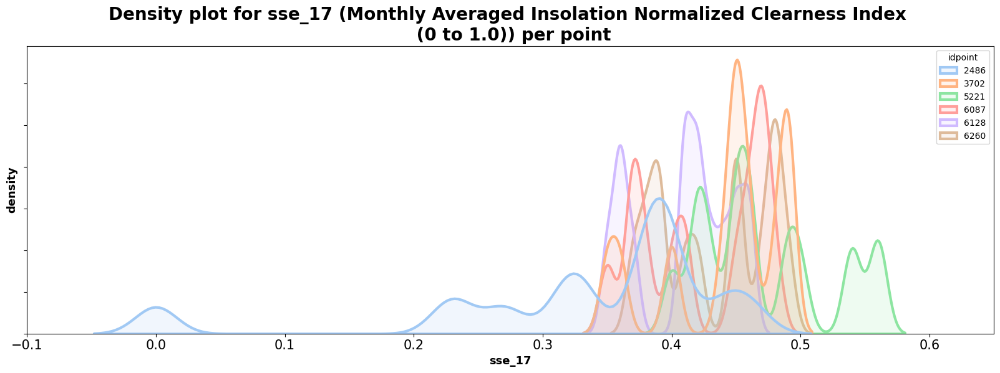

In [29]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_17', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_17', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-0.1, 0.65)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_17 (Monthly Averaged Insolation Normalized Clearness Index \n (0 to 1.0)) per point', fontweight = 'bold', fontsize = 20);

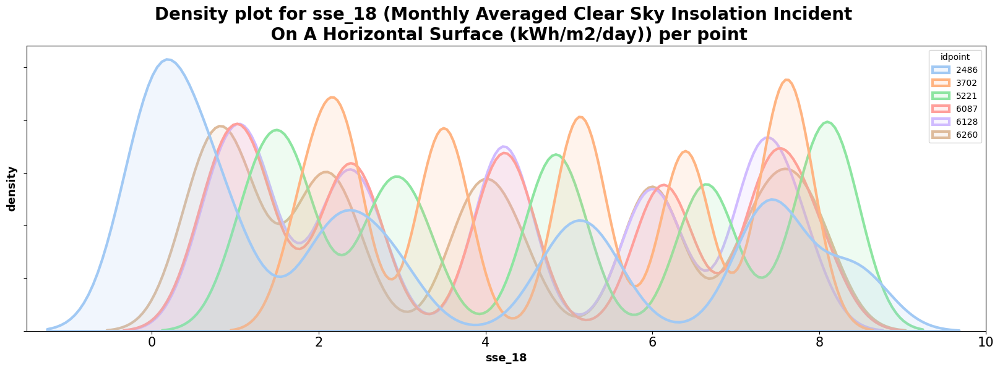

In [30]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_18', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_18', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-1.5, 10)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_18 (Monthly Averaged Clear Sky Insolation Incident \n On A Horizontal Surface (kWh/m2/day)) per point', fontweight = 'bold', fontsize = 20);

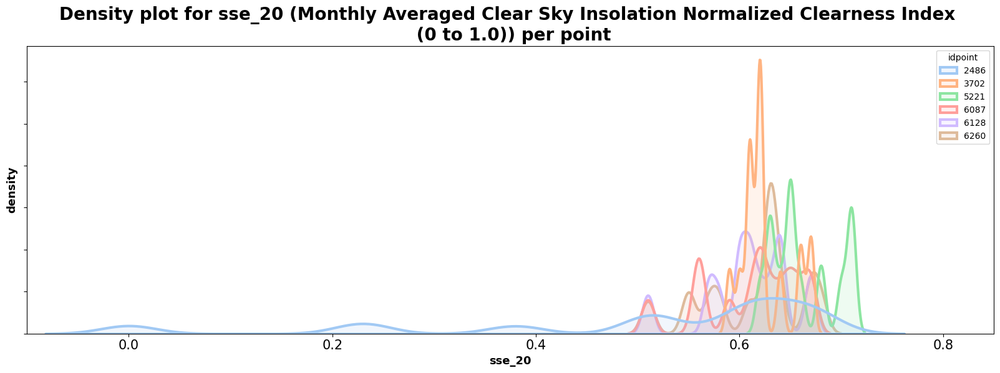

In [31]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_20', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_20', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-0.1, 0.85)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_20 (Monthly Averaged Clear Sky Insolation Normalized Clearness Index \n (0 to 1.0)) per point', fontweight = 'bold', fontsize = 20);

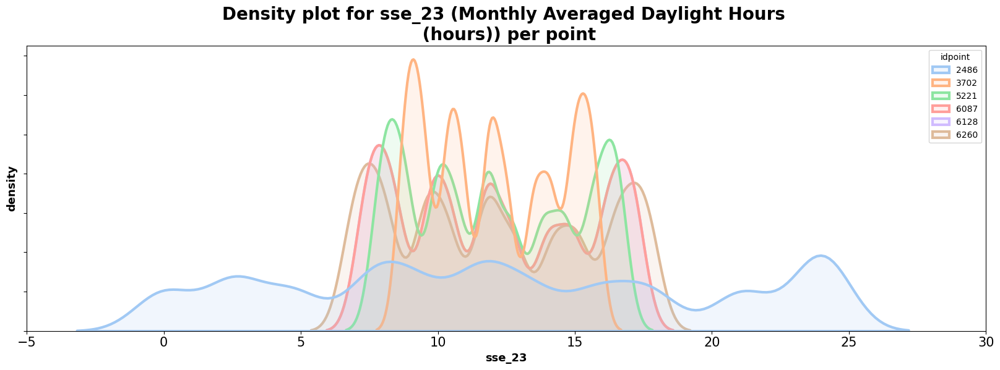

In [32]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_23', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_23', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-5, 30)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_23 (Monthly Averaged Daylight Hours \n (hours)) per point', fontweight = 'bold', fontsize = 20);

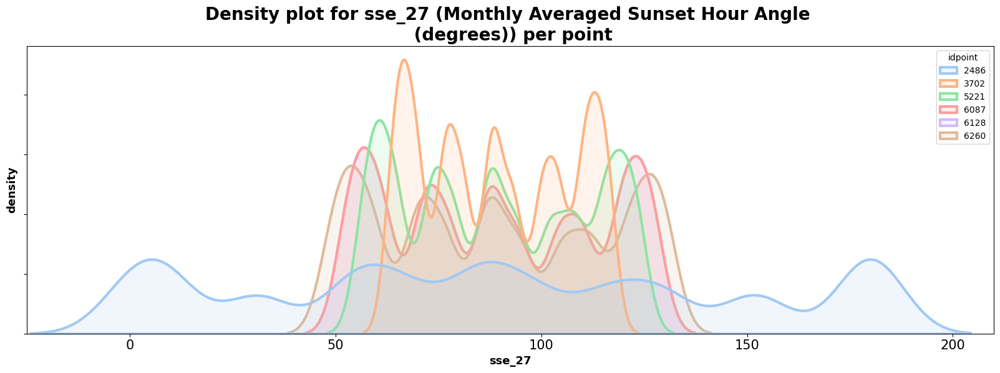

In [33]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_27', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_27', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-25, 210)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_27 (Monthly Averaged Sunset Hour Angle \n (degrees)) per point', fontweight = 'bold', fontsize = 20);

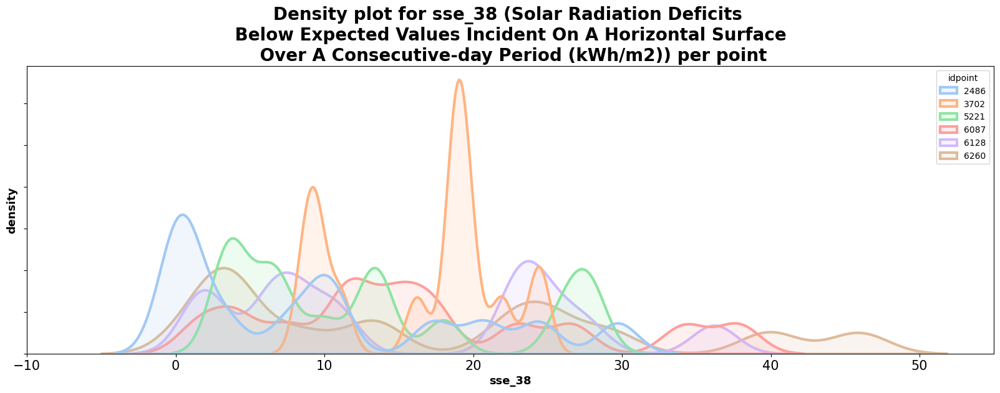

In [34]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_38', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_38', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-10, 55)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_38 (Solar Radiation Deficits \n Below Expected Values Incident On A Horizontal Surface \n Over A Consecutive-day Period (kWh/m2)) per point', fontweight = 'bold', fontsize = 20);

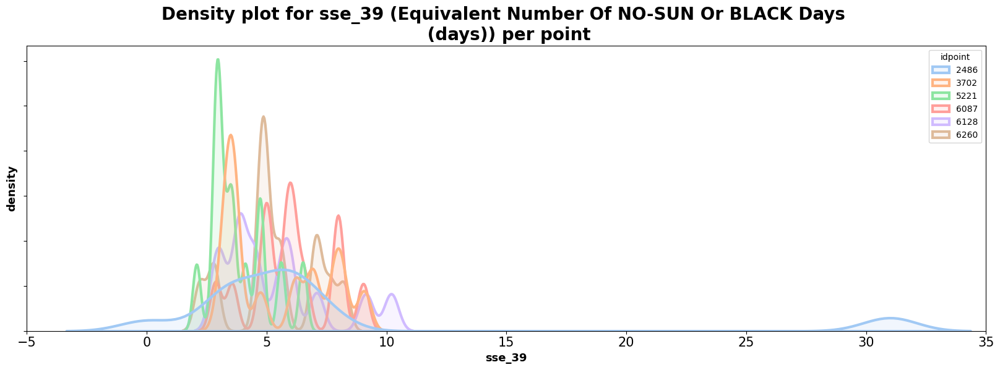

In [35]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_39', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_39', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-5, 35)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_39 (Equivalent Number Of NO-SUN Or BLACK Days \n (days)) per point', fontweight = 'bold', fontsize = 20);

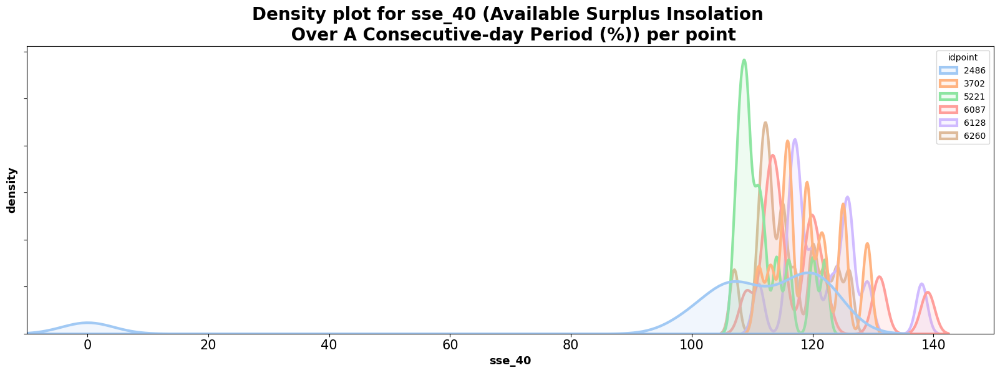

In [36]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=data, x = 'sse_40', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('sse_40', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-10, 150)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for sse_40 (Available Surplus Insolation \n Over A Consecutive-day Period (%)) per point', fontweight = 'bold', fontsize = 20);

In [207]:
#  вариант
'''cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district',\
                                 'es_label', 'district_label', 'price_zone',\
                                'sse_12', 'sse_15','sse_18', 'sse_20','sse_23','sse_27','sse_29', 'sse_38'})
'''                                
#show_correlation(data, cols)

In [173]:
# 1 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district'} - set(arr_sse))

# 2 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district',\
                                'lat','lon','es_label'} - set(arr_sse))

# 3 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district'} - set(arr_sse))

# 4 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district',\
                                'lat','lon','es_label', 'dow'} - set(arr_sse))
# 5 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'lat','lon','es_label', 'dow'} - set(arr_sse))
#show_correlation(data, cols)

In [200]:
# 6 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'lat','lon','es_label', 'dow'})

In [237]:
# 7 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'sse_10', 'sse_12', 'sse_15','sse_23','sse_27','sse_38',\
                                'lat','lon','es_label', 'dow'})

In [270]:
# 8 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'sse_10', 'sse_12', 'sse_15','sse_23','sse_27','sse_38',\
                                'sse_17', 'sse_20', 'sse_39', 'sse_40', 'month',\
                                'lat','lon','es_label', 'dow'})

In [299]:
# 9 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'sse_10', 'sse_12', 'sse_15','sse_23','sse_27','sse_38',\
                                'sse_17', 'sse_20', 'sse_39', 'sse_40', 'month',\
                                'subject_label', 'price_zone', 'district_label',\
                                'lat','lon','es_label', 'dow'})

In [325]:
# 10 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'sse_10', 'sse_12', 'sse_15','sse_23','sse_27','sse_38',\
                                'sse_17', 'sse_20', 'sse_39', 'sse_40', 'month',\
                                'subject_label', 'price_zone', 'district_label',\
                                'sse_29','hour','t_2m',\
                                'lat','lon','es_label', 'dow'})

In [326]:
cols

['albedo',
 'sse_18',
 'sse_45',
 'ceres_hevel395',
 'datatime',
 'sse_42',
 'ghi',
 'idpoint',
 'sse_30',
 'wind']

In [346]:
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district'})

C:\Users\talic\AppData\Local\Temp\ipykernel_12164\3560812266.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df[features].corr()


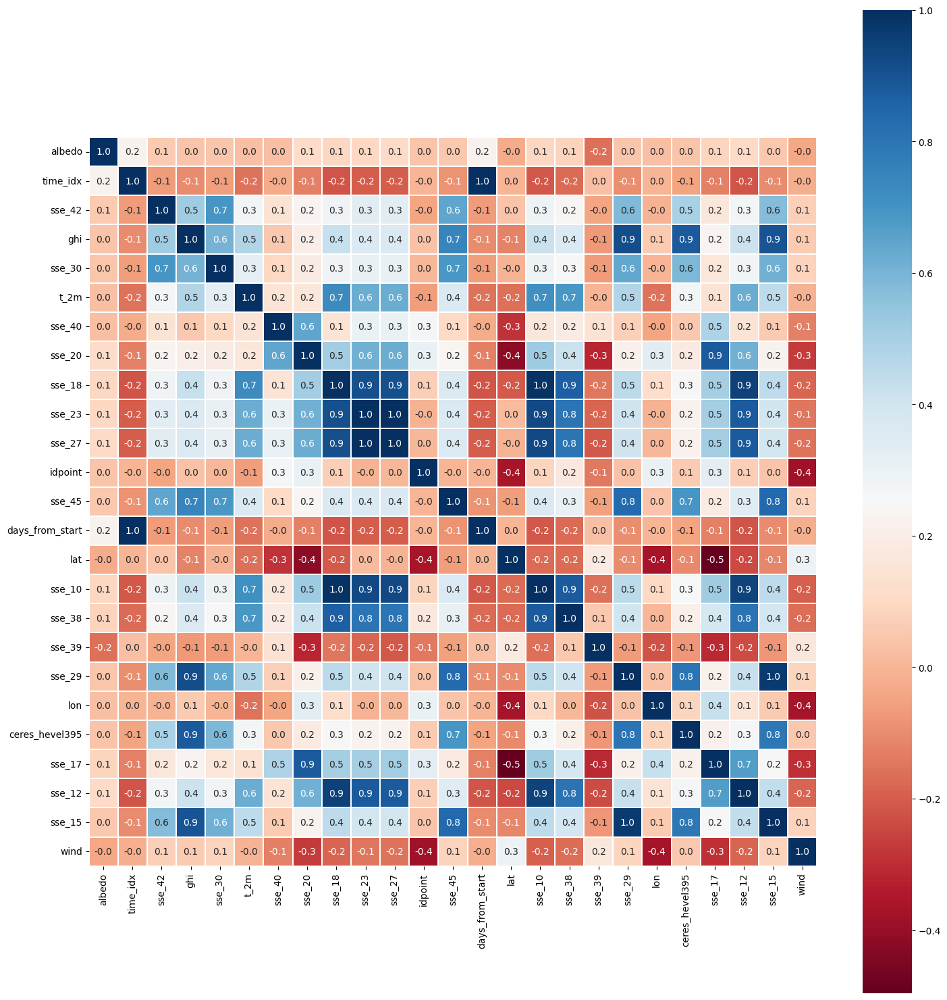

In [347]:
# Корреляция основных признаков
show_correlation(data, cols)

**Выводы:**
- С функцией хорошо коррелтрует только ghi (0.9) и слабо t_2m (0.3)
- зато слишком хорошо коррелируют признаки между собой:

    price_zone & lon (0.9)
    
    es_label & district_label (0.9)
    
    lat & (es_label | district_label) (-0.9)
    

**Подготовка данных**

- группировка данных по idpoint: датасет содержит временные ряды для географических точек

Наши target'ы: **ceres_hevel395 и ceres_jam72s**, хорошо кореллируют с альбедо и температурой

In [39]:
data

,lat,lon,month,hour,datatime,ceres_5,ceres_6,ceres_albedo,ceres_t_2m,ceres_wind,...,sse_10,sse_12,sse_17,sse_18,sse_20,sse_23,sse_27,sse_38,sse_39,sse_40
0,69,33,1,1,2020-01-15 01:00:00,0.0,0.0,0.0,-3.4,7.0,...,0.00,0.00,0.23,0.01,0.23,2.54,8.860000,0.0,31.00,100.0
1,69,33,1,2,2020-01-15 02:00:00,0.0,0.0,0.0,-3.5,7.0,...,0.00,0.00,0.23,0.01,0.23,2.54,8.860000,0.0,31.00,100.0
2,69,33,1,3,2020-01-15 03:00:00,0.0,0.0,0.0,-3.6,6.7,...,0.00,0.00,0.23,0.01,0.23,2.54,8.860000,0.0,31.00,100.0
3,69,33,1,4,2020-01-15 04:00:00,0.0,0.0,0.0,-3.4,6.2,...,0.00,0.00,0.23,0.01,0.23,2.54,8.860000,0.0,31.00,100.0
4,69,33,1,5,2020-01-15 05:00:00,0.0,0.0,0.0,-3.1,5.6,...,0.00,0.00,0.23,0.01,0.23,2.54,8.860000,0.0,31.00,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116203,57,65,3,20,2022-03-31 20:00:00,0.0,0.0,0.0,-2.4,2.2,...,1.48,3.69,0.48,3.86,0.67,11.80,87.199997,13.3,4.72,113.0
116204,57,65,3,21,2022-03-31 21:00:00,0.0,0.0,0.0,-4.6,2.4,...,1.48,3.69,0.48,3.86,0.67,11.80,87.199997,13.3,4.72,113.0
116205,57,65,3,22,2022-03-31 22:00:00,0.0,0.0,0.0,-4.5,2.4,...,1.48,3.69,0.48,3.86,0.67,11.80,87.199997,13.3,4.72,113.0
116206,57,65,3,23,2022-03-31 23:00:00,0.0,0.0,0.0,-5.0,2.3,...,1.48,3.69,0.48,3.86,0.67,11.80,87.199997,13.3,4.72,113.0


### Подготовка индекса времени

In [328]:
#train = data.set_index('datatime')[:6*8760*2].copy()
index_cutoff = 6*8760*2
data = data.set_index('datatime').copy()
earliest_time = data.index.min()
earliest_time

Timestamp('2020-01-15 01:00:00')

In [329]:
start_date = min(data.fillna(method='ffill').dropna().index)
end_date = max(data.fillna(method='bfill').dropna().index)
start_date, end_date

(Timestamp('2020-01-15 01:00:00'), Timestamp('2022-04-01 00:00:00'))

In [330]:
active_range = (data.index >= start_date) & (data.index <= end_date)
data = data[active_range].fillna(0.)

In [331]:
date = data.index
data['time_idx'] = ((date - earliest_time).seconds / 60 / 60 + (date - earliest_time).days * 24).astype('int')

data['days_from_start'] = (date - earliest_time).days
data['datatime'] = date
data.reset_index(drop=True, inplace=True)

In [121]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116208 entries, 0 to 116207
Data columns (total 40 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   lat              116208 non-null  int16         
 1   lon              116208 non-null  int16         
 2   month            116208 non-null  int16         
 3   hour             116208 non-null  int16         
 4   ceres_5          116208 non-null  float32       
 5   ceres_6          116208 non-null  float32       
 6   ceres_albedo     116208 non-null  float32       
 7   ceres_t_2m       116208 non-null  float32       
 8   ceres_wind       116208 non-null  float32       
 9   ghi              116208 non-null  float32       
 10  albedo           116208 non-null  float32       
 11  t_2m             116208 non-null  float32       
 12  wind             116208 non-null  float32       
 13  ceres_hevel395   116208 non-null  float32       
 14  icon_hevel395    116

In [332]:
data = create_features(data)

In [180]:
'''
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
    'ceres_wind', 'ceres_albedo', \
    'icon_hevel395', 'icon_jam72s',\
    'es', 'subject', 'district',\
    'es_label', 'subject_label', 'district_label', \
    'price_zone', 'lat', 'lon',\
    'day', 'year', 'sse_15', 'sse_27','sse_10'})


cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district',\
                                 'es_label', 'district_label', 'price_zone',\
                                'sse_12', 'sse_15','sse_18', 'sse_20','sse_23','sse_27','sse_29', 'sse_38'})
'''
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district'} - set(arr_sse))
#Вариант2 
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district',\
                                'lat','lon','es_label'} - set(arr_sse))

# 3 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district'} - set(arr_sse))
# 4 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district',\
                                'lat','lon','es_label', 'dow'} - set(arr_sse))

# 5 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'lat','lon','es_label', 'dow'} - set(arr_sse))
cols

['albedo',
 'price_zone',
 'time_idx',
 'month',
 'ceres_hevel395',
 'district_label',
 'days_from_start',
 'datatime',
 'subject_label',
 'wind',
 'hour',
 'ghi',
 'idpoint',
 't_2m']

In [333]:
# 6 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'lat','lon','es_label', 'dow'})
# 7 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'sse_10', 'sse_12', 'sse_15','sse_23','sse_27','sse_38',\
                                'lat','lon','es_label', 'dow'})
# 8 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'sse_10', 'sse_12', 'sse_15','sse_23','sse_27','sse_38',\
                                'sse_17', 'sse_20', 'sse_39', 'sse_40', 'month',\
                                'lat','lon','es_label', 'dow'})

# 9 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'sse_10', 'sse_12', 'sse_15','sse_23','sse_27','sse_38',\
                                'sse_17', 'sse_20', 'sse_39', 'sse_40', 'month',\
                                'subject_label', 'price_zone', 'district_label',\
                                'lat','lon','es_label', 'dow'})

# 10 вариант
cols = list(set(data.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
                                 'ceres_wind', 'ceres_albedo', \
                                'icon_hevel395', 'icon_jam72s',\
                                'es', 'subject', 'district','day','year',\
                                'sse_10', 'sse_12', 'sse_15','sse_23','sse_27','sse_38',\
                                'sse_17', 'sse_20', 'sse_39', 'sse_40', 'month',\
                                'subject_label', 'price_zone', 'district_label',\
                                'sse_29','hour','t_2m',\
                                'lat','lon','es_label', 'dow'})
cols

['albedo',
 'time_idx',
 'sse_18',
 'sse_45',
 'ceres_hevel395',
 'days_from_start',
 'datatime',
 'sse_42',
 'ghi',
 'idpoint',
 'sse_30',
 'wind']

In [88]:
#data = data[cols].copy()

### Создание набора данных и загрузчиков данных

Следующим шагом является преобразование фрейма данных в набор данных временных рядов для прогнозирования. Помимо указания набору данных, какие объекты являются категориальными, а какие непрерывными, а какие статическими, а какие изменяющимися во времени, мы также должны решить, как мы нормализуем данные. Здесь мы стандартно масштабируем каждый временной ряд отдельно и указываем, что значения всегда положительные. Как правило, предпочтительнее использовать нормализацию кодера, которая динамически масштабируется для каждой последовательности кодера по мере тренировки, чтобы избежать предвзятого отношения, вызванного нормализацией. Однако вы можете принять предвзятое отношение, если у вас возникли проблемы с поиском достаточно стабильной нормализации, например, из-за того, что в ваших данных много нулей. Или вы ожидаете более стабильной нормализации в выводе. В последнем случае вы гарантируете, что не изучите “странные” переходы, которые не будут присутствовать при выполнении вывода, таким образом тренируясь на более реалистичном наборе данных.

Мы также решили использовать последние 48 часов в качестве проверочного набора.

In [25]:
#index_cutoff = 6*8760*2
#index_cutoff = 6*8760

In [334]:
time_df = data[cols][:index_cutoff].copy()

In [335]:
#time_df2 = data[cols][index_cutoff:index_cutoff+6*24*7].copy()
time_df2 = data[cols][index_cutoff:index_cutoff+6*24*7].copy()

In [336]:
time_df.idpoint.unique()

array([2486, 3702, 5221, 6087, 6128, 6260], dtype=int16)

In [249]:
time_df

,albedo,price_zone,time_idx,sse_42,ghi,sse_30,t_2m,sse_40,sse_20,sse_18,...,idpoint,sse_45,days_from_start,datatime,subject_label,sse_39,sse_29,ceres_hevel395,sse_17,wind
0,-9.99,1,0,0.0,0.00,0.0,-3.800000,100.0,0.23,0.01,...,2486,0.0,0,2020-01-15 01:00:00,28,31.00,0.0,0.0,0.23,6.2
1,-9.99,1,1,0.0,0.00,0.0,-3.800000,100.0,0.23,0.01,...,2486,0.0,0,2020-01-15 02:00:00,28,31.00,0.0,0.0,0.23,5.6
2,-9.99,1,2,0.0,0.00,0.0,-3.700000,100.0,0.23,0.01,...,2486,0.0,0,2020-01-15 03:00:00,28,31.00,0.0,0.0,0.23,5.0
3,-9.99,1,3,0.0,0.00,0.0,-3.500000,100.0,0.23,0.01,...,2486,0.0,0,2020-01-15 04:00:00,28,31.00,0.0,0.0,0.23,4.1
4,-9.99,1,4,0.0,0.00,0.0,-3.100000,100.0,0.23,0.01,...,2486,0.0,0,2020-01-15 05:00:00,28,31.00,0.0,0.0,0.23,3.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105115,0.41,1,8275,0.0,0.09,0.0,-26.700001,107.0,0.51,0.54,...,6260,0.0,344,2020-12-24 20:00:00,73,2.21,0.0,0.0,0.39,2.7
105116,0.41,1,8276,0.0,-0.04,0.0,-27.200001,107.0,0.51,0.54,...,6260,0.0,344,2020-12-24 21:00:00,73,2.21,0.0,0.0,0.39,2.7
105117,0.41,1,8277,0.0,-0.08,0.0,-27.700001,107.0,0.51,0.54,...,6260,0.0,344,2020-12-24 22:00:00,73,2.21,0.0,0.0,0.39,2.6
105118,0.41,1,8278,0.0,-0.03,0.0,-28.100000,107.0,0.51,0.54,...,6260,0.0,344,2020-12-24 23:00:00,73,2.21,0.0,0.0,0.39,2.7


In [128]:
time_df2

,albedo,year,price_zone,time_idx,day,es_label,ghi,t_2m,dow,month,district_label,hour,idpoint,days_from_start,datatime,subject_label,lat,lon,ceres_hevel395,wind
105120,0.41,2020,1,8280,25,6,0.00,-28.600000,4,12,6,1,6260,345,2020-12-25 01:00:00,73,57,65,0.0,2.6
105121,0.38,2020,1,8281,25,6,0.00,-30.100000,4,12,6,2,6260,345,2020-12-25 02:00:00,73,57,65,0.0,2.3
105122,0.38,2020,1,8282,25,6,0.02,-30.500000,4,12,6,3,6260,345,2020-12-25 03:00:00,73,57,65,0.0,2.1
105123,0.38,2020,1,8283,25,6,-0.02,-30.799999,4,12,6,4,6260,345,2020-12-25 04:00:00,73,57,65,0.0,2.0
105124,0.38,2020,1,8284,25,6,-0.08,-30.900000,4,12,6,5,6260,345,2020-12-25 05:00:00,73,57,65,0.0,1.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106123,0.47,2021,1,9283,4,6,-0.24,-13.000000,3,2,6,20,6260,386,2021-02-04 20:00:00,73,57,65,0.0,2.2
106124,0.47,2021,1,9284,4,6,0.15,-12.800000,3,2,6,21,6260,386,2021-02-04 21:00:00,73,57,65,0.0,2.2
106125,0.47,2021,1,9285,4,6,0.15,-12.500000,3,2,6,22,6260,386,2021-02-04 22:00:00,73,57,65,0.0,2.3
106126,0.47,2021,1,9286,4,6,0.05,-12.100000,3,2,6,23,6260,386,2021-02-04 23:00:00,73,57,65,0.0,2.3


In [129]:
time_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105120 entries, 0 to 105119
Data columns (total 20 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   albedo           105120 non-null  float32       
 1   year             105120 non-null  category      
 2   price_zone       105120 non-null  category      
 3   time_idx         105120 non-null  int64         
 4   day              105120 non-null  category      
 5   es_label         105120 non-null  category      
 6   ghi              105120 non-null  float32       
 7   t_2m             105120 non-null  float32       
 8   dow              105120 non-null  category      
 9   month            105120 non-null  category      
 10  district_label   105120 non-null  category      
 11  hour             105120 non-null  category      
 12  idpoint          105120 non-null  int16         
 13  days_from_start  105120 non-null  int64         
 14  datatime         105

### EDA

In [43]:
time_df[['idpoint','ceres_hevel395']].groupby('idpoint').mean()

,ceres_hevel395
idpoint,
2486,35.557204
3702,69.250125
5221,71.392167
6087,60.916568
6128,52.955359
6260,60.406624


Text(0.5, 1.0, 'Power usage of consumers')

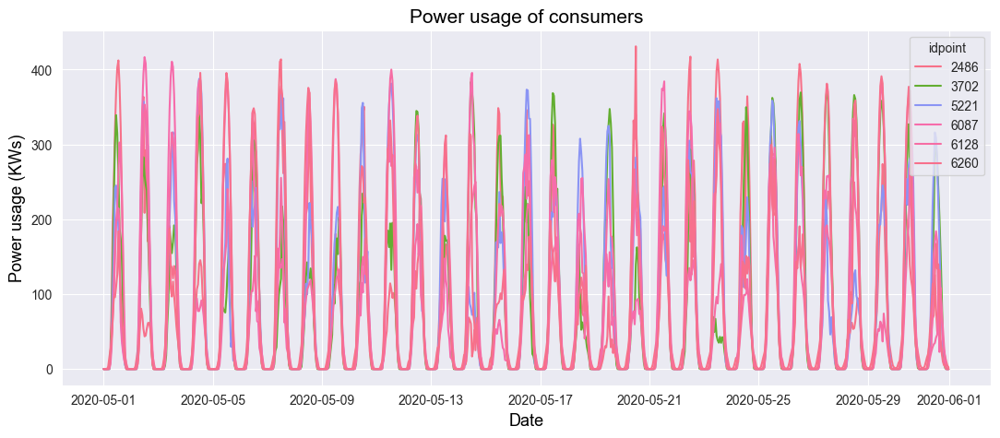

In [177]:
import seaborn as sns
import matplotlib.pyplot as plt

#plt.rcParams.update(plt.rcParamsDefault)
sns.set_style('darkgrid')
sns.color_palette("tab10")

fig, ax = plt.subplots(figsize=(13, 5))

sns.lineplot(data=data[(np.int32(data['month']) == 5)&(np.int32(data['year']) == 2020)], 
             x='datatime', 
             y='ceres_hevel395', 
             hue='idpoint', 
             legend='full',
             palette='husl').set_title('Power')

ax.set_xlabel("Date", fontdict={"color":  "black", "size": 13} )
ax.set_ylabel("Power usage (KWs)", fontdict={"color":  "black", "size": 13})
ax.tick_params(axis = 'both', which = 'major', labelsize = 10)
ax.set_title(label = "Power usage of consumers", fontdict={"color":  "black", "size": 15})

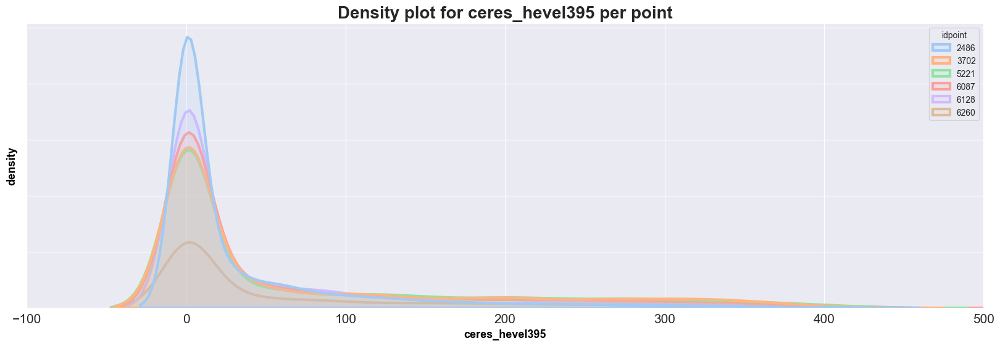

In [178]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=time_df, x = 'ceres_hevel395', hue = 'idpoint', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('ceres_hevel395', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-100, 500)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for ceres_hevel395 per point', fontweight = 'bold', fontsize = 20);

In [258]:
time_df.ceres_hevel395.describe()

count    105120.000000
mean         58.202724
std          97.493286
min           0.000000
25%           0.000000
50%           0.600000
75%          77.612501
max         459.410004
Name: ceres_hevel395, dtype: float64

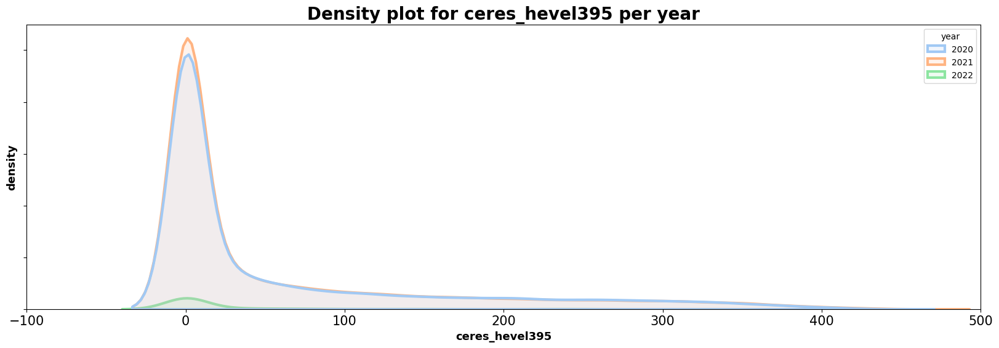

In [90]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=time_df, x = 'ceres_hevel395', hue = 'year', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('ceres_hevel395', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-100, 500)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for ceres_hevel395 per year', fontweight = 'bold', fontsize = 20);

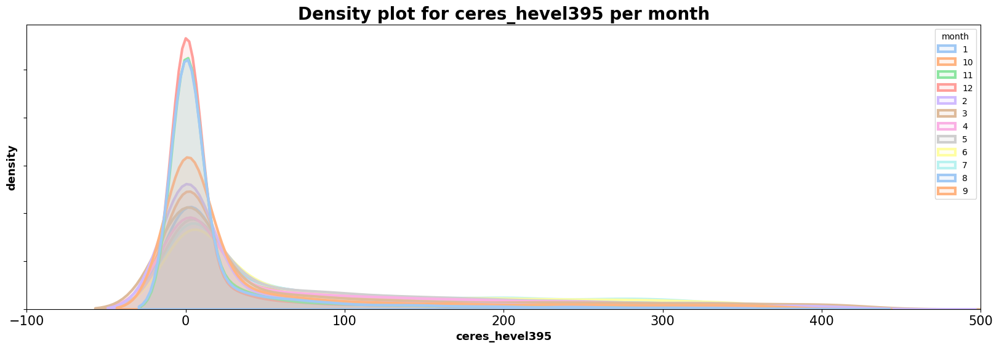

In [91]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=time_df, x = 'ceres_hevel395', hue = 'month', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('ceres_hevel395', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-100, 500)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for ceres_hevel395 per month', fontweight = 'bold', fontsize = 20);

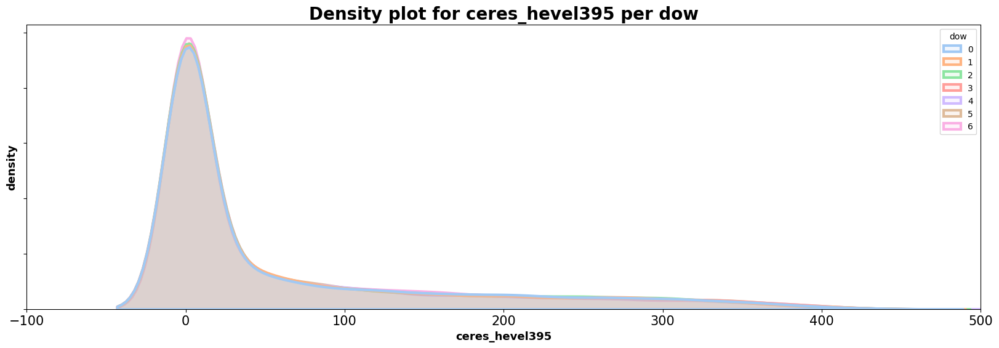

In [92]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=time_df, x = 'ceres_hevel395', hue = 'dow', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('ceres_hevel395', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-100, 500)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for ceres_hevel395 per dow', fontweight = 'bold', fontsize = 20);

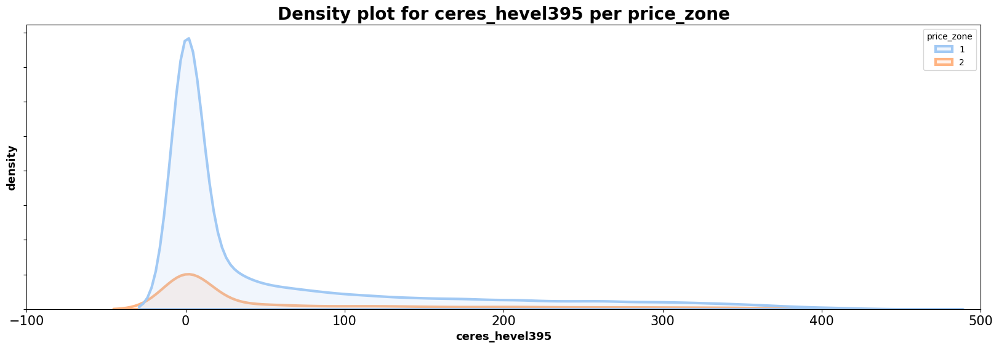

In [94]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=time_df, x = 'ceres_hevel395', hue = 'price_zone', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('ceres_hevel395', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-100, 500)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for ceres_hevel395 per price_zone', fontweight = 'bold', fontsize = 20);

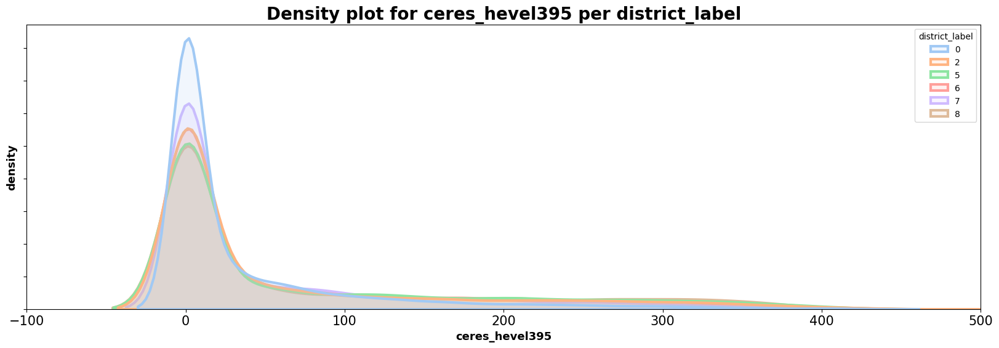

In [96]:
fig, ax = plt.subplots(1,1, figsize=(20, 6))

sns.kdeplot(data=time_df, x = 'ceres_hevel395', hue = 'district_label', fill=True, alpha = 0.15, ax = ax, linewidth=3, palette='pastel')
ax.set_xlabel('ceres_hevel395', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('density', color='black', fontweight='bold', fontsize=13)
ax.set_xlim(-100, 500)
ax.xaxis.set_tick_params(labelsize=15)
ax.yaxis.set_ticklabels([])
ax.set_title('Density plot for ceres_hevel395 per district_label', fontweight = 'bold', fontsize = 20);

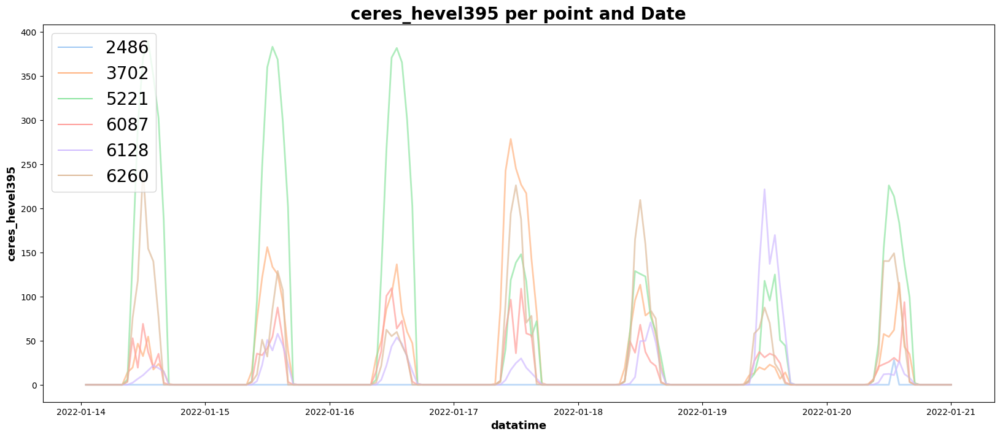

In [105]:
fig, ax = plt.subplots(1, 1, figsize = (20, 8))
sns.lineplot(x='datatime',y='ceres_hevel395',hue='idpoint',data=(time_df2.groupby(['datatime', 'idpoint']).ceres_hevel395.sum().rename('ceres_hevel395')
                                                       .reset_index().sort_values('datatime', ascending = True, ignore_index=True)), linewidth = 2, alpha = 0.7, palette='pastel')
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
#plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=120)) 
ax.set_xlabel('datatime', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('ceres_hevel395', color='black', fontweight='bold', fontsize=13)
ax.legend(fontsize = 20, loc = 'upper left')
ax.set_title('ceres_hevel395 per point and Date', fontweight = 'bold', fontsize = 20);

### Data Preparation

In [130]:
time_df["time_idx"].max()

19367

In [131]:
time_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105120 entries, 0 to 105119
Data columns (total 20 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   albedo           105120 non-null  float32       
 1   year             105120 non-null  category      
 2   price_zone       105120 non-null  category      
 3   time_idx         105120 non-null  int64         
 4   day              105120 non-null  category      
 5   es_label         105120 non-null  category      
 6   ghi              105120 non-null  float32       
 7   t_2m             105120 non-null  float32       
 8   dow              105120 non-null  category      
 9   month            105120 non-null  category      
 10  district_label   105120 non-null  category      
 11  hour             105120 non-null  category      
 12  idpoint          105120 non-null  int16         
 13  days_from_start  105120 non-null  int64         
 14  datatime         105

In [252]:
varient = 6

max_prediction_length = 2*24
max_encoder_length = 7*24
training_cutoff = time_df["time_idx"].max() - max_encoder_length

if varient == 1:
    training = TimeSeriesDataSet(
        time_df[lambda x: x.time_idx <= training_cutoff],
        time_idx="time_idx",
        target="ceres_hevel395", #["ceres_jam72s", "ceres_hevel395"],
        group_ids=["idpoint"],
        min_encoder_length=max_encoder_length, # // 2,  # keep encoder length long (as it is in the validation set)
        max_encoder_length=max_encoder_length,
        min_prediction_length=1,
        max_prediction_length=max_prediction_length,
        static_categoricals=["price_zone", "es_label", "subject_label", "district_label"],
        #static_reals=["avg_population_2017", "avg_yearly_household_income_2017"],
        time_varying_known_categoricals=["year", "month", "day", "hour", "dow"],
        #variable_groups={"hour": hour},  # group of categorical variables can be treated as one variable
        time_varying_known_reals=["time_idx", "ghi", "albedo", "t_2m", "wind"],
        time_varying_unknown_categoricals=[],
        time_varying_unknown_reals=["ceres_hevel395"],
        target_normalizer=GroupNormalizer(
            groups=["idpoint"], transformation="softplus"
        ),  # use softplus and normalize by group
        add_relative_time_idx=True,
        add_target_scales=True,
        add_encoder_length=True,
    )
if varient == 3:
    training = TimeSeriesDataSet(
        time_df[lambda x: x.time_idx <= training_cutoff],
        time_idx="time_idx",
        target="ceres_hevel395", #["ceres_jam72s", "ceres_hevel395"],
        group_ids=["idpoint"],
        min_encoder_length=max_encoder_length, # // 2,  # keep encoder length long (as it is in the validation set)
        max_encoder_length=max_encoder_length,
        min_prediction_length=1,
        max_prediction_length=max_prediction_length,
        static_categoricals=["price_zone", "es_label", "subject_label", "district_label"],
        static_reals=["lat", "lon"], #!!!!
        time_varying_known_categoricals=["year", "month", "day", "hour", "dow"],
        #variable_groups={"hour": hour},  # group of categorical variables can be treated as one variable
        time_varying_known_reals=["time_idx", "ghi", "albedo", "t_2m", "wind"],
        time_varying_unknown_categoricals=[],
        time_varying_unknown_reals=["ceres_hevel395"],
        target_normalizer=GroupNormalizer(
            groups=["idpoint"], transformation="softplus"
        ),  # use softplus and normalize by group
        add_relative_time_idx=True,
        add_target_scales=True,
        add_encoder_length=True,
    )
    
if varient == 2:
    training = TimeSeriesDataSet(
        time_df[lambda x: x.time_idx <= training_cutoff],
        time_idx="time_idx",
        target="ceres_hevel395", #["ceres_jam72s", "ceres_hevel395"],
        group_ids=["idpoint"],
        min_encoder_length=max_encoder_length, # // 2,  # keep encoder length long (as it is in the validation set)
        max_encoder_length=max_encoder_length,
        min_prediction_length=1,
        max_prediction_length=max_prediction_length,
        static_categoricals=["price_zone", "subject_label", "district_label"],
        #static_reals=["avg_population_2017", "avg_yearly_household_income_2017"],
        time_varying_known_categoricals=["year", "month", "day", "hour", "dow"],
        #variable_groups={"hour": hour},  # group of categorical variables can be treated as one variable
        time_varying_known_reals=["time_idx", "ghi", "albedo", "t_2m", "wind"],
        time_varying_unknown_categoricals=[],
        time_varying_unknown_reals=["ceres_hevel395"],
        target_normalizer=GroupNormalizer(
            groups=["idpoint"], transformation="softplus"
        ),  # use softplus and normalize by group
        add_relative_time_idx=True,
        add_target_scales=True,
        add_encoder_length=True,
    )
if varient == 4:
    training = TimeSeriesDataSet(
        time_df[lambda x: x.time_idx <= training_cutoff],
        time_idx="time_idx",
        target="ceres_hevel395", #["ceres_jam72s", "ceres_hevel395"],
        group_ids=["idpoint"],
        min_encoder_length=max_encoder_length, # // 2,  # keep encoder length long (as it is in the validation set)
        max_encoder_length=max_encoder_length,
        min_prediction_length=1,
        max_prediction_length=max_prediction_length,
        static_categoricals=["price_zone", "subject_label", "district_label"],
        #static_reals=["avg_population_2017", "avg_yearly_household_income_2017"],
        time_varying_known_categoricals=["year", "month", "day", "hour"],
        #variable_groups={"hour": hour},  # group of categorical variables can be treated as one variable
        time_varying_known_reals=["time_idx", "ghi", "albedo", "t_2m", "wind"],
        time_varying_unknown_categoricals=[],
        time_varying_unknown_reals=["ceres_hevel395"],
        target_normalizer=GroupNormalizer(
            groups=["idpoint"], transformation="softplus"
        ),  # use softplus and normalize by group
        add_relative_time_idx=True,
        add_target_scales=True,
        add_encoder_length=True,
    ) 
    
if varient == 5:
    training = TimeSeriesDataSet(
        time_df[lambda x: x.time_idx <= training_cutoff],
        time_idx="time_idx",
        target="ceres_hevel395", #["ceres_jam72s", "ceres_hevel395"],
        group_ids=["idpoint"],
        min_encoder_length=max_encoder_length, # // 2,  # keep encoder length long (as it is in the validation set)
        max_encoder_length=max_encoder_length,
        min_prediction_length=1,
        max_prediction_length=max_prediction_length,
        static_categoricals=["price_zone", "subject_label", "district_label"],
        #static_reals=["avg_population_2017", "avg_yearly_household_income_2017"],
        time_varying_known_categoricals=["month", "hour"],
        #variable_groups={"hour": hour},  # group of categorical variables can be treated as one variable
        time_varying_known_reals=["time_idx", "ghi", "albedo", "t_2m", "wind"],
        time_varying_unknown_categoricals=[],
        time_varying_unknown_reals=["ceres_hevel395"],
        target_normalizer=GroupNormalizer(
            groups=["idpoint"], transformation="softplus"
        ),  # use softplus and normalize by group
        add_relative_time_idx=True,
        add_target_scales=True,
        add_encoder_length=True,
    )     

if varient == 6:
    training = TimeSeriesDataSet(
        time_df[lambda x: x.time_idx <= training_cutoff],
        time_idx="time_idx",
        target="ceres_hevel395", #["ceres_jam72s", "ceres_hevel395"],
        group_ids=["idpoint"],
        min_encoder_length=max_encoder_length, # // 2,  # keep encoder length long (as it is in the validation set)
        max_encoder_length=max_encoder_length,
        min_prediction_length=1,
        max_prediction_length=max_prediction_length,
        static_categoricals=["price_zone", "subject_label", "district_label"],
        static_reals=arr_sse[:-5],
        time_varying_known_categoricals=["month", "hour"],
        #variable_groups={"hour": hour},  # group of categorical variables can be treated as one variable
        time_varying_known_reals=["time_idx", "ghi", "albedo", "t_2m", "wind"]+arr_sse[:-5],
        time_varying_unknown_categoricals=[],
        time_varying_unknown_reals=["ceres_hevel395"],
        target_normalizer=GroupNormalizer(
            groups=["idpoint"], transformation="softplus"
        ),  # use softplus and normalize by group
        add_relative_time_idx=True,
        add_target_scales=True,
        add_encoder_length=True,
    )        
    
# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(training, time_df, predict=True, stop_randomization=True)

# create dataloaders for model
batch_size = 32  # set this between 32 to 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=2,)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=2,)


KeyError: "None of [Index(['sse_10'], dtype='object')] are in the [columns]"

In [337]:
varient = 10

max_prediction_length = 2*24
max_encoder_length = 7*24
training_cutoff = time_df["time_idx"].max() - max_encoder_length

if varient == 7:
    training = TimeSeriesDataSet(
        time_df[lambda x: x.time_idx <= training_cutoff],
        time_idx="time_idx",
        target="ceres_hevel395", #["ceres_jam72s", "ceres_hevel395"],
        group_ids=["idpoint"],
        min_encoder_length=max_encoder_length, # // 2,  # keep encoder length long (as it is in the validation set)
        max_encoder_length=max_encoder_length,
        min_prediction_length=1,
        max_prediction_length=max_prediction_length,
        static_categoricals=["price_zone", "subject_label", "district_label"],
        static_reals=['sse_17','sse_20','sse_39','sse_40'],
        time_varying_known_categoricals=["month", "hour"],
        #variable_groups={"hour": hour},  # group of categorical variables can be treated as one variable
        time_varying_known_reals=["time_idx", "ghi", "albedo", "t_2m", "wind","sse_29","sse_30","sse_42","sse_45"],
        time_varying_unknown_categoricals=[],
        time_varying_unknown_reals=["ceres_hevel395"],
        target_normalizer=GroupNormalizer(
            groups=["idpoint"], transformation="softplus"
        ),  # use softplus and normalize by group
        add_relative_time_idx=True,
        add_target_scales=True,
        add_encoder_length=True,
    )  
    
if varient == 8:
    training = TimeSeriesDataSet(
        time_df[lambda x: x.time_idx <= training_cutoff],
        time_idx="time_idx",
        target="ceres_hevel395", #["ceres_jam72s", "ceres_hevel395"],
        group_ids=["idpoint"],
        min_encoder_length=max_encoder_length, # // 2,  # keep encoder length long (as it is in the validation set)
        max_encoder_length=max_encoder_length,
        min_prediction_length=1,
        max_prediction_length=max_prediction_length,
        static_categoricals=["price_zone", "subject_label", "district_label"],
        #static_reals=['sse_17','sse_20','sse_39','sse_40'],
        time_varying_known_categoricals=["hour"], #"month", 
        #variable_groups={"hour": hour},  # group of categorical variables can be treated as one variable
        time_varying_known_reals=["time_idx", "ghi", "albedo", "t_2m", "wind","sse_29","sse_30","sse_42","sse_45"],
        time_varying_unknown_categoricals=[],
        time_varying_unknown_reals=["ceres_hevel395"],
        target_normalizer=GroupNormalizer(
            groups=["idpoint"], transformation="softplus"
        ),  # use softplus and normalize by group
        add_relative_time_idx=True,
        add_target_scales=True,
        add_encoder_length=True,
    )   

if varient == 9:
    training = TimeSeriesDataSet(
        time_df[lambda x: x.time_idx <= training_cutoff],
        time_idx="time_idx",
        target="ceres_hevel395", #["ceres_jam72s", "ceres_hevel395"],
        group_ids=["idpoint"],
        min_encoder_length=max_encoder_length, # // 2,  # keep encoder length long (as it is in the validation set)
        max_encoder_length=max_encoder_length,
        min_prediction_length=1,
        max_prediction_length=max_prediction_length,
        #static_categoricals=["price_zone", "subject_label", "district_label"],
        #static_reals=['sse_17','sse_20','sse_39','sse_40'],
        time_varying_known_categoricals=["hour"], #"month", 
        #variable_groups={"hour": hour},  # group of categorical variables can be treated as one variable
        time_varying_known_reals=["time_idx", "ghi", "albedo", "t_2m", "wind","sse_29","sse_30","sse_42","sse_45"],
        time_varying_unknown_categoricals=[],
        time_varying_unknown_reals=["ceres_hevel395"],
        target_normalizer=GroupNormalizer(
            groups=["idpoint"], transformation="softplus"
        ),  # use softplus and normalize by group
        add_relative_time_idx=True,
        add_target_scales=True,
        add_encoder_length=True,
    )  

if varient == 10:
    training = TimeSeriesDataSet(
        time_df[lambda x: x.time_idx <= training_cutoff],
        time_idx="time_idx",
        target="ceres_hevel395", #["ceres_jam72s", "ceres_hevel395"],
        group_ids=["idpoint"],
        min_encoder_length=max_encoder_length, # // 2,  # keep encoder length long (as it is in the validation set)
        max_encoder_length=max_encoder_length,
        min_prediction_length=1,
        max_prediction_length=max_prediction_length,
        #static_categoricals=["price_zone", "subject_label", "district_label"],
        #static_reals=['sse_17','sse_20','sse_39','sse_40'],
        #time_varying_known_categoricals=["hour"], #"month", 
        #variable_groups={"hour": hour},  # group of categorical variables can be treated as one variable
        time_varying_known_reals=["time_idx", "ghi", "albedo", "wind","sse_30","sse_42","sse_45"],
        time_varying_unknown_categoricals=[],
        time_varying_unknown_reals=["ceres_hevel395"],
        target_normalizer=GroupNormalizer(
            groups=["idpoint"], transformation="softplus"
        ),  # use softplus and normalize by group
        add_relative_time_idx=True,
        add_target_scales=True,
        add_encoder_length=True,
    )  
    
# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(training, time_df, predict=True, stop_randomization=True)

# create dataloaders for model
batch_size = 32  # set this between 32 to 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=2,)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=2,)


### Базовая модель

In [255]:
actuals = torch.cat([y for x, (y, weight) in iter(val_dataloader)])
baseline_predictions = Baseline().predict(val_dataloader)
(actuals - baseline_predictions).abs().mean().item()

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(


72.78031158447266

### Find optimal learning rate

Перед началом тренировки вы можете определить оптимальную скорость обучения с помощью Pitch Lightning learning rate finder.

In [338]:
# configure network and trainer
pl.seed_everything(42)
trainer = pl.Trainer(
    accelerator='gpu',
    # clipping gradients is a hyperparameter and important to prevent divergance
    # of the gradient for recurrent neural networks
    gradient_clip_val=0.1,
)


tft = TemporalFusionTransformer.from_dataset(
    training,
    optimizer='adam',
    # not meaningful for finding the learning rate but otherwise very important
    learning_rate=0.0001,
    hidden_size=16,  # most important hyperparameter apart from learning rate
    # number of attention heads. Set to up to 4 for large datasets
    attention_head_size=1,
    dropout=0.1,  # between 0.1 and 0.3 are good values
    hidden_continuous_size=8,  # set to <= hidden_size
    output_size=7,  # 7 quantiles by default
    loss=QuantileLoss(),
    # reduce learning rate if no improvement in validation loss after x epochs
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

Global seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Number of parameters in network: 26.8k


C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(


C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\loops\utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
  rank_zero_warn(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the

Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=100` reached.
Restoring states from the checkpoint path at C:\Users\talic\Skillfactory\ВременныеРяды\.lr_find_7e16b130-687f-443d-aae3-c591399b1498.ckpt
Restored all states from the checkpoint file at C:\Users\talic\Skillfactory\ВременныеРяды\.lr_find_7e16b130-687f-443d-aae3-c591399b1498.ckpt


suggested learning rate: 0.048977881936844644


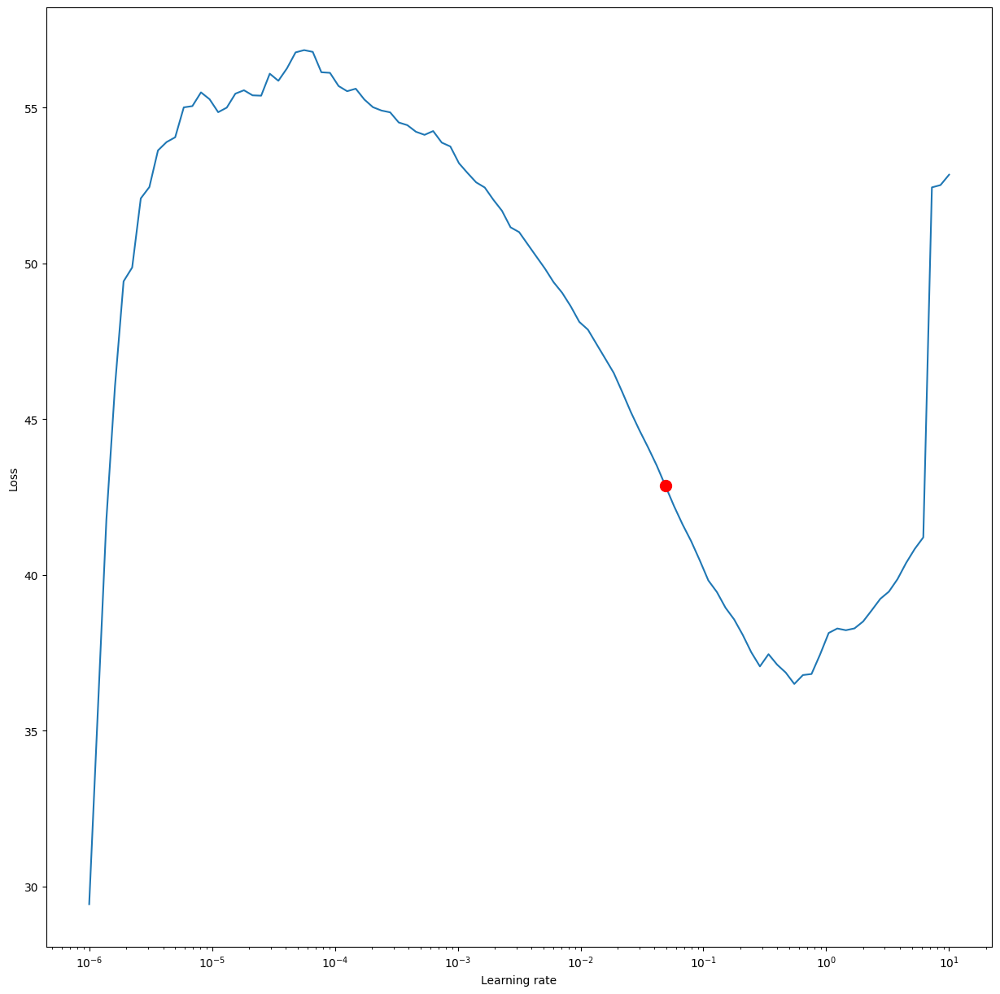

C:\Users\talic\AppData\Local\Temp\ipykernel_12164\546886897.py:12: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


In [339]:
# find optimal learning rate
res = trainer.tuner.lr_find(
    tft,   
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
    max_lr=10.0,
    min_lr=1e-6,
    )

print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()

### Train model

In [340]:
# configure network and trainer
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=-1,
    accelerator='gpu', devices=1,
    enable_model_summary=True,
    gradient_clip_val=0.1,
    limit_train_batches=50,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)


tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.048977881936844644,
    hidden_size=16,
    attention_head_size=1,
    dropout=0.1,
    hidden_continuous_size=8,
    output_size=7,  # 7 quantiles by default
    loss=QuantileLoss(),
    log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Number of parameters in network: 26.8k


На моем Macbook обучение занимает пару минут, но для больших сетей и наборов данных это может занять часы. Скорость обучения здесь в основном определяется накладными расходами, и выбор большего размера пакета или скрытого размера (т.е. размера сети) не замедляет обучение линейно, что делает возможным обучение на больших наборах данных. Во время обучения мы можем отслеживать цензорную доску, которую можно развернуть с помощью tensorboard --logdir=lightning_logs. Например, мы можем отслеживать предсказания примеров в наборе для обучения и проверки.

In [70]:
# Start tensorboard
#%load_ext tensorboard
#%tensorboard --logdir lightning_logs

In [69]:
%tensorboard --logdir lightning_logs

In [341]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 0     
3  | prescalers                         | ModuleDict                      | 192   
4  | static_variable_selection          | VariableSelectionNetwork        | 1.7 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 5.9 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 5.1 K 
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.1 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 1.1 K 
9  | static_context_initial_cell_lstm 

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

### Load and Save the Best Model

In [342]:
best_model_path = trainer.checkpoint_callback.best_model_path
print(best_model_path)
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

lightning_logs\lightning_logs\version_53\checkpoints\epoch=31-step=1600.ckpt


In [343]:
#!rar  -r model.zip lightning_logs/lightning_logs/version_1/*
'''
import pickle
with open(r'f:\tmp\tft.pickle', 'wb') as fle:
    pickle.dump(best_tft, fle, protocol=pickle.HIGHEST_PROTOCOL)
'''
# Сохранение
from joblib import dump

dump(best_tft, 'g:/tmp/best_tft_6_10.joblib')

['g:/tmp/best_tft_6_10.joblib']

In [344]:
from joblib import load
best_tft = load(r'g:/tmp/best_tft_6_10.joblib')

In [345]:
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft.predict(val_dataloader)

#average p50 loss overall
print((actuals - predictions).abs().mean().item())
#average p50 loss per time series
print((actuals - predictions).abs().mean(axis=1))

16.159263610839844
tensor([ 9.5394, 22.6240,  9.1129, 17.1393, 33.5050,  5.0351])


In [56]:
#Take a look at what the raw_predictions variable contains

raw_predictions, x = best_tft.predict(val_dataloader, mode="raw", return_x=True)
print(raw_predictions._fields)
# ('prediction', 
# 'encoder_attention', 
# 'decoder_attention', 
# 'static_variables', 
# 'encoder_variables', 
# 'decoder_variables', 
# 'decoder_lengths', 
# 'encoder_lengths')

print('\n')
print(raw_predictions['prediction'].shape)
#torch.Size([5, 24, 7])

# We get predictions of 5 time-series for 24 days.
# For each day we get 7 predictions - these are the 7 quantiles:
#[0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98]
# We are mostly interested in the 4th quantile which represents, let's say, the 'median loss'
# fyi, although docs use the term quantiles, the most accurate term are percentiles


('prediction', 'encoder_attention', 'decoder_attention', 'static_variables', 'encoder_variables', 'decoder_variables', 'decoder_lengths', 'encoder_lengths')


torch.Size([6, 48, 7])


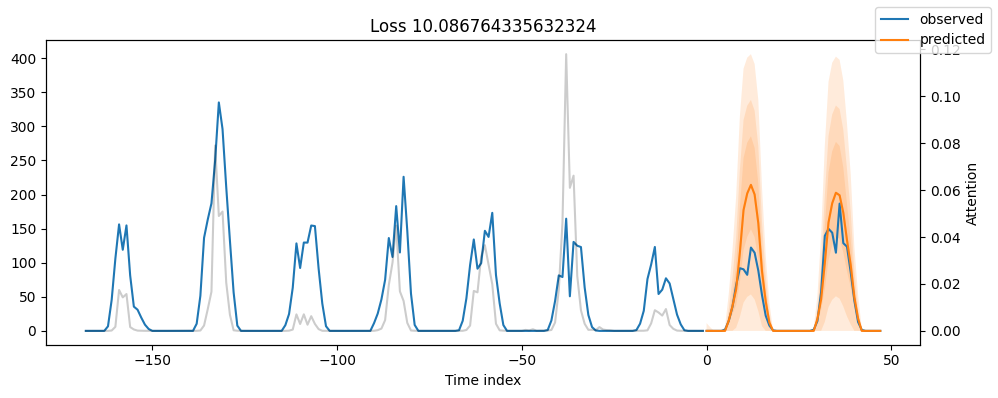

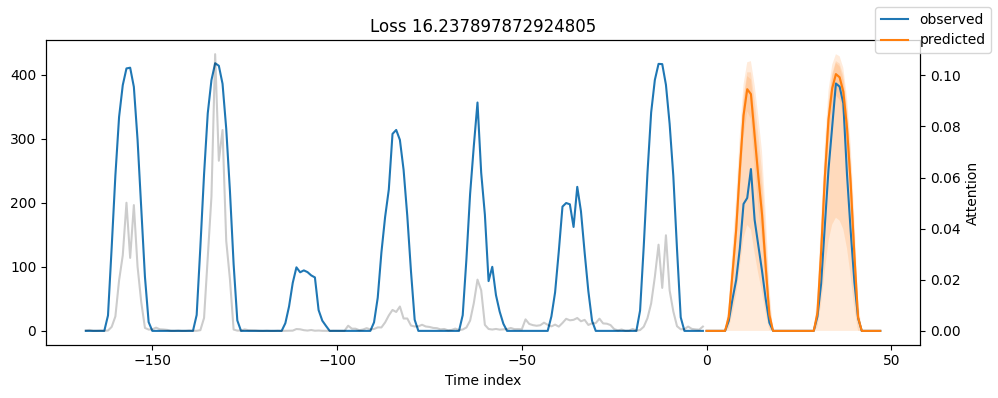

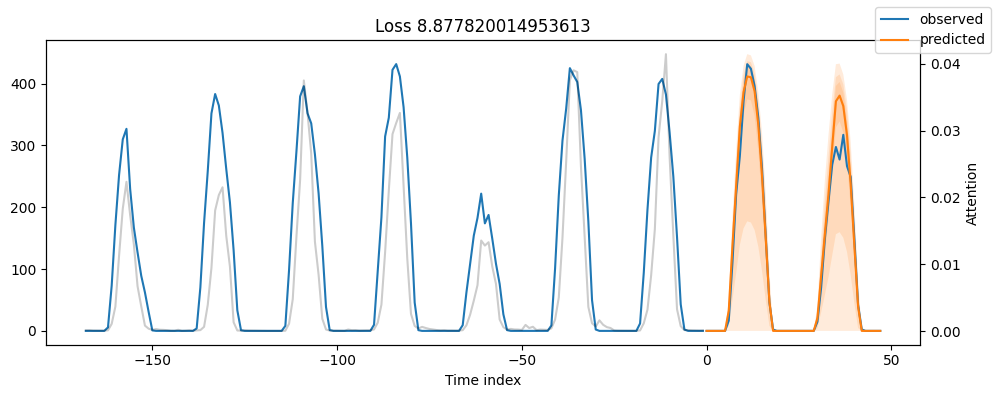

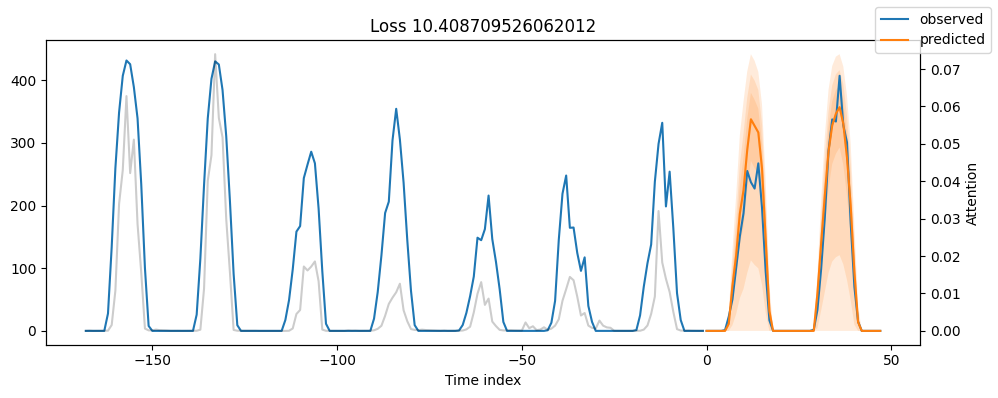

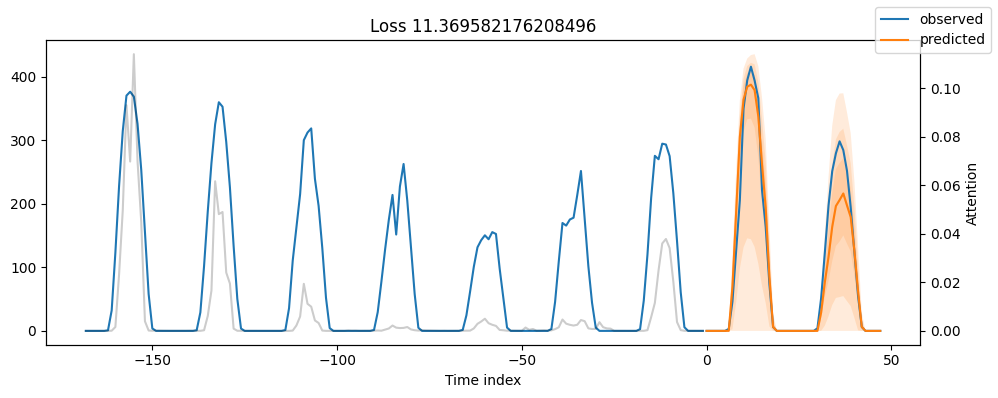

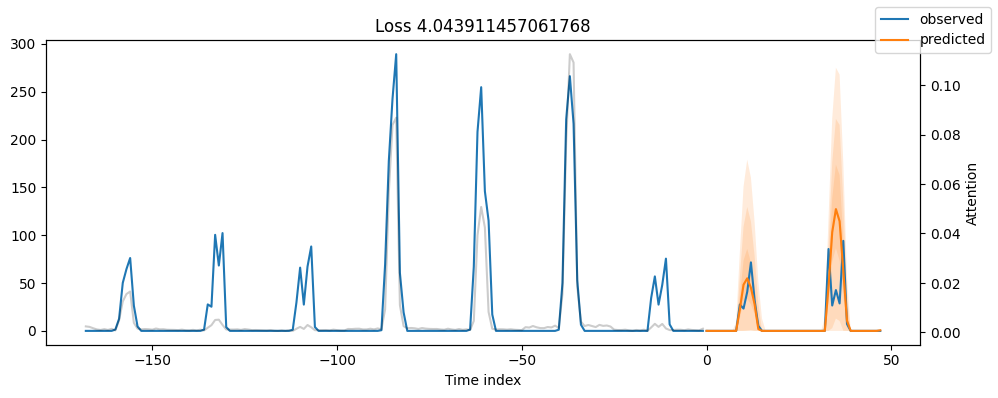

In [57]:
for idx in range(6):  # plot all 5 consumers
    fig, ax = plt.subplots(figsize=(10, 4))
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True,ax=ax)


### Hyperparameter tuning

In [196]:
import pickle

from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters

# create study
study = optimize_hyperparameters(
    train_dataloader,
    val_dataloader,
    model_path="optuna_test",
    n_trials=200,
    max_epochs=50,
    gradient_clip_val_range=(0.01, 1.0),
    hidden_size_range=(8, 128),
    hidden_continuous_size_range=(8, 128),
    attention_head_size_range=(1, 4),
    learning_rate_range=(0.001, 0.1),
    dropout_range=(0.1, 0.3),
    trainer_kwargs=dict(limit_train_batches=50),
    reduce_on_plateau_patience=4,
    use_learning_rate_finder=False,  # use Optuna to find ideal learning rate or use in-built learning rate finder
)

# save study results - also we can resume tuning at a later point in time
with open("test_study.pkl", "wb") as fout:
    pickle.dump(study, fout)

# show best hyperparameters
print(study.best_trial.params)

[I 2023-03-06 21:09:29,981] A new study created in memory with name: no-name-20edd89f-d8e5-4224-a289-07575eb51d31
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWar

[I 2023-03-06 21:41:51,306] Trial 2 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an i

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:604: UserWarning: Checkpoint directory C:\Users\talic\Skillfactory\ВременныеРяды\optuna_test\trial_6 exists and is not empty.
  rank_zero_warn(f"C

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-06 21:53:14,525] Trial 12 pruned. Trial was pruned at epoch 4.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='

[I 2023-03-06 21:55:19,956] Trial 15 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an 

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:604: UserWarning: Checkpoint directory C:\Users\talic\Skillfactory\ВременныеРяды\optuna_test\trial_19 exists and is not empty.
  rank_zero_warn(f"

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-06 22:05:40,829] Trial 25 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='

`Trainer.fit` stopped: `max_epochs=50` reached.
[I 2023-03-06 22:23:59,782] Trial 28 finished with value: 10.594337463378906 and parameters: {'gradient_clip_val': 0.27753652219790914, 'hidden_size': 31, 'dropout': 0.12077412366420961, 'hidden_continuous_size': 22, 'attention_head_size': 1, 'learning_rate': 0.013401608791777868}. Best is trial 28 with value: 10.594337463378906.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\parzen_estimator.py:188: RuntimeWarning: divide by zero encountered in 

[I 2023-03-06 22:27:03,251] Trial 31 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an 

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\parzen_estimator.py:188: RuntimeWarning: divide by zero encountered in divide
  coefficient = 1 / z / p_accept
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytor

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\parzen_estimator.py:188: RuntimeWarning: divide by zero encountered in divide
  coefficient = 1 / z / p_accept
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\sampler.py:459: RuntimeWarning: invalid value encountered in subtract
  score = log_l - log_g
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It i

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:604: UserWarning: Checkpoint directory C:\Users\talic\Skillfactory\ВременныеРяды\optuna_test\trial_41 exists and is not empty.
  rank_zero_warn(f"

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-06 23:03:31,866] Trial 50 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='

[I 2023-03-06 23:12:21,665] Trial 53 pruned. Trial was pruned at epoch 16.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:604: UserWarning: Checkpoint directory C:\Users\talic\Skillfactory\ВременныеРяды\optuna_test\trial_57 exists and is not empty.
  rank_zero_warn(f"

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\parzen_estimator.py:188: RuntimeWarning: divide by zero encountered in divide
  coefficient = 1 / z / p_accept
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytor

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-06 23:30:43,792] Trial 66 pruned. Trial was pruned at epoch 4.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='

[I 2023-03-06 23:35:09,852] Trial 69 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an 

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\parzen_estimator.py:188: RuntimeWarning: divide by zero encountered in divide
  coefficient = 1 / z / p_accept
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\sampler.py:459: RuntimeWarning: invalid value encountered in subtract
  score = log_l - log_g
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It i

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:604: UserWarning: Checkpoint directory C:\Users\talic\Skillfactory\ВременныеРяды\optuna_test\trial_76 exists and is not empty.
  rank_zero_warn(f"

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 00:27:31,088] Trial 88 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='

[I 2023-03-07 00:31:25,995] Trial 91 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\parzen_estimator.py:188: RuntimeWarning: divide by zero encountered in divide
  coefficient = 1 / z / p_accept
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\sampler.py:459: RuntimeWarning: invalid value encountered in subtract
  score = log_l - log_g
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.p

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 00:33:18,911] Trial 94 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 00:36:07,108] Trial 97 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='

[I 2023-03-07 00:40:59,266] Trial 100 pruned. Trial was pruned at epoch 4.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\parzen_estimator.py:188: RuntimeWarning: divide by zero encountered in divide
  coefficient = 1 / z / p_accept
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytor

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 00:50:25,015] Trial 110 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator=

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 00:52:22,180] Trial 113 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator=

[I 2023-03-07 01:09:37,392] Trial 116 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:604: UserWarning: Checkpoint directory C:\Users\talic\Skillfactory\ВременныеРяды\optuna_test\trial_120 exists and is not empty.
  rank_zero_warn(f

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 01:18:35,339] Trial 126 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator=

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 01:20:29,536] Trial 129 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator=

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 01:23:21,205] Trial 132 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator=

[I 2023-03-07 01:27:28,979] Trial 135 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\parzen_estimator.py:188: RuntimeWarning: divide by zero encountered in divide
  coefficient = 1 / z / p_accept
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparame

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:604: UserWarning: Checkpoint directory C:\Users\talic\Skillfactory\ВременныеРяды\optuna_test\trial_139 exists and is not empty.
  rank_zero_warn(f

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 01:47:53,110] Trial 151 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator=

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 01:50:44,374] Trial 154 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator=

[I 2023-03-07 01:55:36,749] Trial 157 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an

[I 2023-03-07 01:58:23,979] Trial 160 pruned. Trial was pruned at epoch 4.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:604: UserWarning: Checkpoint directory C:\Users\talic\Skillfactory\ВременныеРяды\optuna_test\trial_164 exists and is not empty.
  rank_zero_warn(f

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 02:15:33,665] Trial 179 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator=

[I 2023-03-07 02:24:12,059] Trial 182 pruned. Trial was pruned at epoch 16.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\parzen_estimator.py:188: RuntimeWarning: divide by zero encountered in divide
  coefficient = 1 / z / p_accept
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparam

[I 2023-03-07 02:26:52,733] Trial 185 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\parzen_estimator.py:188: RuntimeWarning: divide by zero encountered in divide
  coefficient = 1 / z / p_accept
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparame

[I 2023-03-07 02:29:44,692] Trial 188 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\samplers\_tpe\parzen_estimator.py:188: RuntimeWarning: divide by zero encountered in divide
  coefficient = 1 / z / p_accept
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparame

TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:604: UserWarning: Checkpoint directory C:\Users\talic\Skillfactory\ВременныеРяды\optuna_test\trial_192 exists and is not empty.
  rank_zero_warn(f

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\optuna\integration\pytorch_lightning.py:52: UserWarning: The metric 'val_loss' is not in the evaluation logs for pruning. Please make sure you set the correct metric name.
  warnings.warn(message)
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
[I 2023-03-07 02:39:05,585] Trial 198 pruned. Trial was pruned at epoch 1.
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator=

{'gradient_clip_val': 0.32609902179518874, 'hidden_size': 19, 'dropout': 0.1367248241911314, 'hidden_continuous_size': 10, 'attention_head_size': 3, 'learning_rate': 0.054090959733649475}


In [197]:
study.best_trial

FrozenTrial(number=48, values=[9.691671371459961], datetime_start=datetime.datetime(2023, 3, 6, 22, 46, 52, 427608), datetime_complete=datetime.datetime(2023, 3, 6, 23, 2, 17, 599228), params={'gradient_clip_val': 0.32609902179518874, 'hidden_size': 19, 'dropout': 0.1367248241911314, 'hidden_continuous_size': 10, 'attention_head_size': 3, 'learning_rate': 0.054090959733649475}, distributions={'gradient_clip_val': LogUniformDistribution(high=1.0, low=0.01), 'hidden_size': IntLogUniformDistribution(high=128, low=8, step=1), 'dropout': UniformDistribution(high=0.3, low=0.1), 'hidden_continuous_size': IntLogUniformDistribution(high=19, low=8, step=1), 'attention_head_size': IntUniformDistribution(high=4, low=1, step=1), 'learning_rate': LogUniformDistribution(high=0.1, low=0.001)}, user_attrs={}, system_attrs={'completed_rung_0': 10.715296745300293, 'completed_rung_1': 9.445271492004395, 'completed_rung_2': 9.391005516052246}, intermediate_values={0: 15.010945320129395, 1: 10.7152967453002

### Best Model
'gradient_clip_val': 0.14335417627827374, 'hidden_size': 86, 'dropout': 0.1442408809989564, 'hidden_continuous_size': 8, 'attention_head_size': 3, 'learning_rate': 0.021116644199148316

'gradient_clip_val': 0.01873901661341089, 'hidden_size': 82, 'dropout': 0.2237433247346184, 'hidden_continuous_size': 69, 'attention_head_size': 3, 
'learning_rate': 0.028280832995076378

'gradient_clip_val': 0.11131677957631574, 'hidden_size': 15, 'dropout': 0.25258359581540357, 'hidden_continuous_size': 8, 'attention_head_size': 2, 'learning_rate': 0.003129237689435526

для модели со статикой 1 (укороченный список)
- 'gradient_clip_val': 0.32609902179518874, 
- 'hidden_size': 19, 
- 'dropout': 0.1367248241911314, 
- 'hidden_continuous_size': 10, 
- 'attention_head_size': 3, 
- 'learning_rate': 0.054090959733649475

In [198]:
# configure network and trainer
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=-1,
    accelerator='gpu', devices=1,
    enable_model_summary=True,
    gradient_clip_val=0.32609902179518874,
    limit_train_batches=50,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)


tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.054090959733649475,
    hidden_size=19,
    attention_head_size=3,
    dropout=0.1367248241911314,
    hidden_continuous_size=10,
    output_size=7,  # 7 quantiles by default
    loss=QuantileLoss(),
    log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Number of parameters in network: 36.5k


In [199]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 697   
3  | prescalers                         | ModuleDict                      | 200   
4  | static_variable_selection          | VariableSelectionNetwork        | 2.5 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 7.6 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 6.5 K 
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.6 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 1.6 K 
9  | static_context_initial_cell_lstm 

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [200]:
best_model_path2 = trainer.checkpoint_callback.best_model_path
print(best_model_path2)
best_tft2 = TemporalFusionTransformer.load_from_checkpoint(best_model_path2)

lightning_logs\lightning_logs\version_42\checkpoints\epoch=14-step=750.ckpt


In [202]:
#!rar  -r model.zip lightning_logs/lightning_logs/version_1/*
'''
import pickle
with open(r'f:\tmp\tft.pickle', 'wb') as fle:
    pickle.dump(best_tft, fle, protocol=pickle.HIGHEST_PROTOCOL)
'''
# Сохранение
from joblib import dump

dump(best_tft2, 'g:/tmp/best_tft2_6.joblib')

['g:/tmp/best_tft2_6.joblib']

In [50]:
from joblib import load
best_tft2 = load(r'g:/tmp/best_tft2.joblib')

In [51]:
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft2.predict(val_dataloader)

#average p50 loss overall
print((actuals - predictions).abs().mean().item())
#average p50 loss per time series
print((actuals - predictions).abs().mean(axis=1))

18.83277130126953
tensor([22.8230, 16.7039, 15.9611, 22.2909, 24.2856, 10.9321])


In [53]:
#Take a look at what the raw_predictions variable contains

raw_predictions, x = best_tft2.predict(val_dataloader, mode="raw", return_x=True)
print(raw_predictions._fields)
# ('prediction', 
# 'encoder_attention', 
# 'decoder_attention', 
# 'static_variables', 
# 'encoder_variables', 
# 'decoder_variables', 
# 'decoder_lengths', 
# 'encoder_lengths')

print('\n')
print(raw_predictions['prediction'].shape)
#torch.Size([5, 24, 7])

# We get predictions of 5 time-series for 24 days.
# For each day we get 7 predictions - these are the 7 quantiles:
#[0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98]
# We are mostly interested in the 4th quantile which represents, let's say, the 'median loss'
# fyi, although docs use the term quantiles, the most accurate term are percentiles

('prediction', 'encoder_attention', 'decoder_attention', 'static_variables', 'encoder_variables', 'decoder_variables', 'decoder_lengths', 'encoder_lengths')


torch.Size([6, 168, 7])


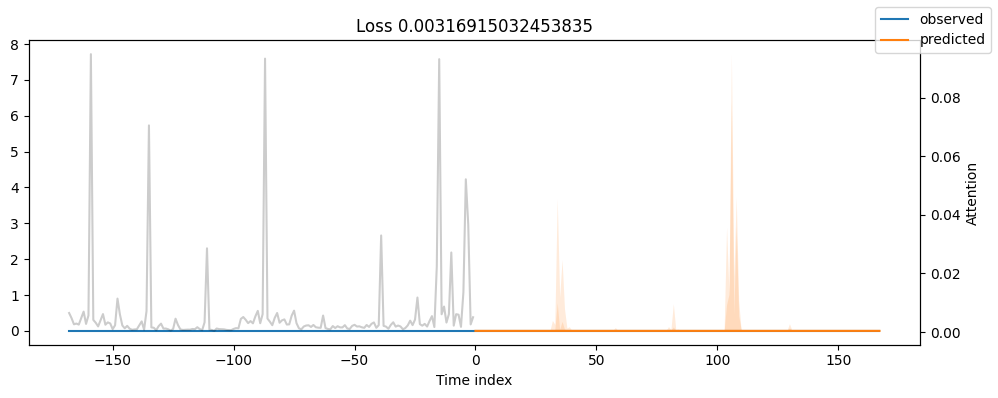

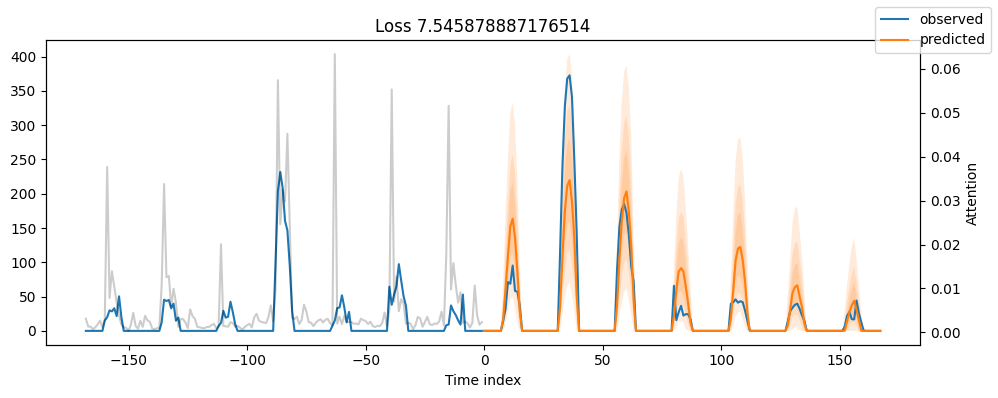

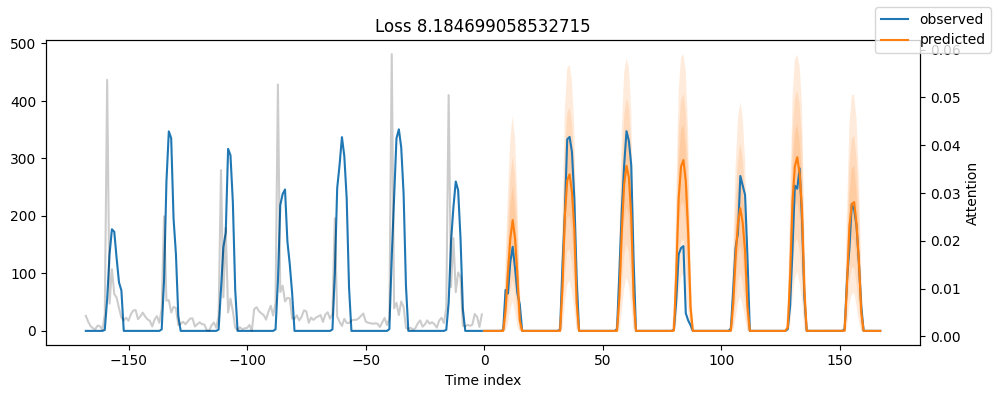

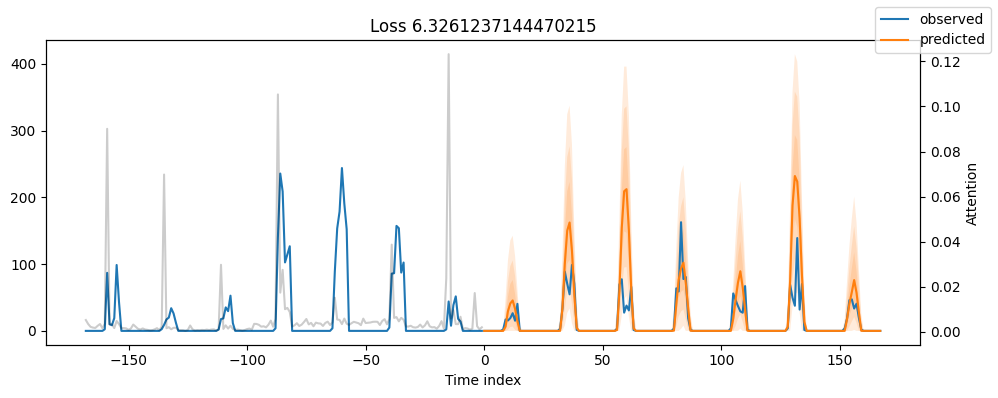

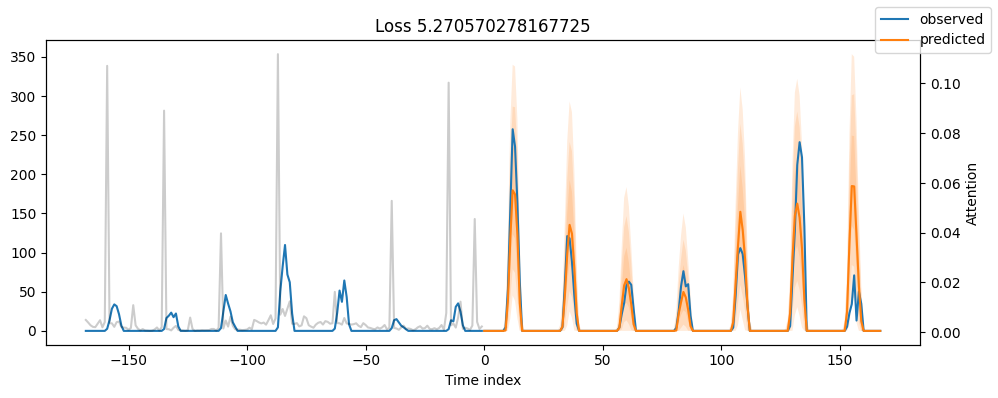

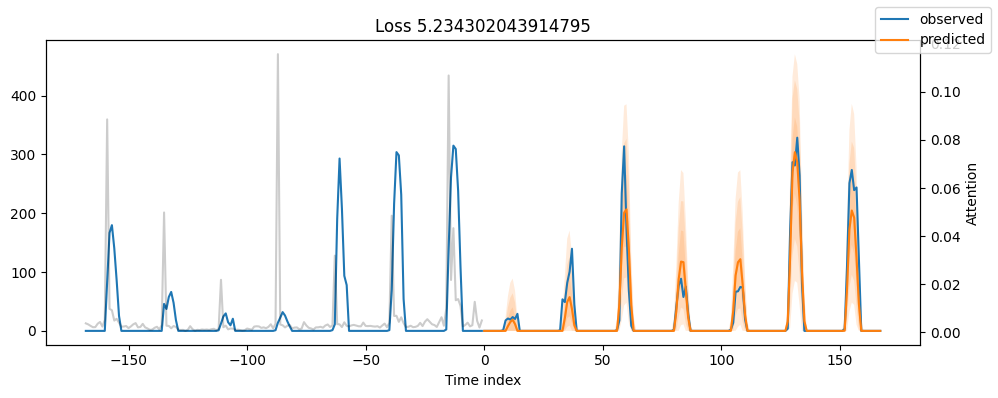

In [54]:
for idx in range(6):  # plot all 5 consumers
    fig, ax = plt.subplots(figsize=(10, 4))
    best_tft2.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True,ax=ax)


### Evaluate performance

Pitch Lightning автоматически завершает обучение, и, таким образом, мы можем легко выбрать лучшую модель и загрузить ее.

In [65]:
# load the best model according to the validation loss
# (given that we use early stopping, this is not necessarily the last epoch)
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

После тренировки мы можем делать прогнозы с помощью predict(). Этот метод позволяет очень точно контролировать то, что он возвращает, так что, например, вы можете легко сопоставлять прогнозы с вашим фреймом данных pandas. Подробности смотрите в его документации. Мы оцениваем показатели в наборе данных проверки и пару примеров, чтобы увидеть, насколько хорошо работает модель. Учитывая, что мы работаем всего с 21 000 образцами, результаты очень обнадеживающие и могут конкурировать с результатами, полученными с помощью градиентного усилителя. Мы также работаем лучше, чем базовая модель. Учитывая зашумленные данные, это не тривиально.

In [114]:
# calcualte mean absolute error on validation set
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft2.predict(val_dataloader)
(actuals - predictions).abs().mean()

tensor(9.0113)

Теперь мы также можем непосредственно просмотреть примеры прогнозов, которые мы строим с помощью plot_prediction(). Как вы можете видеть из приведенных ниже цифр, прогнозы выглядят довольно точными. Если вам интересно, серые линии обозначают количество внимания, которое модель уделяет различным моментам времени при составлении прогноза. Это особая особенность трансформатора временного слияния.

In [68]:
# raw predictions are a dictionary from which all kind of information including quantiles can be extracted
raw_predictions, x = best_tft.predict(val_dataloader, mode="raw", return_x=True)

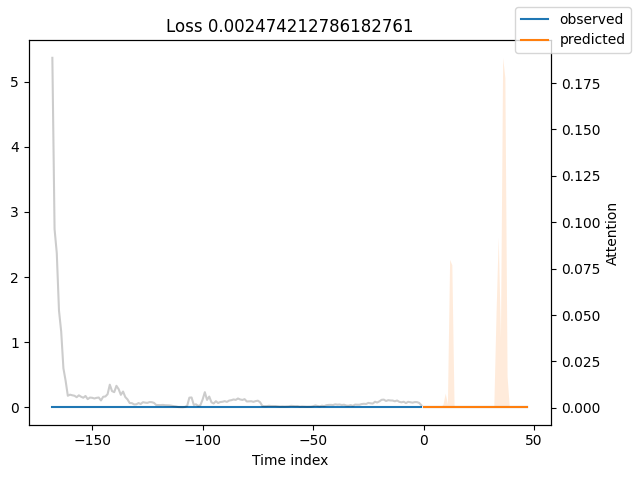

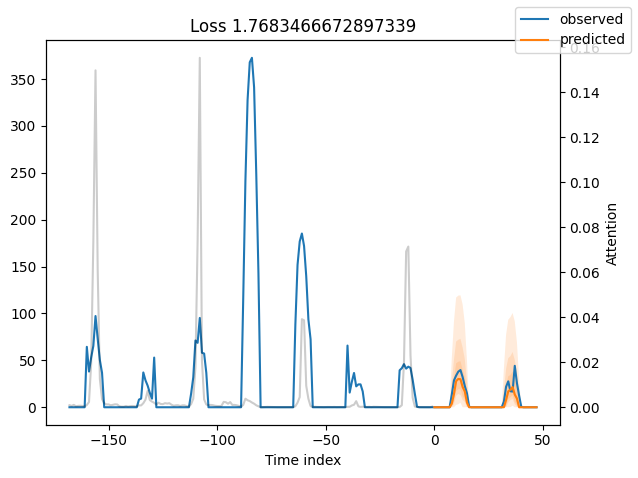

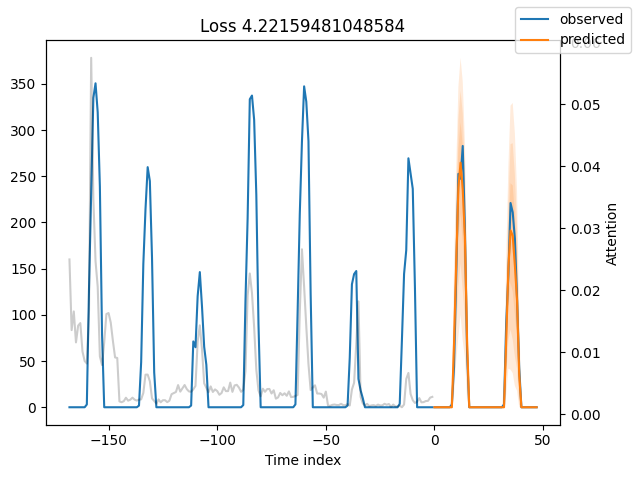

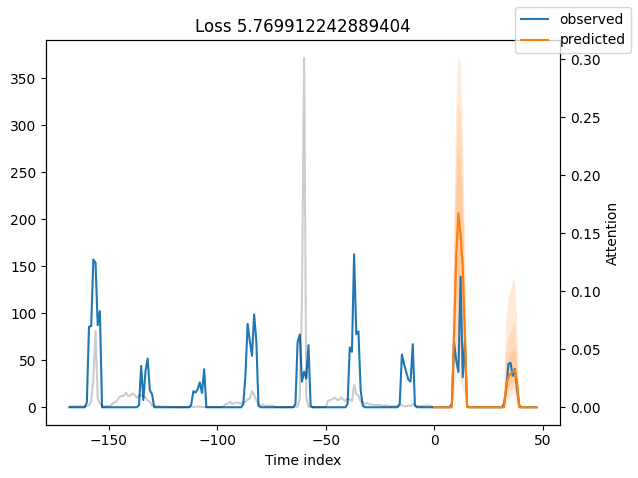

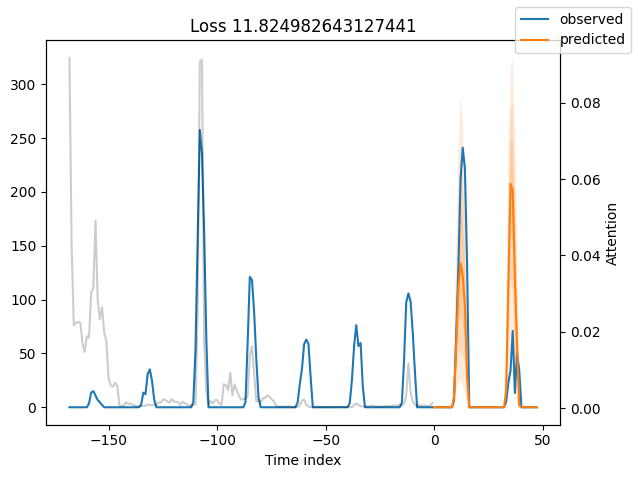

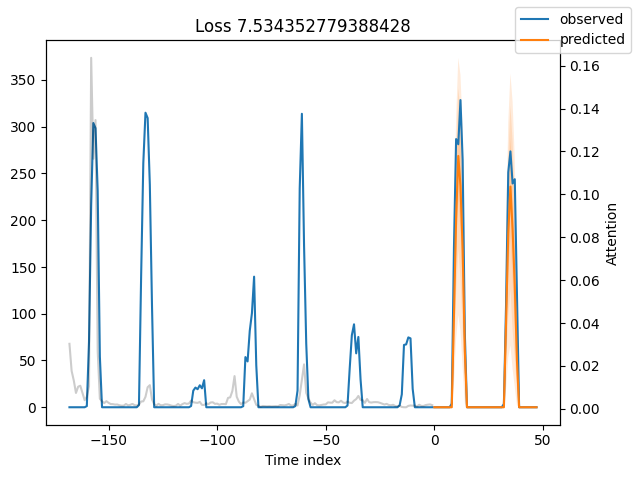

In [69]:
for idx in range(6):  # plot 6 points
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True);

### Худшие исполнители

Рассмотрение худших показателей, например, с точки зрения SNAPE, дает нам представление о том, где у модели есть проблемы с надежным прогнозированием. Эти примеры могут дать важные указания о том, как улучшить модель. Такого рода графики сравнения фактических данных с прогнозами доступны для всех моделей. Конечно, также разумно использовать дополнительные показатели, такие как MASE, определенные в модуле metrics. Однако, ради демонстрации, мы используем здесь только КАРТЫ.

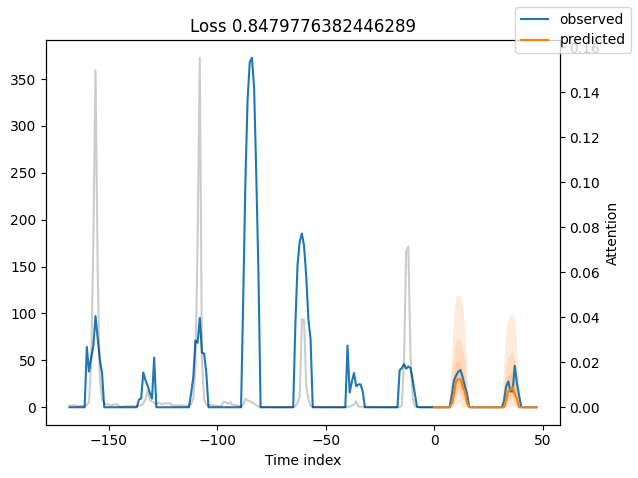

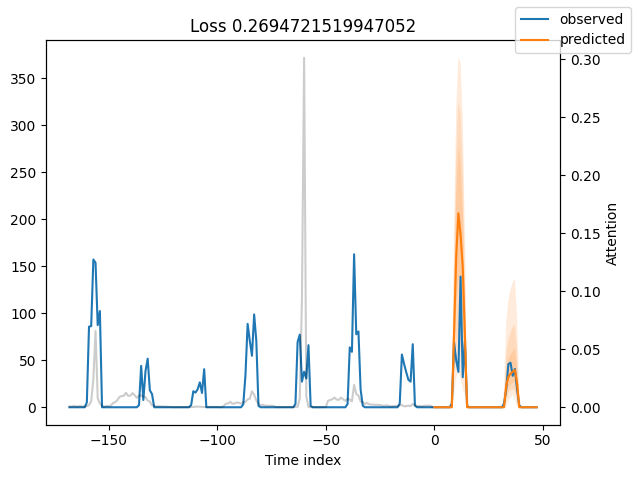

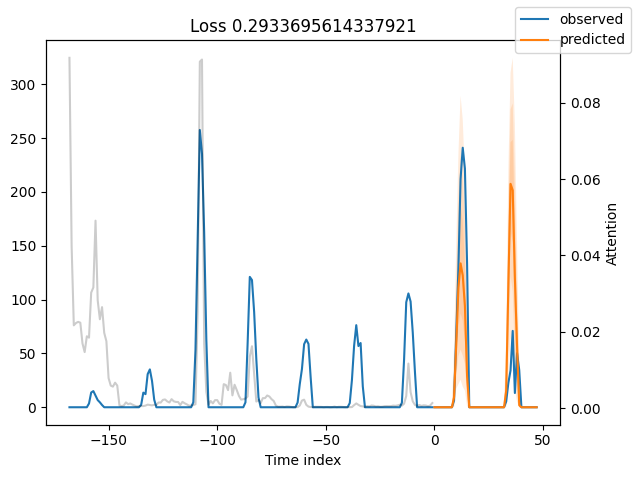

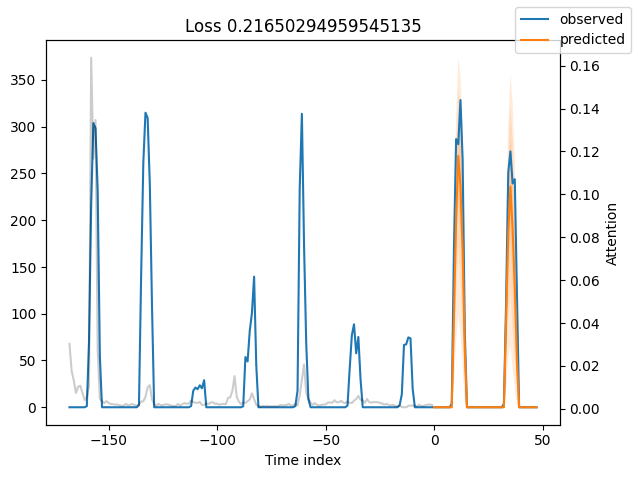

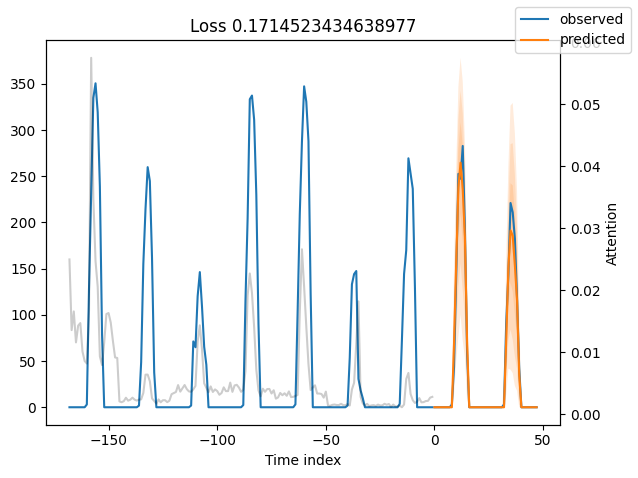

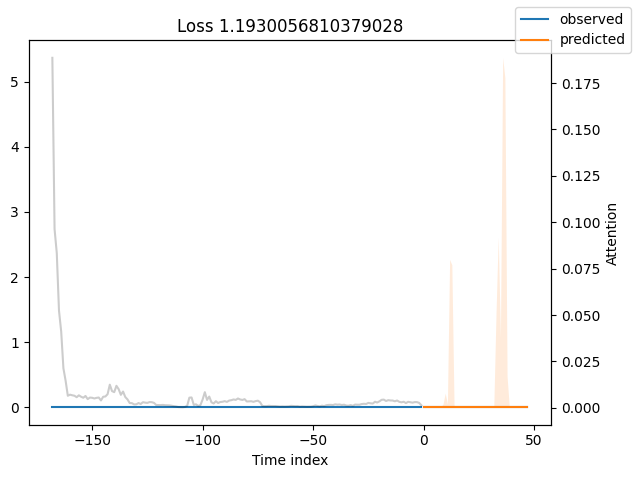

In [70]:
# calcualte metric by which to display
predictions = best_tft.predict(val_dataloader)
mean_losses = SMAPE(reduction="none")(predictions, actuals).mean(1)
indices = mean_losses.argsort(descending=True)  # sort losses
for idx in range(6):  # plot 6
    best_tft.plot_prediction(
        x, raw_predictions, idx=indices[idx], add_loss_to_title=SMAPE(quantiles=best_tft.loss.quantiles)
    );

### Фактические данные против прогнозов по переменным

Проверка того, как модель работает на разных фрагментах данных, позволяет нам обнаружить слабые места. Ниже приведены средства сравнения прогнозов с фактическими значениями по каждой переменной, разделенной на 100 ячеек, используя Now, мы можем напрямую прогнозировать сгенерированные данные, используя методы calculate_prediction_actual_by_variable() и plot_prediction_actual_by_variable(). Серые полосы обозначают частоту переменной с помощью bin, т.е. представляют собой гистограмму.

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_forecasting\models\base_model.py:1699: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  log_scale = scipy.stats.skew(values_actual) > 1.6
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_forecasting\models\base_model.py:1699: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  log_scale = scipy.stats.skew(values_actual) > 1.6
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_forecasting\models\base_model.py:1699: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  log_scale = scipy.stats.skew(values_actual) > 1.6


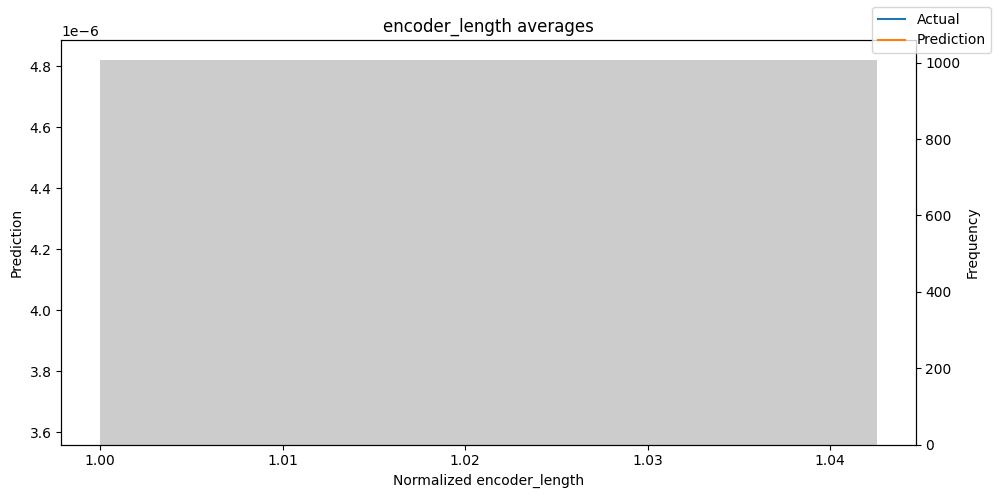

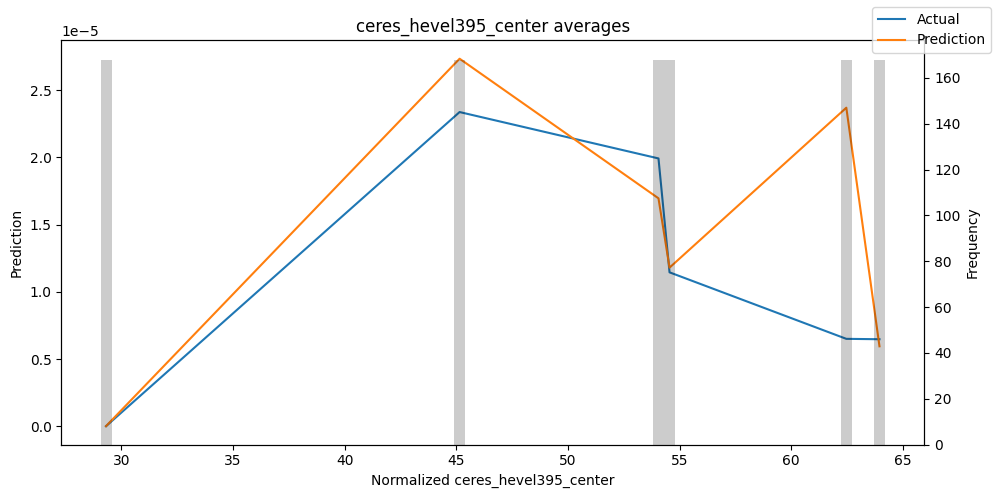

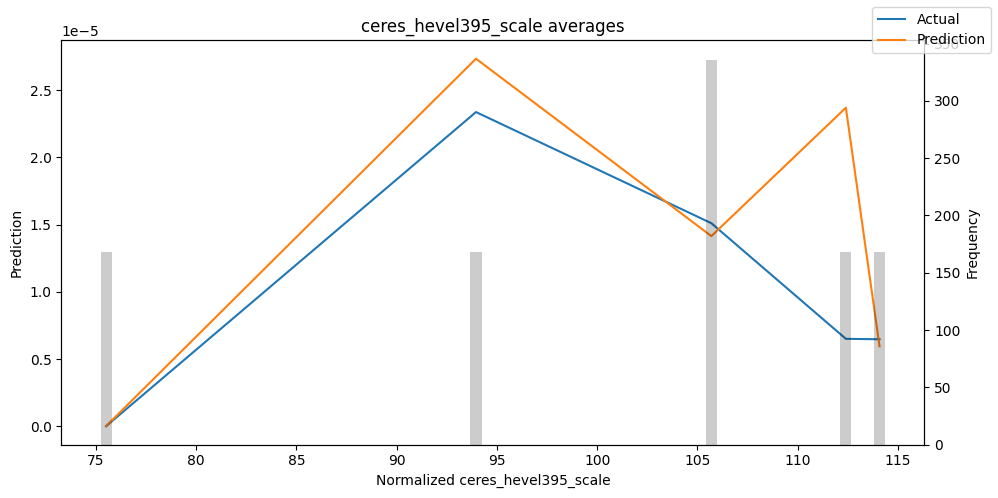

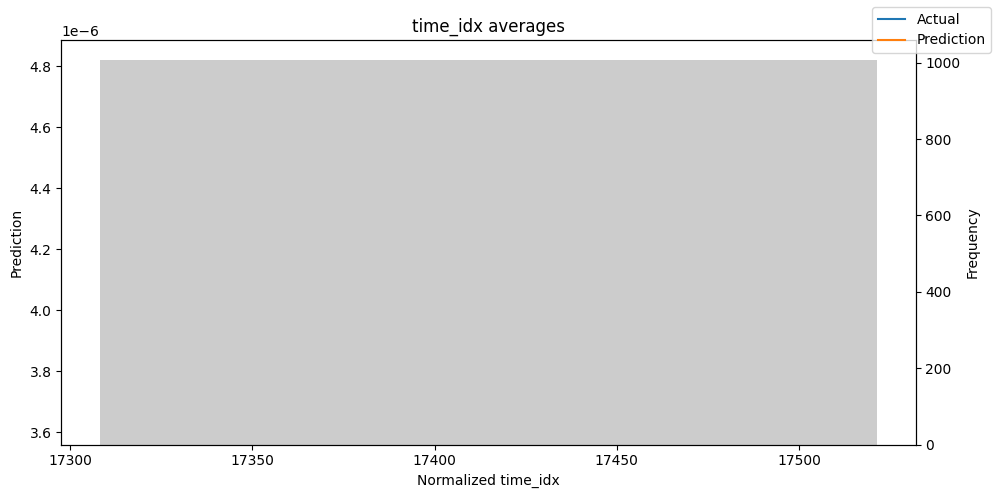

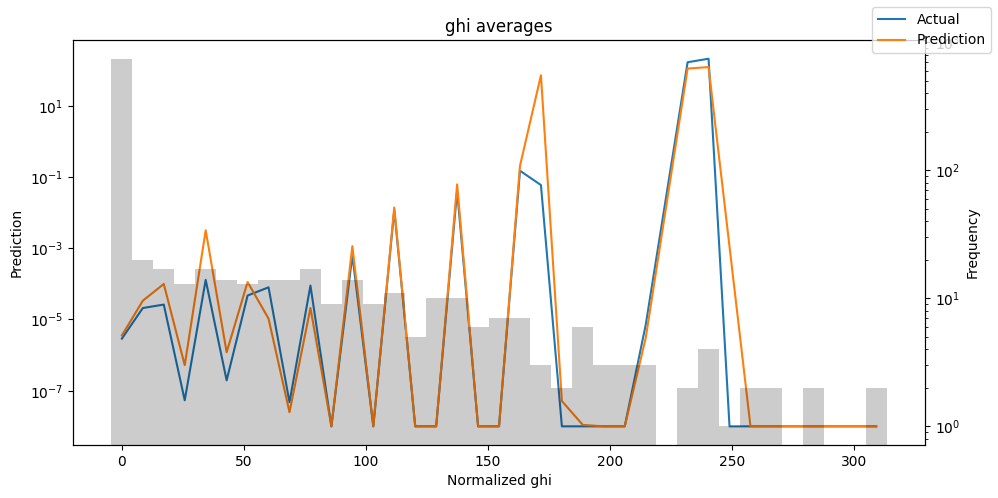

...

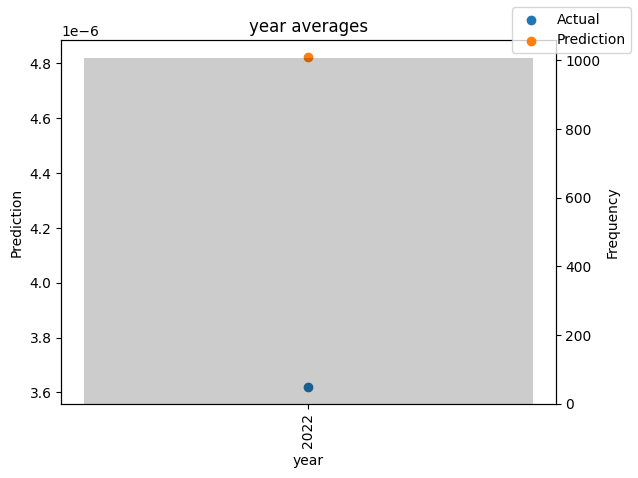

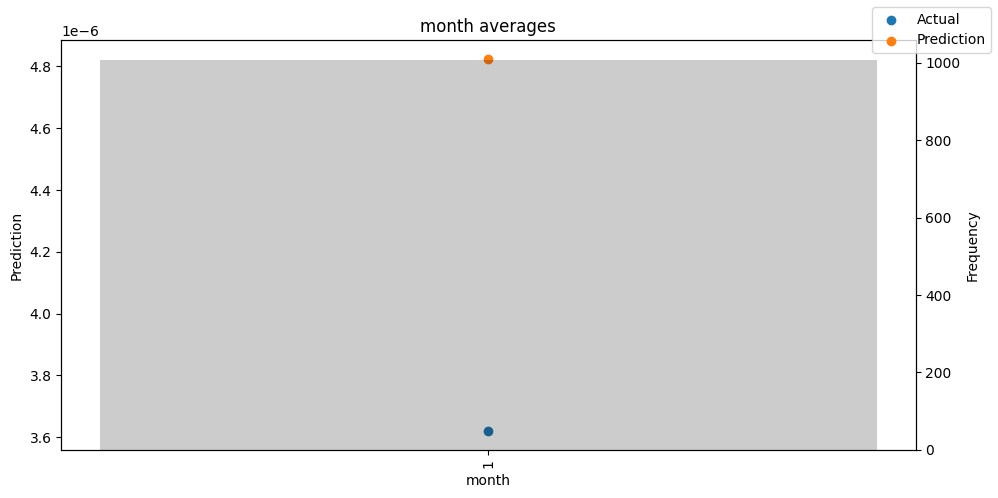

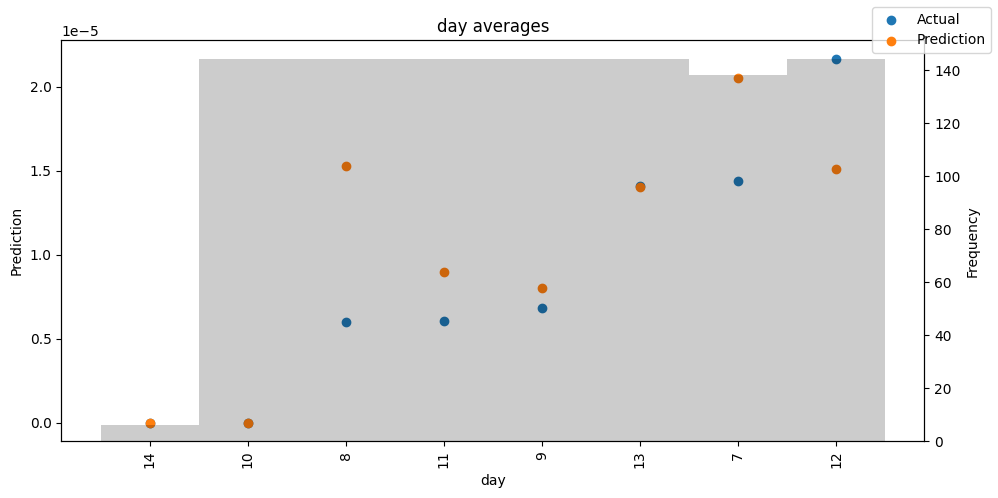

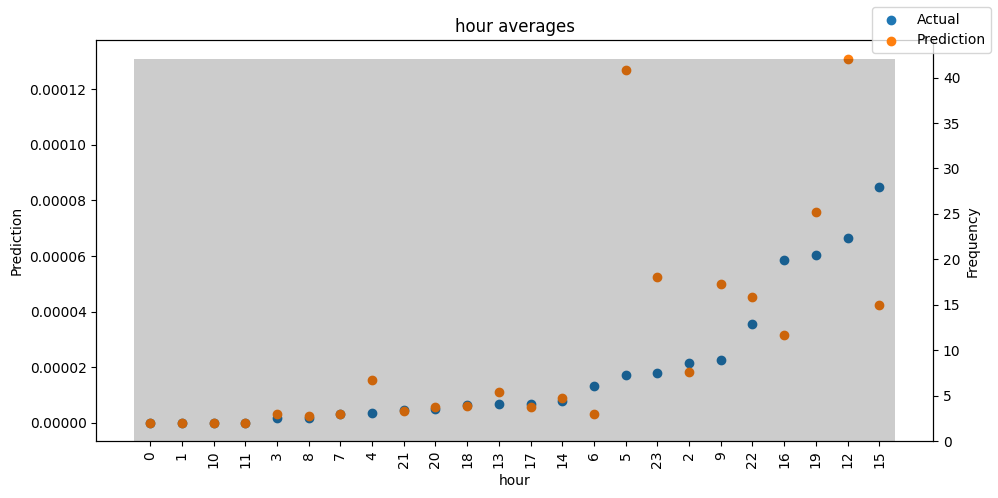

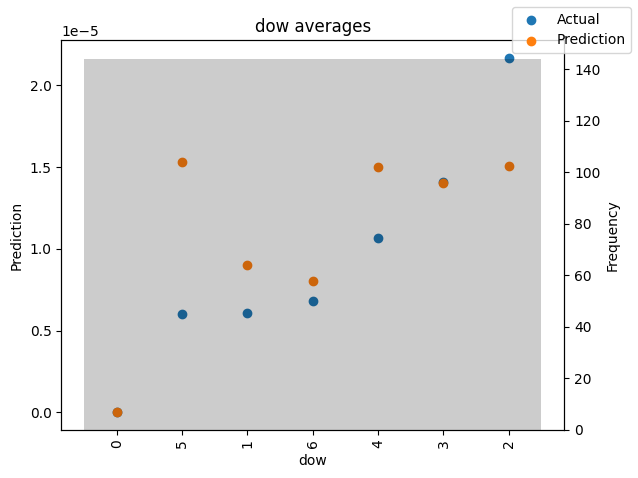

In [55]:
predictions, x = best_tft2.predict(val_dataloader, return_x=True)
predictions_vs_actuals = best_tft2.calculate_prediction_actual_by_variable(x, predictions)
best_tft2.plot_prediction_actual_by_variable(predictions_vs_actuals);

### Прогнозировать на основе новых данных

Поскольку в наборе данных у нас есть ковариаты, прогнозирование на основе новых данных требует от нас предварительного определения известных ковариат.

In [56]:
time_df2

,ghi,ceres_hevel395,dow,district_label,datatime,days_from_start,day,year,price_zone,lon,hour,idpoint,es_label,t_2m,albedo,month,lat,time_idx,subject_label,wind
105120,0.00,0.0,4,8,2022-01-14 01:00:00,730,14,2022,1,47,1,3702,8,-9.3,0.32,1,46,17520,3,9.2
105121,-0.02,0.0,4,5,2022-01-14 01:00:00,730,14,2022,2,103,1,5221,4,-16.6,0.46,1,52,17520,13,3.0
105122,0.00,0.0,4,7,2022-01-14 01:00:00,730,14,2022,1,37,1,6128,7,-2.3,0.43,1,55,17520,27,5.5
105123,0.00,0.0,4,2,2022-01-14 01:00:00,730,14,2022,1,48,1,6087,5,-7.8,0.59,1,55,17520,55,8.4
105124,0.00,0.0,4,6,2022-01-14 01:00:00,730,14,2022,1,65,1,6260,6,-14.8,0.47,1,57,17520,73,5.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106123,0.20,0.0,4,5,2022-01-21 00:00:00,736,21,2022,2,103,0,5221,4,-15.6,0.46,1,52,17687,13,0.2
106124,0.00,0.0,4,7,2022-01-21 00:00:00,736,21,2022,1,37,0,6128,7,-5.8,0.43,1,55,17687,27,5.3
106125,0.00,0.0,4,2,2022-01-21 00:00:00,736,21,2022,1,48,0,6087,5,-7.2,0.58,1,55,17687,55,4.2
106126,0.08,0.0,4,6,2022-01-21 00:00:00,736,21,2022,1,65,0,6260,6,-9.9,0.47,1,57,17687,73,3.4


In [57]:
max_encoder_length, 7*24

(168, 168)

In [58]:
#encoder data is the last lookback window: we get the last 1 week (168 datapoints) for all 5 consumers = 840 total datapoints
encoder_data = time_df[lambda x: x.time_idx > x.time_idx.max() - max_encoder_length]
last_data = time_df[lambda x: x.time_idx == x.time_idx.max()]

In [59]:
last_data

,ghi,ceres_hevel395,dow,district_label,datatime,days_from_start,day,year,price_zone,lon,hour,idpoint,es_label,t_2m,albedo,month,lat,time_idx,subject_label,wind
105114,0.00,0.0,4,8,2022-01-14,729,14,2022,1,47,0,3702,8,-9.6,0.38,1,46,17519,3,9.2
105115,-0.28,0.0,4,5,2022-01-14,729,14,2022,2,103,0,5221,4,-16.1,0.46,1,52,17519,13,2.9
105116,0.00,0.0,4,7,2022-01-14,729,14,2022,1,37,0,6128,7,-5.4,0.43,1,55,17519,27,5.3
105117,0.00,0.0,4,2,2022-01-14,729,14,2022,1,48,0,6087,5,-6.4,0.59,1,55,17519,55,8.1
105118,0.14,0.0,4,6,2022-01-14,729,14,2022,1,65,0,6260,6,-14.8,0.47,1,57,17519,73,5.6
105119,0.00,0.0,4,0,2022-01-14,729,14,2022,1,33,0,2486,0,0.7,0.24,1,69,17519,28,12.6


In [60]:
encoder_data

,ghi,ceres_hevel395,dow,district_label,datatime,days_from_start,day,year,price_zone,lon,hour,idpoint,es_label,t_2m,albedo,month,lat,time_idx,subject_label,wind
104112,0.00,0.0,4,8,2022-01-07 01:00:00,723,7,2022,1,47,1,3702,8,4.8,0.15,1,46,17352,3,4.6
104113,-0.10,0.0,4,5,2022-01-07 01:00:00,723,7,2022,2,103,1,5221,4,-16.4,0.42,1,52,17352,13,0.6
104114,0.00,0.0,4,7,2022-01-07 01:00:00,723,7,2022,1,37,1,6128,7,-1.5,0.40,1,55,17352,27,3.7
104115,0.00,0.0,4,2,2022-01-07 01:00:00,723,7,2022,1,48,1,6087,5,-4.3,0.57,1,55,17352,55,1.5
104116,0.00,0.0,4,6,2022-01-07 01:00:00,723,7,2022,1,65,1,6260,6,-17.1,0.47,1,57,17352,73,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105115,-0.28,0.0,4,5,2022-01-14 00:00:00,729,14,2022,2,103,0,5221,4,-16.1,0.46,1,52,17519,13,2.9
105116,0.00,0.0,4,7,2022-01-14 00:00:00,729,14,2022,1,37,0,6128,7,-5.4,0.43,1,55,17519,27,5.3
105117,0.00,0.0,4,2,2022-01-14 00:00:00,729,14,2022,1,48,0,6087,5,-6.4,0.59,1,55,17519,55,8.1
105118,0.14,0.0,4,6,2022-01-14 00:00:00,729,14,2022,1,65,0,6260,6,-14.8,0.47,1,57,17519,73,5.6


In [61]:
validation.index

,time_first,time_last,time_diff_to_next,index_start,time,count,sequence_id,index_end,sequence_length
103109,0,17519,1,17184,17184,17520,0,17519,336
103104,0,17519,1,34704,17184,17520,1,35039,336
103105,0,17519,1,52224,17184,17520,2,52559,336
103107,0,17519,1,69744,17184,17520,3,70079,336
103106,0,17519,1,87264,17184,17520,4,87599,336
103108,0,17519,1,104784,17184,17520,5,105119,336


In [62]:
#decoder_data is the new dataframe for which we will create predictions. 
#decoder_data df should be max_prediction_length* consumers = 24*5=120 datapoints long : 24 datapoints for each cosnumer
#we create it by repeating the last hourly observation of every consumer 24 times since we do not really have new test data
#and later we fix the columns

decoder_data = pd.concat(
    [last_data.assign(datatime=lambda x: x.datatime + pd.offsets.Hour(i)) for i in range(1, max_prediction_length + 1)],
    ignore_index=True,
)

In [63]:
#fix the new columns
decoder_data.rename({'date':'dataname'}, axis=1)
decoder_data["time_idx"] = (decoder_data["datatime"] - earliest_time).dt.seconds / 60 / 60 + (decoder_data["datatime"] - earliest_time).dt.days * 24
decoder_data['time_idx'] = decoder_data['time_idx'].astype('int')
decoder_data["time_idx"] += encoder_data["time_idx"].max() + 1 - decoder_data["time_idx"].min()


In [64]:
decoder_data["month"] = decoder_data["datatime"].dt.month.astype(str).astype("category")
decoder_data["hour"] = decoder_data["datatime"].dt.hour.astype(str).astype("category")
decoder_data["day"] = decoder_data["datatime"].dt.day.astype(str).astype("category")
decoder_data["dow"] = decoder_data["datatime"].dt.dayofweek.astype(str).astype("category")

In [65]:
decoder_data.price_zone.unique(), encoder_data.price_zone.unique()

(['1', '2']
 Categories (2, object): ['1', '2'],
 ['1', '2']
 Categories (2, object): ['1', '2'])

In [66]:
decoder_data.es_label.unique(), encoder_data.es_label.unique()

(['8', '4', '7', '5', '6', '0']
 Categories (6, object): ['0', '4', '5', '6', '7', '8'],
 ['8', '4', '7', '5', '6', '0']
 Categories (6, object): ['0', '4', '5', '6', '7', '8'])

In [67]:
decoder_data.subject_label.unique(), encoder_data.subject_label.unique()

(['3', '13', '27', '55', '73', '28']
 Categories (6, object): ['13', '27', '28', '3', '55', '73'],
 ['3', '13', '27', '55', '73', '28']
 Categories (6, object): ['13', '27', '28', '3', '55', '73'])

In [68]:
decoder_data.district_label.unique(), encoder_data.district_label.unique()

(['8', '5', '7', '2', '6', '0']
 Categories (6, object): ['0', '2', '5', '6', '7', '8'],
 ['8', '5', '7', '2', '6', '0']
 Categories (6, object): ['0', '2', '5', '6', '7', '8'])

In [69]:
decoder_data.hour.unique()

['1', '2', '3', '4', '5', ..., '20', '21', '22', '23', '0']
Length: 24
Categories (24, object): ['0', '1', '10', '11', ..., '6', '7', '8', '9']

In [70]:
encoder_data.hour.unique()

['1', '2', '3', '4', '5', ..., '20', '21', '22', '23', '0']
Length: 24
Categories (24, object): ['0', '1', '10', '11', ..., '6', '7', '8', '9']

In [71]:
data.hour.unique()

['1', '2', '3', '4', '5', ..., '20', '21', '22', '23', '0']
Length: 24
Categories (24, object): ['0', '1', '10', '11', ..., '6', '7', '8', '9']

In [72]:
time_df2.hour.unique()

['1', '2', '3', '4', '5', ..., '20', '21', '22', '23', '0']
Length: 24
Categories (24, object): ['0', '1', '10', '11', ..., '6', '7', '8', '9']

In [73]:
time_df2.idpoint.unique()

array([3702, 5221, 6128, 6087, 6260, 2486], dtype=int16)

In [74]:
new_observed_data=list(time_df2[time_df2.idpoint == 3702]['ceres_hevel395'])
len(new_observed_data)

168

In [75]:
new_prediction_data = pd.concat([encoder_data, decoder_data], ignore_index=True)
new_prediction_data

,ghi,ceres_hevel395,dow,district_label,datatime,days_from_start,day,year,price_zone,lon,hour,idpoint,es_label,t_2m,albedo,month,lat,time_idx,subject_label,wind
0,0.00,0.0,4,8,2022-01-07 01:00:00,723,7,2022,1,47,1,3702,8,4.8,0.15,1,46,17352,3,4.6
1,-0.10,0.0,4,5,2022-01-07 01:00:00,723,7,2022,2,103,1,5221,4,-16.4,0.42,1,52,17352,13,0.6
2,0.00,0.0,4,7,2022-01-07 01:00:00,723,7,2022,1,37,1,6128,7,-1.5,0.40,1,55,17352,27,3.7
3,0.00,0.0,4,2,2022-01-07 01:00:00,723,7,2022,1,48,1,6087,5,-4.3,0.57,1,55,17352,55,1.5
4,0.00,0.0,4,6,2022-01-07 01:00:00,723,7,2022,1,65,1,6260,6,-17.1,0.47,1,57,17352,73,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011,-0.28,0.0,4,5,2022-01-21 00:00:00,729,21,2022,2,103,0,5221,4,-16.1,0.46,1,52,17687,13,2.9
2012,0.00,0.0,4,7,2022-01-21 00:00:00,729,21,2022,1,37,0,6128,7,-5.4,0.43,1,55,17687,27,5.3
2013,0.00,0.0,4,2,2022-01-21 00:00:00,729,21,2022,1,48,0,6087,5,-6.4,0.59,1,55,17687,55,8.1
2014,0.14,0.0,4,6,2022-01-21 00:00:00,729,21,2022,1,65,0,6260,6,-14.8,0.47,1,57,17687,73,5.6


In [77]:
new_prediction_data

,ghi,ceres_hevel395,dow,district_label,datatime,days_from_start,day,year,price_zone,lon,hour,idpoint,es_label,t_2m,albedo,month,lat,time_idx,subject_label,wind
0,0.00,0.0,4,8,2022-01-07 01:00:00,723,7,2022,1,47,1,3702,8,4.8,0.15,1,46,17352,3,4.6
1,-0.10,0.0,4,5,2022-01-07 01:00:00,723,7,2022,2,103,1,5221,4,-16.4,0.42,1,52,17352,13,0.6
2,0.00,0.0,4,7,2022-01-07 01:00:00,723,7,2022,1,37,1,6128,7,-1.5,0.40,1,55,17352,27,3.7
3,0.00,0.0,4,2,2022-01-07 01:00:00,723,7,2022,1,48,1,6087,5,-4.3,0.57,1,55,17352,55,1.5
4,0.00,0.0,4,6,2022-01-07 01:00:00,723,7,2022,1,65,1,6260,6,-17.1,0.47,1,57,17352,73,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011,-0.28,0.0,4,5,2022-01-21 00:00:00,729,21,2022,2,103,0,5221,4,-16.1,0.46,1,52,17687,13,2.9
2012,0.00,0.0,4,7,2022-01-21 00:00:00,729,21,2022,1,37,0,6128,7,-5.4,0.43,1,55,17687,27,5.3
2013,0.00,0.0,4,2,2022-01-21 00:00:00,729,21,2022,1,48,0,6087,5,-6.4,0.59,1,55,17687,55,8.1
2014,0.14,0.0,4,6,2022-01-21 00:00:00,729,21,2022,1,65,0,6260,6,-14.8,0.47,1,57,17687,73,5.6


In [79]:
list(time_df.idpoint.unique())

[3702, 5221, 6128, 6087, 6260, 2486]

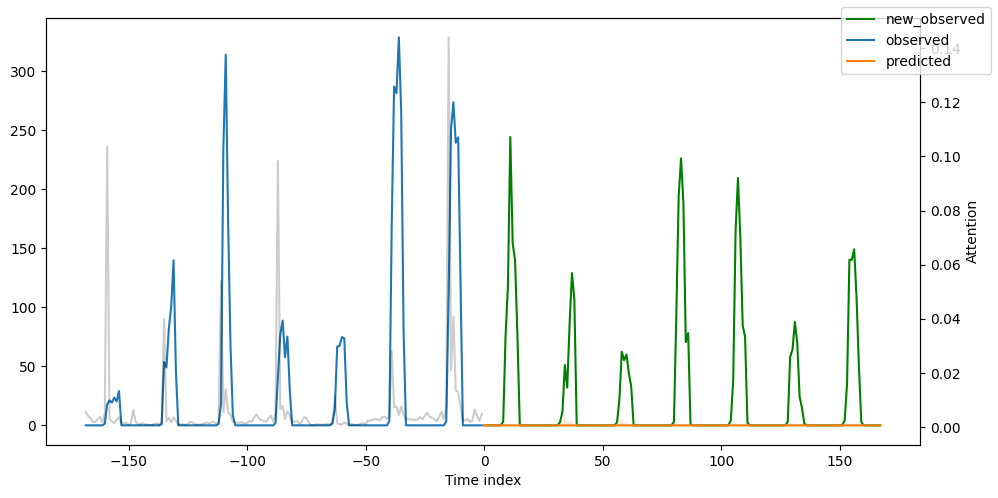

In [80]:
new_prediction_data = pd.concat([encoder_data, decoder_data], ignore_index=True)

idpoint=6260
fig, ax = plt.subplots(figsize=(10, 5))
#create out-of-sample predictions for MT_002
new_prediction_data=new_prediction_data.query(f" idpoint == {idpoint}")
new_observed_data=list(time_df2[time_df2.idpoint == idpoint]['ceres_hevel395'])
ax.plot(range(len(new_observed_data)), new_observed_data, label='new_observed', color='green')
new_raw_predictions, new_x = best_tft2.predict(new_prediction_data, mode="raw", return_x=True)
best_tft2.plot_prediction(new_x, new_raw_predictions, idx=0, show_future_observed=False, ax=ax);

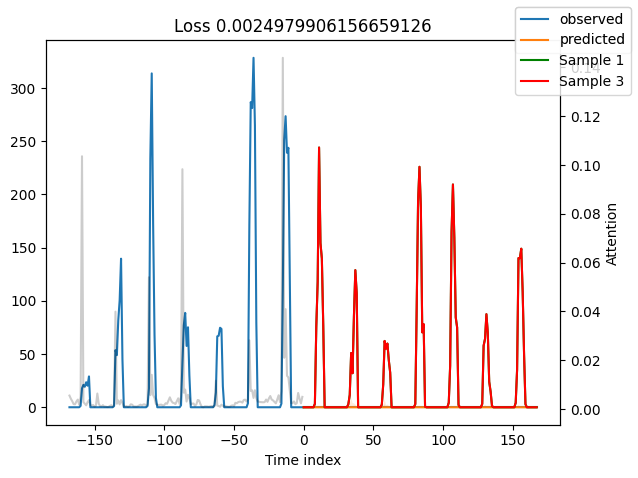

In [81]:
sample3 = MAE(MultiHorizonMetric).loss(new_raw_predictions.prediction[0,:,3], np.array(new_observed_data))
sample0 = MAE(MultiHorizonMetric).loss(new_raw_predictions.prediction[0,:,0], np.array(new_observed_data))

# plot prediction
fig = best_tft.plot_prediction(new_x, new_raw_predictions, idx=0, add_loss_to_title=True)
ax = fig.get_axes()[0]
# plot first two sampled paths
ax.plot(sample0, color="g", label="Sample 1")
ax.plot(sample3, color="r", label="Sample 3")
fig.legend();

In [259]:
max_encoder_length/24

77.0

In [260]:
max_encoder_length = data.time_idx.max()-train.time_idx.max()

#encoder data is the last lookback window: we get the last 1 week (168 datapoints) for all 5 consumers = 840 total datapoints
encoder_data = data[lambda x: x.time_idx > x.time_idx.max() - max_encoder_length].copy()
max_data = train.time_idx.max()
#last_data = data[lambda x: x.time_idx == x.time_idx.max()]
last_data = data[lambda x: x.time_idx == max_data].copy()

In [261]:
encoder_data[cols]

,idpoint,es_label,subject_label,ceres_hevel395,time_idx,days_from_start,month,wind,albedo,lon,hour,t_2m,district_label,lat,dow,price_zone,day,year,ghi
105120,3702,8,3,0.0,17520,730,1,9.2,0.32,47,2,-9.3,8,46,4,1,14,2022,0.00
105121,5221,4,13,0.0,17520,730,1,3.0,0.46,103,2,-16.6,5,52,4,2,14,2022,-0.02
105122,6128,7,27,0.0,17520,730,1,5.5,0.43,37,2,-2.3,7,55,4,1,14,2022,0.00
105123,6087,5,55,0.0,17520,730,1,8.4,0.59,48,2,-7.8,2,55,4,1,14,2022,0.00
105124,6260,6,73,0.0,17520,730,1,5.7,0.47,65,2,-14.8,6,57,4,1,14,2022,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116203,5221,4,13,0.0,19367,806,4,1.2,0.32,103,1,-3.9,5,52,4,2,1,2022,0.13
116204,6128,7,27,0.0,19367,806,4,2.2,0.26,37,1,-4.2,7,55,4,1,1,2022,0.00
116205,6087,5,55,0.0,19367,806,4,1.5,0.58,48,1,-1.9,2,55,4,1,1,2022,0.00
116206,6260,6,73,0.0,19367,806,4,1.5,0.39,65,1,-4.0,6,57,4,1,1,2022,-0.29


In [262]:
max_prediction_length

48

In [263]:
#decoder_data is the new dataframe for which we will create predictions. 
#decoder_data df should be max_prediction_length* consumers = 24*5=120 datapoints long : 24 datapoints for each cosnumer
#we create it by repeating the last hourly observation of every consumer 24 times since we do not really have new test data
#and later we fix the columns
decoder_data = pd.concat(
    [last_data.assign(date=lambda x: x.datatime + pd.offsets.Hour(i)) for i in range(1, max_prediction_length + 1)],
    ignore_index=True,
)

In [264]:
decoder_data[cols]

,idpoint,es_label,subject_label,ceres_hevel395,time_idx,days_from_start,month,wind,albedo,lon,hour,t_2m,district_label,lat,dow,price_zone,day,year,ghi
0,3702,8,3,0.0,17519,729,1,9.2,0.38,47,1,-9.6,8,46,4,1,14,2022,0.00
1,5221,4,13,0.0,17519,729,1,2.9,0.46,103,1,-16.1,5,52,4,2,14,2022,-0.28
2,6128,7,27,0.0,17519,729,1,5.3,0.43,37,1,-5.4,7,55,4,1,14,2022,0.00
3,6087,5,55,0.0,17519,729,1,8.1,0.59,48,1,-6.4,2,55,4,1,14,2022,0.00
4,6260,6,73,0.0,17519,729,1,5.6,0.47,65,1,-14.8,6,57,4,1,14,2022,0.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,5221,4,13,0.0,17519,729,1,2.9,0.46,103,1,-16.1,5,52,4,2,14,2022,-0.28
284,6128,7,27,0.0,17519,729,1,5.3,0.43,37,1,-5.4,7,55,4,1,14,2022,0.00
285,6087,5,55,0.0,17519,729,1,8.1,0.59,48,1,-6.4,2,55,4,1,14,2022,0.00
286,6260,6,73,0.0,17519,729,1,5.6,0.47,65,1,-14.8,6,57,4,1,14,2022,0.14


In [61]:
#decoder_data = decoder_data[cols].copy()

In [265]:
#fix the new columns
decoder_data["time_idx"] = (decoder_data["date"] - earliest_time).dt.seconds / 60 / 60 + (decoder_data["datatime"] - earliest_time).dt.days * 24
decoder_data['time_idx'] = decoder_data['time_idx'].astype('int')
decoder_data["time_idx"] += encoder_data["time_idx"].max() + 1 - decoder_data["time_idx"].min()


In [266]:
earliest_time

Timestamp('2020-01-15 01:00:00')

In [267]:
decoder_data["month"] = decoder_data["date"].dt.month.astype(str).astype("category")
decoder_data["hour"] = decoder_data["date"].dt.hour.astype(str).astype("category")
decoder_data["day"] = decoder_data["date"].dt.day.astype(str).astype("category")
decoder_data["dow"] = decoder_data["date"].dt.dayofweek.astype(str).astype("category")
decoder_data['days_from_start'] = (decoder_data['date'] - earliest_time).dt.days

In [268]:
new_prediction_data = pd.concat([encoder_data[cols], decoder_data[cols]], ignore_index=True)

In [269]:
new_prediction_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11376 entries, 0 to 11375
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   idpoint          11376 non-null  int16   
 1   es_label         11376 non-null  category
 2   subject_label    11376 non-null  category
 3   ceres_hevel395   11376 non-null  float32 
 4   time_idx         11376 non-null  int64   
 5   days_from_start  11376 non-null  int64   
 6   month            11376 non-null  object  
 7   wind             11376 non-null  float32 
 8   albedo           11376 non-null  float32 
 9   lon              11376 non-null  int16   
 10  hour             11376 non-null  object  
 11  t_2m             11376 non-null  float32 
 12  district_label   11376 non-null  category
 13  lat              11376 non-null  int16   
 14  dow              11376 non-null  object  
 15  price_zone       11376 non-null  category
 16  day              11376 non-null  object 

In [270]:
new_prediction_data

,idpoint,es_label,subject_label,ceres_hevel395,time_idx,days_from_start,month,wind,albedo,lon,hour,t_2m,district_label,lat,dow,price_zone,day,year,ghi
0,3702,8,3,0.0,17520,730,1,9.2,0.32,47,2,-9.3,8,46,4,1,14,2022,0.00
1,5221,4,13,0.0,17520,730,1,3.0,0.46,103,2,-16.6,5,52,4,2,14,2022,-0.02
2,6128,7,27,0.0,17520,730,1,5.5,0.43,37,2,-2.3,7,55,4,1,14,2022,0.00
3,6087,5,55,0.0,17520,730,1,8.4,0.59,48,2,-7.8,2,55,4,1,14,2022,0.00
4,6260,6,73,0.0,17520,730,1,5.7,0.47,65,2,-14.8,6,57,4,1,14,2022,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11371,5221,4,13,0.0,19391,731,1,2.9,0.46,103,0,-16.1,5,52,6,2,16,2022,-0.28
11372,6128,7,27,0.0,19391,731,1,5.3,0.43,37,0,-5.4,7,55,6,1,16,2022,0.00
11373,6087,5,55,0.0,19391,731,1,8.1,0.59,48,0,-6.4,2,55,6,1,16,2022,0.00
11374,6260,6,73,0.0,19391,731,1,5.6,0.47,65,0,-14.8,6,57,6,1,16,2022,0.14


In [271]:
int(max_encoder_length)

1848

In [215]:
dataset = TimeSeriesDataSet(
    new_prediction_data,
    time_idx="time_idx",
    target="ceres_hevel395", #["ceres_jam72s", "ceres_hevel395"],
    group_ids=["idpoint"],
    min_encoder_length=int(max_encoder_length),  # keep encoder length long (as it is in the validation set)
    max_encoder_length=int(max_encoder_length),
    min_prediction_length=1,
    max_prediction_length=max_prediction_length,
    static_categoricals=["price_zone", "es_label", "subject_label", "district_label"],
    #static_reals=["avg_population_2017", "avg_yearly_household_income_2017"],
    time_varying_known_categoricals=["year", "month", "day", "hour", "dow"],
    #variable_groups={"hour": hour},  # group of categorical variables can be treated as one variable
    time_varying_known_reals=["time_idx", "ghi", "albedo", "t_2m", "wind"],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=["ceres_hevel395"],
    target_normalizer=GroupNormalizer(
        groups=["idpoint"], transformation="softplus"
    ),  # use softplus and normalize by group
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
    allow_missing_timesteps=True,
    predict_mode = True,
)

In [216]:
dataset.get_parameters()

{'time_idx': 'time_idx',
 'target': 'ceres_hevel395',
 'group_ids': ['idpoint'],
 'weight': None,
 'max_encoder_length': 1848,
 'min_encoder_length': 1848,
 'min_prediction_idx': 17520,
 'min_prediction_length': 1,
 'max_prediction_length': 48,
 'static_categoricals': ['price_zone',
  'es_label',
  'subject_label',
  'district_label'],
 'static_reals': ['encoder_length',
  'ceres_hevel395_center',
  'ceres_hevel395_scale'],
 'time_varying_known_categoricals': ['year', 'month', 'day', 'hour', 'dow'],
 'time_varying_known_reals': ['time_idx',
  'ghi',
  'albedo',
  't_2m',
  'wind',
  'relative_time_idx'],
 'time_varying_unknown_categoricals': [],
 'time_varying_unknown_reals': ['ceres_hevel395'],
 'variable_groups': {},
 'constant_fill_strategy': {},
 'allow_missing_timesteps': True,
 'lags': {},
 'add_relative_time_idx': True,
 'add_target_scales': True,
 'add_encoder_length': True,
 'target_normalizer': GroupNormalizer(
 	method='standard',
 	groups=['idpoint'],
 	center=True,
 	scale

In [217]:
# create dataloaders for model
batch_size = 128  # set this between 32 to 128
#train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=2,)
#val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=2,)
dataloader = dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=2,)

In [218]:
# calcualte mean absolute error on validation set
actuals = torch.cat([y[0] for x, y in iter(dataloader)])
predictions = best_tft2.predict(dataloader)
(actuals - predictions).abs().mean()

IndexError: index out of range in self

In [222]:
dataloader

KeyError: "Unknown category '0' encountered. Set `add_nan=True` to allow unknown categories"

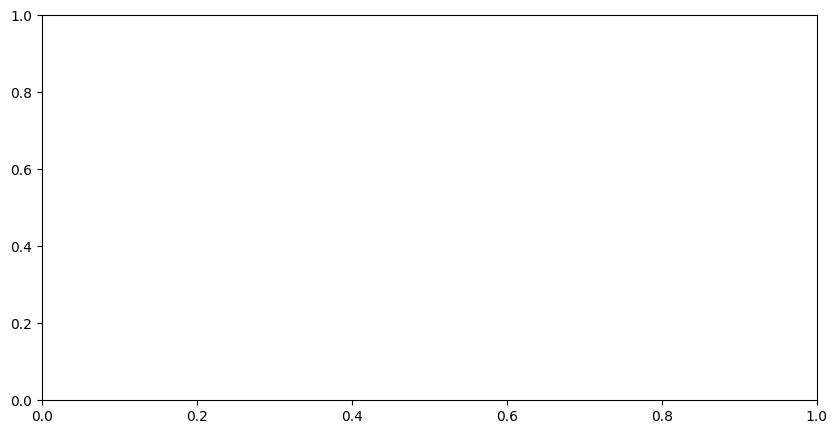

In [199]:
fig, ax = plt.subplots(figsize=(10, 5))

#create out-of-sample predictions for MT_002
#new_raw_predictions, new_x = best_tft2.predict(new_prediction_data, mode="raw", return_x=True)
new_prediction_data=new_prediction_data.query(" idpoint == 6128")
new_raw_predictions, new_x = best_tft2.predict(new_prediction_data, mode="raw", return_x=True)
best_tft2.plot_prediction(new_x, new_raw_predictions, idx=0, show_future_observed=False, ax=ax);

In [ ]:
##########################################################

In [ ]:
# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(new_pre, train, predict=True, stop_randomization=True)

# create dataloaders for model
batch_size = 128  # set this between 32 to 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=2,)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=2,)


In [201]:
test = data.set_index('datatime')[6*8760*2:6*8760*2+6*48].copy()
earliest_time = test.index.min()
earliest_time

Timestamp('2022-01-14 01:00:00')

In [202]:
start_date = min(test.fillna(method='ffill').dropna().index)
end_date = max(test.fillna(method='bfill').dropna().index)
start_date, end_date

(Timestamp('2022-01-14 01:00:00'), Timestamp('2022-01-16 00:00:00'))

In [203]:
active_range = (test.index >= start_date) & (test.index <= end_date)
test = test[active_range].fillna(0.)

In [204]:
date = test.index
test['time_idx'] = (train['time_idx'].max() + 1) + \
    ((date - earliest_time).seconds / 60 / 60 + (date - earliest_time).days * 24).astype('int')

In [205]:
test['days_from_start'] = (date - earliest_time).days
test['datatime'] = date
test.reset_index(drop=True, inplace=True)

In [206]:
test = create_features(test)

In [211]:
cols = list(set(train.columns) - {"ceres_jam72s", 'ceres_5', 'ceres_6', 'ceres_t_2m',\
    'ceres_wind', 'ceres_albedo', \
    'icon_hevel395', 'icon_jam72s',\
    'datatime', 'es', 'subject', 'district'})\
    + ['time_idx', 'days_from_start']
cols

['month',
 'lon',
 'albedo',
 'dow',
 'days_from_start',
 'hour',
 'day',
 'es_label',
 'year',
 'price_zone',
 'time_idx',
 'idpoint',
 'wind',
 'ghi',
 'ceres_hevel395',
 'subject_label',
 'district_label',
 't_2m',
 'lat',
 'time_idx',
 'days_from_start']

In [212]:
test = test[cols].copy()

In [216]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 288 entries, 0 to 287
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   month            288 non-null    category
 1   lon              288 non-null    int16   
 2   albedo           288 non-null    float32 
 3   dow              288 non-null    category
 4   days_from_start  288 non-null    int64   
 5   hour             288 non-null    category
 6   day              288 non-null    category
 7   es_label         288 non-null    category
 8   year             288 non-null    category
 9   price_zone       288 non-null    category
 10  time_idx         288 non-null    int64   
 11  idpoint          288 non-null    int16   
 12  wind             288 non-null    float32 
 13  ghi              288 non-null    float32 
 14  ceres_hevel395   288 non-null    float32 
 15  subject_label    288 non-null    category
 16  district_label   288 non-null    category
 1

In [217]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105120 entries, 0 to 105119
Data columns (total 31 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   lat              105120 non-null  int16         
 1   lon              105120 non-null  int16         
 2   ceres_5          105120 non-null  float32       
 3   ceres_6          105120 non-null  float32       
 4   ceres_albedo     105120 non-null  float32       
 5   ceres_t_2m       105120 non-null  float32       
 6   ceres_wind       105120 non-null  float32       
 7   ghi              105120 non-null  float32       
 8   albedo           105120 non-null  float32       
 9   t_2m             105120 non-null  float32       
 10  wind             105120 non-null  float32       
 11  ceres_hevel395   105120 non-null  float32       
 12  icon_hevel395    105120 non-null  float32       
 13  ceres_jam72s     105120 non-null  float32       
 14  icon_jam72s      105

In [116]:
max_encoder_length = 2*24
encoder_data = sample_data[lambda x: x.hours_from_start > x.hours_from_start.max() - max_encoder_length]

In [117]:
last_data = sample_data[lambda x: x.hours_from_start == x.hours_from_start.max()]

In [118]:
last_data

,price_zone,idpoint,district_label,es_label,wind,dow,day,subject_label,lat,albedo,ghi,lon,t_2m,month,year,ceres_hevel395,hour,hours_from_start,days_from_start,date
116202,1,3702,8,8,3.4,4,1,3,46,0.16,0.00,47,6.8,4,2022,0.0,0,19367,806,2022-04-01
116203,2,5221,5,4,1.2,4,1,13,52,0.32,0.13,103,-3.9,4,2022,0.0,0,19367,806,2022-04-01
116204,1,6128,7,7,2.2,4,1,27,55,0.26,0.00,37,-4.2,4,2022,0.0,0,19367,806,2022-04-01
116205,1,6087,2,5,1.5,4,1,55,55,0.58,0.00,48,-1.9,4,2022,0.0,0,19367,806,2022-04-01
116206,1,6260,6,6,1.5,4,1,73,57,0.39,-0.29,65,-4.0,4,2022,0.0,0,19367,806,2022-04-01
116207,1,2486,0,0,5.8,4,1,28,69,0.26,0.00,33,-3.6,4,2022,0.0,0,19367,806,2022-04-01


In [119]:
decoder_data = pd.concat(
    [last_data.assign(date=lambda x: x.date + pd.offsets.MonthBegin(i)) for i in range(1, max_prediction_length + 1)],
    ignore_index=True,
)

In [120]:
decoder_data

,price_zone,idpoint,district_label,es_label,wind,dow,day,subject_label,lat,albedo,ghi,lon,t_2m,month,year,ceres_hevel395,hour,hours_from_start,days_from_start,date
0,1,3702,8,8,3.4,4,1,3,46,0.16,0.00,47,6.8,4,2022,0.0,0,19367,806,2022-05-01
1,2,5221,5,4,1.2,4,1,13,52,0.32,0.13,103,-3.9,4,2022,0.0,0,19367,806,2022-05-01
2,1,6128,7,7,2.2,4,1,27,55,0.26,0.00,37,-4.2,4,2022,0.0,0,19367,806,2022-05-01
3,1,6087,2,5,1.5,4,1,55,55,0.58,0.00,48,-1.9,4,2022,0.0,0,19367,806,2022-05-01
4,1,6260,6,6,1.5,4,1,73,57,0.39,-0.29,65,-4.0,4,2022,0.0,0,19367,806,2022-05-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,2,5221,5,4,1.2,4,1,13,52,0.32,0.13,103,-3.9,4,2022,0.0,0,19367,806,2026-04-01
284,1,6128,7,7,2.2,4,1,27,55,0.26,0.00,37,-4.2,4,2022,0.0,0,19367,806,2026-04-01
285,1,6087,2,5,1.5,4,1,55,55,0.58,0.00,48,-1.9,4,2022,0.0,0,19367,806,2026-04-01
286,1,6260,6,6,1.5,4,1,73,57,0.39,-0.29,65,-4.0,4,2022,0.0,0,19367,806,2026-04-01


In [104]:
# select last 7*24 hours from data (max_encoder_length is 24*7)
encoder_data = sample_data[lambda x: x.hours_from_start > x.hours_from_start.max() - max_encoder_length]

# select last known data point and create decoder data from it by repeating it and incrementing the month
# in a real world dataset, we should not just forward fill the covariates but specify them to account
# for changes in special days and prices (which you absolutely should do but we are too lazy here)
last_data = sample_data[lambda x: x.hours_from_start == x.hours_from_start.max()]
decoder_data = pd.concat(
    [last_data.assign(date=lambda x: x.date + pd.offsets.MonthBegin(i)) for i in range(1, max_prediction_length + 1)],
    ignore_index=True,
)

# add time index consistent with "data"
#decoder_data["hours_from_start"] = decoder_data["date"].dt.year * 12 + decoder_data["date"].dt.month

data1 = data.set_index('datatime')
earliest_time = data1.index.min()
date = data1.index

decoder_data['hours_from_start'] = ((date - earliest_time).seconds / 60 / 60 + (date - earliest_time).days * 24).astype('int')
decoder_data["hours_from_start"] += encoder_data["hours_from_start"].max() + 1 - decoder_data["hours_from_start"].min()

# adjust additional time feature(s)
decoder_data["month"] = decoder_data.date.dt.month.astype(str).astype("category")  # categories have be strings

# combine encoder and decoder data
new_prediction_data = pd.concat([encoder_data, decoder_data], ignore_index=True)

In [114]:
new_prediction_data = sample_data[-6*48:]

In [ ]:
pd.offsets.BDay()

In [115]:
new_raw_predictions, new_x = best_tft.predict(new_prediction_data, mode="raw", return_x=True)

for idx in range(6):  # plot 6
    best_tft.plot_prediction(new_x, new_raw_predictions, idx=idx, show_future_observed=False);

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_forecasting\data\timeseries.py:1282: UserWarning: Min encoder length and/or min_prediction_idx and/or min prediction length and/or lags are too large for 6 series/groups which therefore are not present in the dataset index. This means no predictions can be made for those series. First 10 removed groups: [{'__group_id__idpoint': 2486}, {'__group_id__idpoint': 3702}, {'__group_id__idpoint': 5221}, {'__group_id__idpoint': 6087}, {'__group_id__idpoint': 6128}, {'__group_id__idpoint': 6260}]
  warnings.warn(


AssertionError: filters should not remove entries all entries - check encoder/decoder lengths and lags

Теперь мы можем напрямую прогнозировать на основе сгенерированных данных, используя метод predict().

### Interpret model

Переменные значения
Модель обладает встроенными возможностями интерпретации благодаря тому, как построена ее архитектура. Давайте посмотрим, как это выглядит. Сначала мы вычисляем интерпретации с помощью interpret_output() и затем строим их с помощью plot_interpretation().

In [82]:
sample_data.hour.unique()

['2', '3', '4', '5', '6', ..., '21', '22', '23', '24', '1']
Length: 24
Categories (24, object): ['1', '10', '11', '12', ..., '6', '7', '8', '9']

{'attention': <Figure size 1500x1500 with 1 Axes>,
 'static_variables': <Figure size 700x375 with 1 Axes>,
 'encoder_variables': <Figure size 700x450 with 1 Axes>,
 'decoder_variables': <Figure size 700x450 with 1 Axes>}

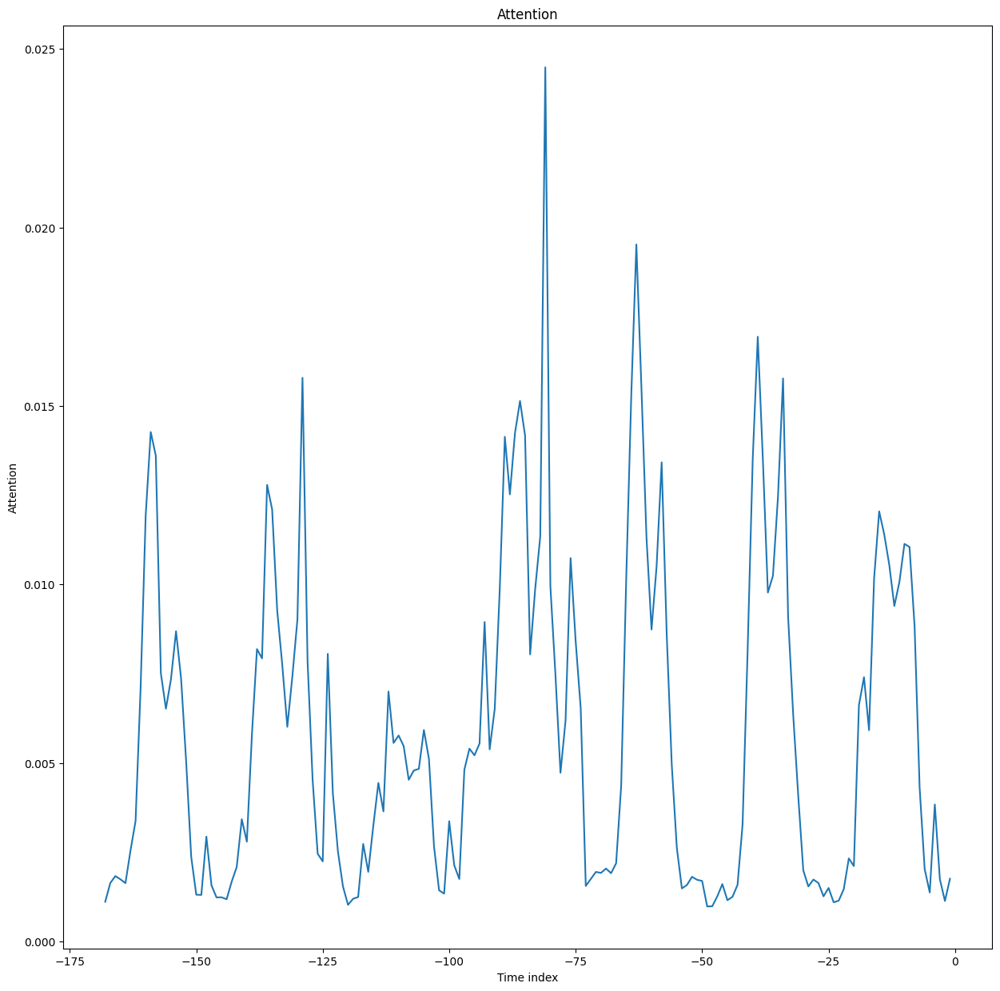

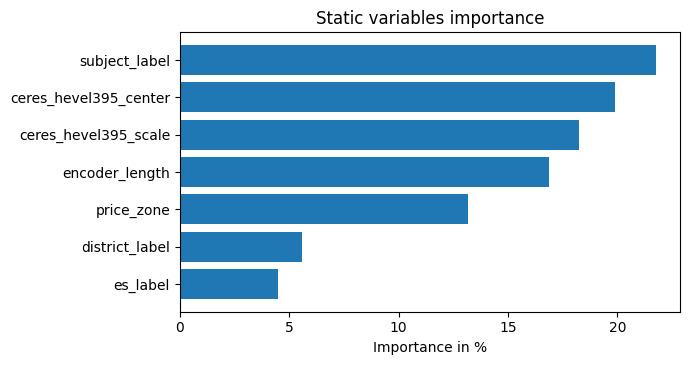

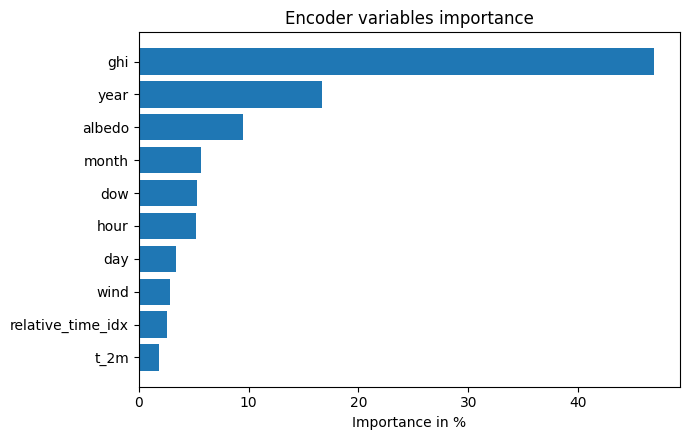

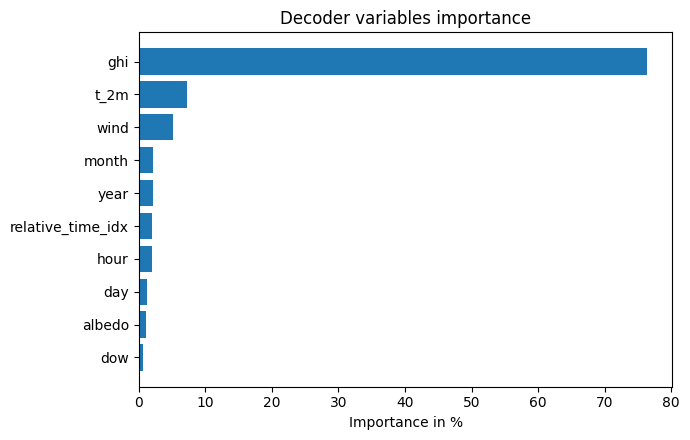

In [83]:
interpretation = best_tft.interpret_output(raw_predictions, reduction="sum")
best_tft.plot_interpretation(interpretation)

Графики частичных зависимостей часто используются для лучшей интерпретации модели (при условии независимости функций). Они также могут быть полезны для понимания того, чего ожидать в случае моделирования, и создаются с помощью predict_dependency().

In [89]:
dependency = best_tft.predict_dependency(
    val_dataloader.dataset, "ghi", np.linspace(0, 30, 30), show_progress_bar=True, mode="dataframe"
)

Predict:   0%|          | 0/30 [00:00<?, ? batches/s]

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\talic\anaconda3\envs\

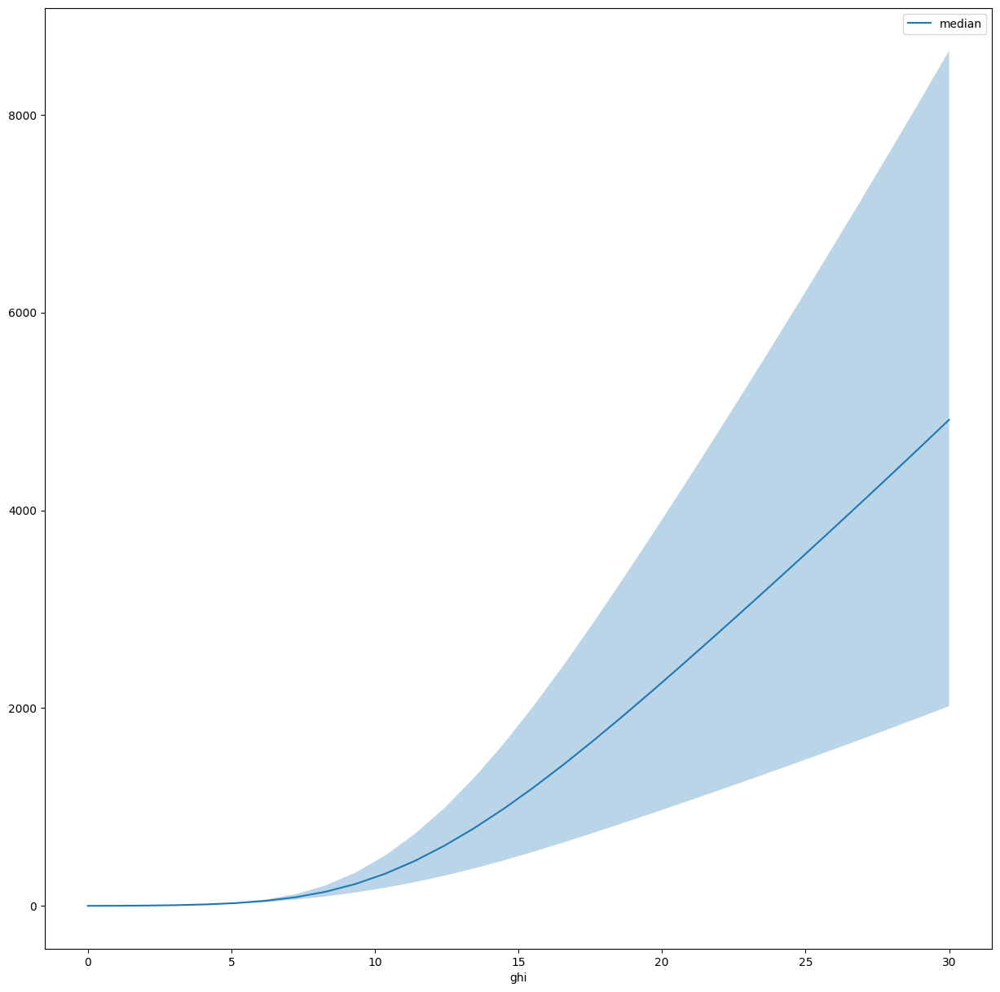

In [90]:
# plotting median and 25% and 75% percentile
agg_dependency = dependency.groupby("ghi").normalized_prediction.agg(
    median="median", q25=lambda x: x.quantile(0.25), q75=lambda x: x.quantile(0.75)
)
ax = agg_dependency.plot(y="median")
ax.fill_between(agg_dependency.index, agg_dependency.q25, agg_dependency.q75, alpha=0.3);

# Energy Demand Forecasting with Temporal Fusion Transformer

### EDA

In [219]:
data.head(3)

,datatime,lat,lon,ceres_5,ceres_6,ceres_albedo,ceres_t_2m,ceres_wind,ghi,albedo,...,subject_label,district_label,es,district,subject,price_zone,year,month,day,hour
0,2020-01-15 01:00:00,46,47,0.0,0.0,0.0,0.2,1.1,0.00,-9.99,...,3,8,ОЭС/ОДУ Юга,Южный,Республика Калмыкия,1,2020,1,15,1
1,2020-01-15 01:00:00,52,103,0.0,0.0,0.0,-23.5,1.4,0.08,-9.99,...,13,5,ОЭС/ОДУ Сибири,Сибирский,Иркутская область,2,2020,1,15,1
2,2020-01-15 01:00:00,55,37,0.0,0.0,0.0,-0.9,3.1,0.00,-9.99,...,27,7,ОЭС/ОДУ Центра,Центральный,Московская область,1,2020,1,15,1


In [220]:
data[['idpoint', 'ceres_hevel395']].groupby('idpoint').mean()

,ceres_hevel395
idpoint,
2486,35.557205
3702,69.250122
5221,71.392166
6087,60.916569
6128,52.955357
6260,62.784103


Text(0.5, 1.0, 'Power usage of consumers')

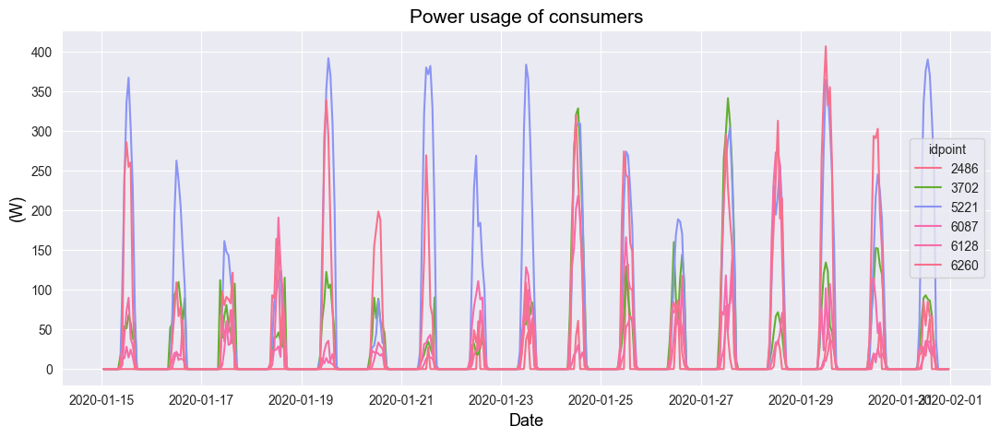

In [221]:
import seaborn as sns
import matplotlib.pyplot as plt

#plt.rcParams.update(plt.rcParamsDefault)
sns.set_style('darkgrid')
sns.color_palette("tab10")

fig, ax = plt.subplots(figsize=(13, 5))

sns.lineplot(data=data[(np.int32(data['month']) == 1)&(np.int32(data['year']) == 2020)], 
             x='datatime', 
             y='ceres_hevel395', 
             hue='idpoint', 
             legend='full',
             palette='husl').set_title('Power')

ax.set_xlabel("Date", fontdict={"color":  "black", "size": 13} )
ax.set_ylabel("(W)", fontdict={"color":  "black", "size": 13})
ax.tick_params(axis = 'both', which = 'major', labelsize = 10)
ax.set_title(label = "Power usage of consumers", fontdict={"color":  "black", "size": 15})

Заметной тенденции нет, но каждый временной ряд имеет немного разную сезонность и амплитуду. Мы можем продолжать экспериментировать и проверять стационарность, разложение сигналов и так далее, но в нашем случае мы фокусируемся только на аспекте построения модели.

Также обратите внимание, что другие методы прогнозирования временных рядов, такие как ARIMA, должны удовлетворять нескольким требованиям (например, сначала временные ряды должны стать стационарными). С помощью TFT мы можем оставить ваши данные как есть.

In [356]:
data1 = data.set_index('datatime')
earliest_time = data1.index.min()

In [357]:
earliest_time

Timestamp('2020-01-15 01:00:00')

In [358]:
start_date = min(data1.fillna(method='ffill').dropna().index)
end_date = max(data1.fillna(method='bfill').dropna().index)

In [359]:
start_date, end_date

(Timestamp('2020-01-15 01:00:00'), Timestamp('2022-04-01 00:00:00'))

In [360]:
active_range = (data1.index >= start_date) & (data1.index <= end_date)
data1 = data1[active_range].fillna(0.)

In [361]:
data1

,lat,lon,ceres_5,ceres_6,ceres_albedo,ceres_t_2m,ceres_wind,ghi,albedo,t_2m,...,subject_label,district_label,es,district,subject,price_zone,year,month,day,hour
datatime,,,,,,,,,,,,,,,,,,,,,
2020-01-15 01:00:00,46,47,0.0,0.0,0.0,0.2,1.1,0.00,-9.99,-0.6,...,3,8,ОЭС/ОДУ Юга,Южный,Республика Калмыкия,1,2020,1,15,1
2020-01-15 01:00:00,52,103,0.0,0.0,0.0,-23.5,1.4,0.08,-9.99,-20.5,...,13,5,ОЭС/ОДУ Сибири,Сибирский,Иркутская область,2,2020,1,15,1
2020-01-15 01:00:00,55,37,0.0,0.0,0.0,-0.9,3.1,0.00,-9.99,-1.3,...,27,7,ОЭС/ОДУ Центра,Центральный,Московская область,1,2020,1,15,1
2020-01-15 01:00:00,55,48,0.0,0.0,0.0,-0.9,4.8,0.00,-9.99,-3.5,...,55,2,ОЭС/ОДУ Средней Волги,Приволжский,Республика Марий Эл,1,2020,1,15,1
2020-01-15 01:00:00,57,65,0.0,0.0,0.0,-4.5,4.5,0.00,-9.99,-8.5,...,73,6,ОЭС/ОДУ Урала,Уральский,Свердловская область,1,2020,1,15,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-01 00:00:00,52,103,0.0,0.0,0.0,-7.0,2.6,0.13,0.32,-3.9,...,13,5,ОЭС/ОДУ Сибири,Сибирский,Иркутская область,2,2022,4,1,0
2022-04-01 00:00:00,55,37,0.0,0.0,0.0,-0.3,1.7,0.00,0.26,-4.2,...,27,7,ОЭС/ОДУ Центра,Центральный,Московская область,1,2022,4,1,0
2022-04-01 00:00:00,55,48,0.0,0.0,0.0,-1.2,3.8,0.00,0.58,-1.9,...,55,2,ОЭС/ОДУ Средней Волги,Приволжский,Республика Марий Эл,1,2022,4,1,0


In [362]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 116208 entries, 2020-01-15 01:00:00 to 2022-04-01 00:00:00
Data columns (total 27 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   lat             116208 non-null  int16  
 1   lon             116208 non-null  int16  
 2   ceres_5         116208 non-null  float32
 3   ceres_6         116208 non-null  float32
 4   ceres_albedo    116208 non-null  float32
 5   ceres_t_2m      116208 non-null  float32
 6   ceres_wind      116208 non-null  float32
 7   ghi             116208 non-null  float32
 8   albedo          116208 non-null  float32
 9   t_2m            116208 non-null  float32
 10  wind            116208 non-null  float32
 11  ceres_hevel395  116208 non-null  float32
 12  icon_hevel395   116208 non-null  float32
 13  ceres_jam72s    116208 non-null  float32
 14  icon_jam72s     116208 non-null  float32
 15  idpoint         116208 non-null  int16  
 16  es_label        116208

In [363]:
date = data1.index
data1['hours_from_start'] = ((date - earliest_time).seconds / 60 / 60 + (date - earliest_time).days * 24).astype('int')

data1['days_from_start'] = (date - earliest_time).days
data1['date'] = date
#data1['hour'] = date.hour
#data1['day'] = date.day
data1['day_of_week'] = date.dayofweek
#data1['month'] = date.month

In [364]:
features3+['hours_from_start', 'day', 'day_of_week', 'date']

['idpoint',
 'ceres_hevel395',
 'ceres_5',
 'ceres_6',
 'ghi',
 't_2m',
 'ceres_t_2m',
 'ceres_albedo',
 'month',
 'hour',
 'hours_from_start',
 'day',
 'day_of_week',
 'date']

In [365]:
features3 = features3+['hours_from_start', 'day', 'day_of_week', 'date']
data1 = data1[features3]

In [366]:
data1

,idpoint,ceres_hevel395,ceres_5,ceres_6,ghi,t_2m,ceres_t_2m,ceres_albedo,month,hour,hours_from_start,day,day_of_week,date
datatime,,,,,,,,,,,,,,
2020-01-15 01:00:00,3702,0.0,0.0,0.0,0.00,-0.6,0.2,0.0,1,1,0,15,2,2020-01-15 01:00:00
2020-01-15 01:00:00,5221,0.0,0.0,0.0,0.08,-20.5,-23.5,0.0,1,1,0,15,2,2020-01-15 01:00:00
2020-01-15 01:00:00,6128,0.0,0.0,0.0,0.00,-1.3,-0.9,0.0,1,1,0,15,2,2020-01-15 01:00:00
2020-01-15 01:00:00,6087,0.0,0.0,0.0,0.00,-3.5,-0.9,0.0,1,1,0,15,2,2020-01-15 01:00:00
2020-01-15 01:00:00,6260,0.0,0.0,0.0,0.00,-8.5,-4.5,0.0,1,1,0,15,2,2020-01-15 01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-01 00:00:00,5221,0.0,0.0,0.0,0.13,-3.9,-7.0,0.0,4,0,19367,1,4,2022-04-01 00:00:00
2022-04-01 00:00:00,6128,0.0,0.0,0.0,0.00,-4.2,-0.3,0.0,4,0,19367,1,4,2022-04-01 00:00:00
2022-04-01 00:00:00,6087,0.0,0.0,0.0,0.00,-1.9,-1.2,0.0,4,0,19367,1,4,2022-04-01 00:00:00


In [367]:
data1.reset_index(drop=True, inplace=True)
data1['idpoint'] = data1['idpoint'].astype(str)

C:\Users\talic\AppData\Local\Temp\ipykernel_13920\2420199982.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['idpoint'] = data1['idpoint'].astype(str)


Все аргументы говорят сами за себя: max_encoder_length определяет период обратного просмотра, а max_prediction_length указывает, сколько точек данных будет предсказано. В нашем случае мы оглядываемся назад на 7*24 временных шага в прошлом, чтобы вывести 24 прогноза.

Экземпляр набора данных временных рядов теперь служит загрузчиком данных. Давайте распечатаем пакет и проверим, как наши данные будут переданы в TFT:

In [368]:
#Hyperparameters
#batch size=64
#number heads=4, hidden sizes=160, lr=0.001, gr_clip=0.1

max_prediction_length = 24
max_encoder_length = 7*24
training_cutoff = data1["hours_from_start"].max() - max_prediction_length

training = TimeSeriesDataSet(
    data1,
    time_idx="hours_from_start",
    target="ceres_hevel395",
    group_ids=["idpoint"],
    min_encoder_length=max_encoder_length // 2, 
    max_encoder_length=max_encoder_length,
    min_prediction_length=1,
    max_prediction_length=max_prediction_length,
    static_categoricals=["idpoint"],
    time_varying_known_reals=["hours_from_start","day","day_of_week", "month", 'hour'],
    #time_varying_unknown_reals=['power_usage'],
    target_normalizer=GroupNormalizer(
        groups=["idpoint"], transformation="softplus"
    ),  # we normalize by group
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)


validation = TimeSeriesDataSet.from_dataset(training, data1, predict=True, stop_randomization=True)

# create dataloaders for  our model
batch_size = 64 
# if you have a strong GPU, feel free to increase the number of workers  
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=2)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=2)

In [369]:
data1.idpoint.value_counts()

3702    19368
5221    19368
6128    19368
6087    19368
6260    19368
2486    19368
Name: idpoint, dtype: int64

In [370]:
training.index

,time_first,time_last,time_diff_to_next,index_start,time,count,sequence_id,index_end,sequence_length
0,0,19367,1,0,0,19368,0,191,192
1,0,19367,1,1,1,19368,0,192,192
2,0,19367,1,2,2,19368,0,193,192
3,0,19367,1,3,3,19368,0,194,192
4,0,19367,1,4,4,19368,0,195,192
...,...,...,...,...,...,...,...,...,...
116845,0,19367,1,96840,0,19368,5,97026,187
116846,0,19367,1,96840,0,19368,5,97027,188
116847,0,19367,1,96840,0,19368,5,97028,189
116848,0,19367,1,96840,0,19368,5,97029,190


In [371]:
validation.index

,time_first,time_last,time_diff_to_next,index_start,time,count,sequence_id,index_end,sequence_length
19176,0,19367,1,19176,19176,19368,0,19367,192
38544,0,19367,1,38544,19176,19368,1,38735,192
57912,0,19367,1,57912,19176,19368,2,58103,192
77280,0,19367,1,77280,19176,19368,3,77471,192
96648,0,19367,1,96648,19176,19368,4,96839,192
116016,0,19367,1,116016,19176,19368,5,116207,192


# Baseline Model

Следующий шаг, о котором почти все забывают: базовая модель. Особенно в прогнозировании временных рядов, вы будете удивлены тем, как часто наивный предсказатель превосходит даже более причудливую модель!

В качестве наивной базовой линии мы прогнозируем кривую энергопотребления предыдущего дня:

In [372]:
actuals = torch.cat([y for x, (y, weight) in iter(val_dataloader)])
baseline_predictions = Baseline().predict(val_dataloader)
(actuals - baseline_predictions).abs().mean().item()

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(


90.49707794189453

### Build TFT model

Мы можем обучить нашу TFT-модель, используя знакомый интерфейс Trainer от PyTorch Lightning.

Обратите внимание на следующие вещи:

Мы используем обратный вызов с ранней остановкой для отслеживания потери проверки.
Мы используем Tensorboard для регистрации наших показателей обучения и валидации.
Наша модель использует квантильные потери — особый тип потерь, который помогает нам выводить интервалы прогнозирования. Подробнее о функции квантильных потерь читайте в этой статье.
Мы используем 4 головки внимания, как на оригинальной бумаге.
Теперь мы готовы создать и обучить нашу модель:

In [329]:
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=5, verbose=True, mode="min")
lr_logger = LearningRateMonitor()  
logger = TensorBoardLogger("lightning_logs")  
#accelerator='gpu', 
trainer = pl.Trainer(
    max_epochs=10,
    accelerator="gpu",
    devices=1,
    enable_model_summary=True,
    # clipping gradients is a hyperparameter and important to prevent divergance
    # of the gradient for recurrent neural networks
    gradient_clip_val=0.1,
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)


tft = TemporalFusionTransformer.from_dataset(
    training,
    # not meaningful for finding the learning rate but otherwise very important
    learning_rate=0.001,
    hidden_size=160, # most important hyperparameter apart from learning rate
    # number of attention heads. Set to up to 4 for large datasets
    attention_head_size=4,
    dropout=0.1, # between 0.1 and 0.3 are good values
    hidden_continuous_size=160,  # set to <= hidden_size
    output_size=7,  # there are 7 quantiles by default: [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98]
    loss=QuantileLoss(),
    log_interval=10, 
    # reduce learning rate if no improvement in validation loss after x epochs
    reduce_on_plateau_patience=4,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [330]:
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 24    
3  | prescalers                         | ModuleDict                      | 2.9 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 313 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 628 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 628 K 
7  | static_context_variable_selection  | GatedResidualNetwork            | 103 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 103 K 
9  | static_context_initial_cell_lstm 

Sanity Checking: 0it [00:00, ?it/s]

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 24 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: 7.949


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.489 >= min_delta = 0.0001. New best score: 5.460


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.249 >= min_delta = 0.0001. New best score: 4.211


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.825 >= min_delta = 0.0001. New best score: 3.386


Validation: 0it [00:00, ?it/s]

Exception ignored in: <function _ConnectionBase.__del__ at 0x000002B92DC75990>
Traceback (most recent call last):
  File "C:\Users\talic\anaconda3\envs\rtx-3060\lib\multiprocessing\connection.py", line 137, in __del__
    self._close()
  File "C:\Users\talic\anaconda3\envs\rtx-3060\lib\multiprocessing\connection.py", line 282, in _close
    _CloseHandle(self._handle)
OSError: [WinError 6] Неверный дескриптор
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "C:\Users\talic\anaconda3\envs\rtx-3060\lib\multiprocessing\queues.py", line 239, in _feed
    reader_close()
  File "C:\Users\talic\anaconda3\envs\rtx-3060\lib\multiprocessing\connection.py", line 182, in close
    self._close()
  File "C:\Users\talic\anaconda3\envs\rtx-3060\lib\multiprocessing\connection.py", line 282, in _close
    _CloseHandle(self._handle)
OSError: [WinError 6] Неверный дескриптор

During handling of the above exception, another exception occurred:

Traceback (most recent call las

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.323 >= min_delta = 0.0001. New best score: 2.683


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.321 >= min_delta = 0.0001. New best score: 2.363


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.118 >= min_delta = 0.0001. New best score: 2.244


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.145 >= min_delta = 0.0001. New best score: 2.099
`Trainer.fit` stopped: `max_epochs=10` reached.


In [381]:
best_model_path = trainer.checkpoint_callback.best_model_path
print(best_model_path)
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

lightning_logs\lightning_logs\version_18\checkpoints\epoch=9-step=18170.ckpt


In [384]:
pred = best_tft.predict(val_dataloader)
(actuals - pred).abs().mean().item()

3.9039158821105957

In [335]:
!"C:\Program Files\WinRAR\WinRAR.exe"  a model18.rar 

In [3]:
#load our saved model again
#!unzip model.zip
best_model_path=r'lightning_logs\lightning_logs\version_18\checkpoints\epoch=9-step=18170.ckpt'
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(


In [4]:
# Start tensorboard
%load_ext tensorboard
%tensorboard --logdir lightning_logs

Reusing TensorBoard on port 6006 (pid 14332), started 2 days, 3:52:53 ago. (Use '!kill 14332' to kill it.)

## Model Evaluation

Get predictions on the validation set and calculate the average P50 (quantile median) loss:

In [337]:
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft.predict(val_dataloader)

#average p50 loss overall
print((actuals - predictions).abs().mean().item())
#average p50 loss per time series
print((actuals - predictions).abs().mean(axis=1))

3.9039158821105957
tensor([5.2403, 2.9144, 4.1160, 5.2175, 0.9977, 4.9377])


Если мы передадим mode=raw в методе predict(), мы получим больше информации, включая прогнозы для всех семи квантилей. У нас также есть доступ к значениям внимания (подробнее об этом позже).

Мы используем plot_prediction() для создания наших графиков. Конечно, вы могли бы создать свой собственный пользовательский график — функция plot_prediction() имеет дополнительное преимущество в добавлении значений attention.

Примечание: Наша модель предсказывает следующие 24 точки данных за один раз. Это не сценарий скользящего прогнозирования, в котором модель каждый раз предсказывает одно значение и "сшивает’ все прогнозы вместе.

Мы создаем по одному графику для каждого потребителя (всего 6).

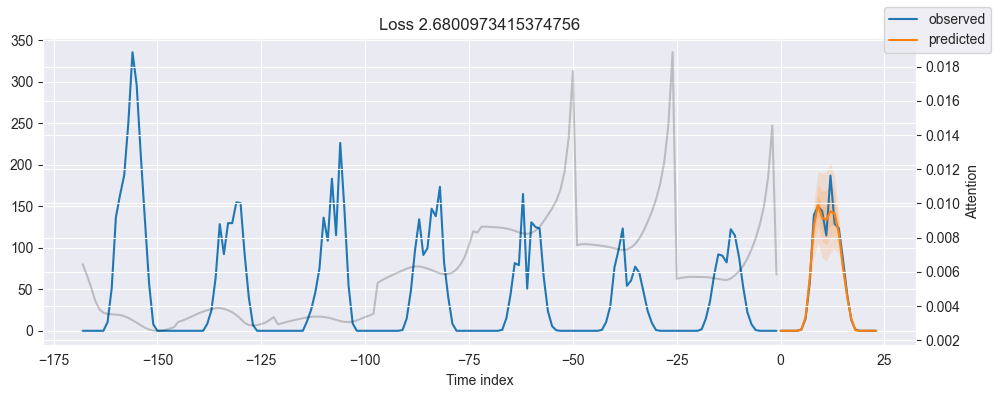

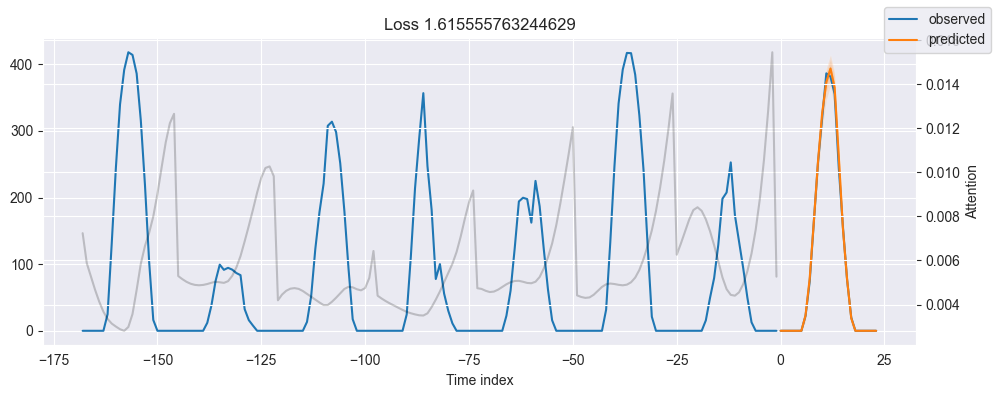

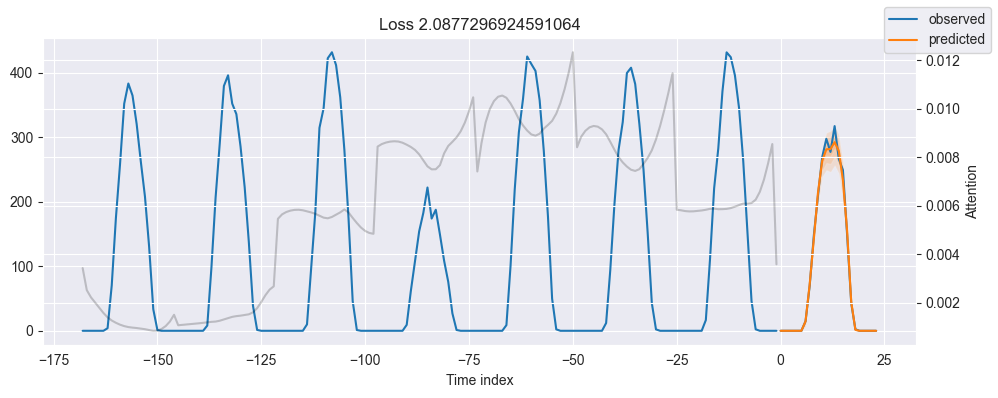

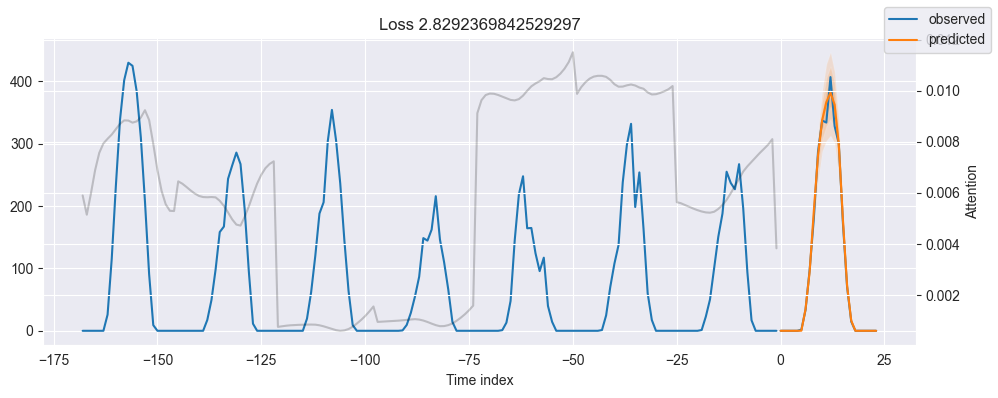

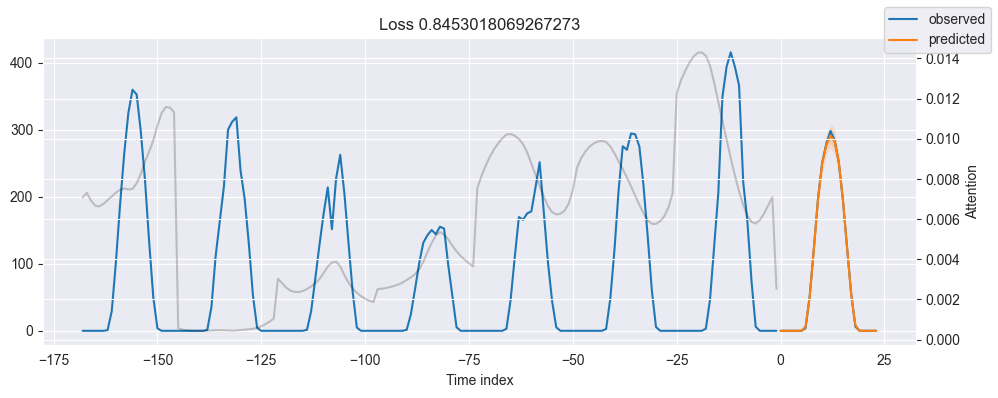

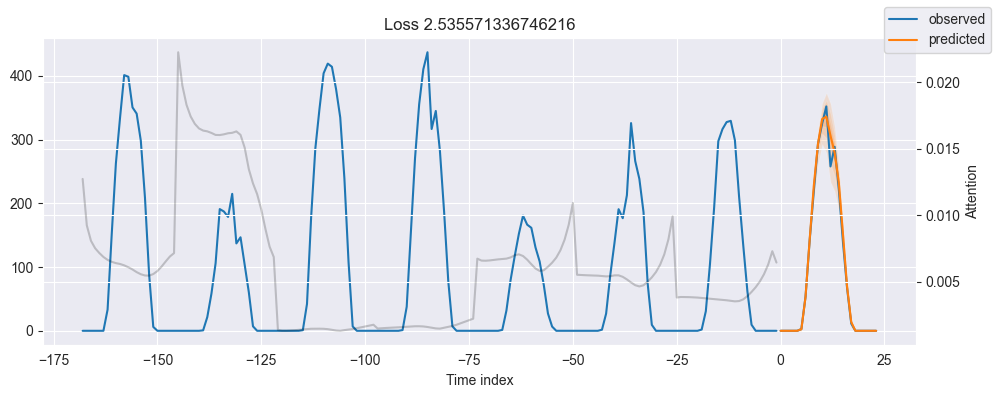

In [339]:
raw_predictions, x = best_tft.predict(val_dataloader, mode="raw", return_x=True)

for idx in range(6):  # plot all 6 consumers
    fig, ax = plt.subplots(figsize=(10, 4))
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True,ax=ax)

Результаты весьма впечатляющие.

Наша модель трансформатора временного слияния смогла отразить поведение всех 5 временных рядов как с точки зрения сезонности, так и с точки зрения величины!

Кроме того, обратите внимание, что:

Мы не выполняли никакой настройки гиперпараметров.
Мы не применяли никаких причудливых технических приемов разработки функций.
В следующем разделе мы покажем, как улучшить нашу модель с помощью гиперпараметрической оптимизации.


Взгляните поближе на переменную raw_predictions:

In [340]:
#Take a look at what the raw_predictions variable contains

raw_predictions, x = best_tft.predict(val_dataloader, mode="raw", return_x=True)
print(raw_predictions._fields)
# ('prediction', 
# 'encoder_attention', 
# 'decoder_attention', 
# 'static_variables', 
# 'encoder_variables', 
# 'decoder_variables', 
# 'decoder_lengths', 
# 'encoder_lengths')

print('\n')
print(raw_predictions['prediction'].shape)
#torch.Size([5, 24, 7])

# We get predictions of 5 time-series for 24 days.
# For each day we get 7 predictions - these are the 7 quantiles:
#[0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98]
# We are mostly interested in the 4th quantile which represents, let's say, the 'median loss'
# fyi, although docs use the term quantiles, the most accurate term are percentiles

('prediction', 'encoder_attention', 'decoder_attention', 'static_variables', 'encoder_variables', 'decoder_variables', 'decoder_lengths', 'encoder_lengths')


torch.Size([6, 24, 7])


### Построение Прогнозов для Определенного Временного Ряда
Ранее мы строили прогнозы на основе данных проверки, используя аргумент idx, который повторяется по всем временным рядам в нашем наборе данных. Мы можем быть более конкретными и выводить прогнозы по определенному временному ряду:

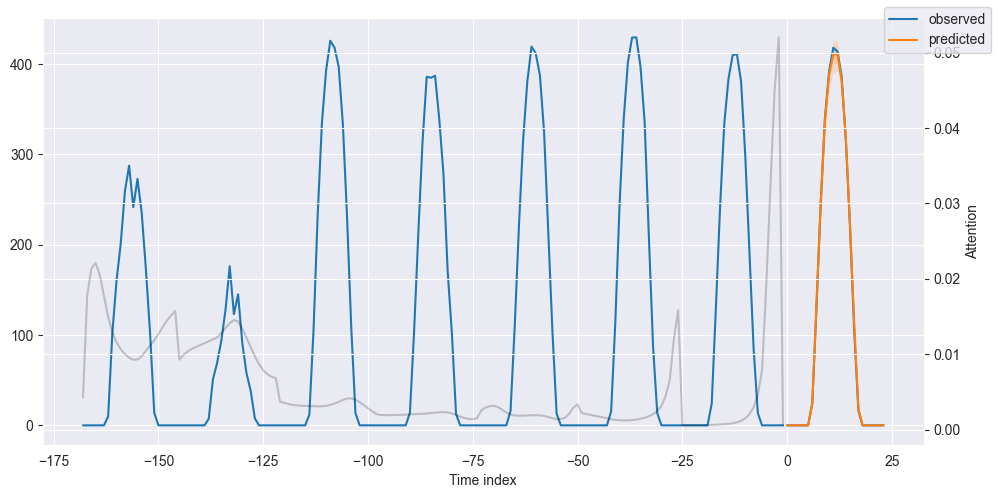

In [341]:
fig, ax = plt.subplots(figsize=(10, 5))

raw_prediction, x = best_tft.predict(
    training.filter(lambda x: (x.idpoint == "3702") & (x.time_idx_first_prediction == 19176)),
    mode="raw",
    return_x=True,
)
best_tft.plot_prediction(x, raw_prediction, idx=0, ax=ax);

In [343]:
19176 + 168//2

19260

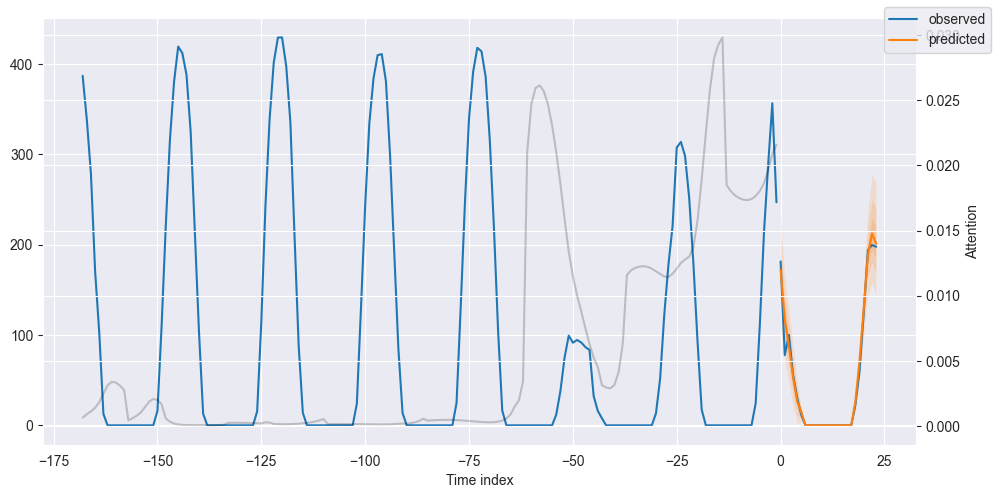

In [344]:
#the minimum time index that we can use is 26388
fig, ax = plt.subplots(figsize=(10, 5))

raw_prediction, x = best_tft.predict(
    training.filter(lambda x: (x.idpoint == "3702") & (x.time_idx_first_prediction == 19260)),
    mode="raw",
    return_x=True,
)
best_tft.plot_prediction(x, raw_prediction, idx=0, ax=ax);

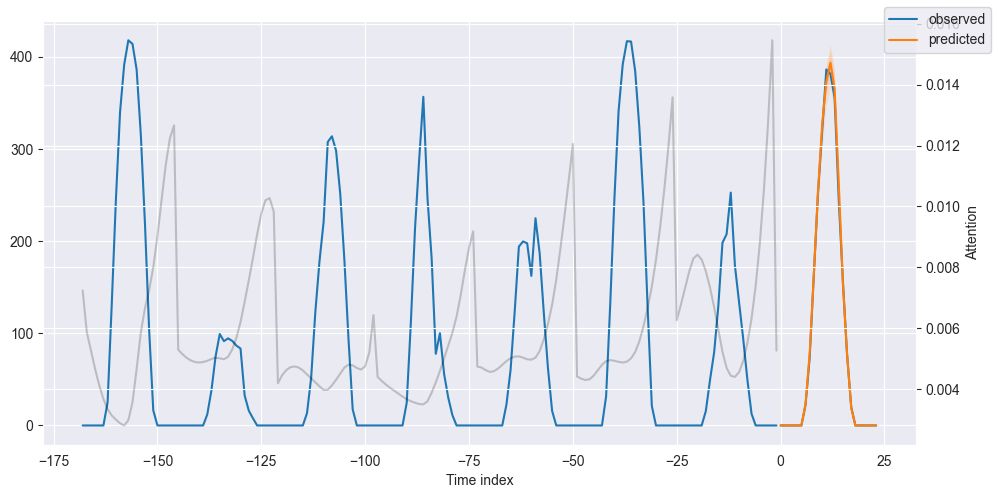

In [345]:
#this is equal to our previous Figure for idx=1
fig, ax = plt.subplots(figsize=(10, 5))

raw_prediction, x = best_tft.predict(
    validation.filter(lambda x: (x.idpoint == "3702")),
    mode="raw",
    return_x=True,
)
best_tft.plot_prediction(x, raw_prediction, idx=0, ax=ax);

### Прогнозы вне выборки
Давайте создадим прогнозы вне выборки, за пределами конечной точки данных для проверки данных, которая составляет 2014-09-07 23:00:00

Все, что нам нужно сделать, это создать новый фрейм данных, содержащий:

Количество N=max_encoder_length прошлых дат, которые действуют как окно обратного просмотра — данные кодера в терминологии TFT.
Будущие даты размера max_prediction_length, для которых мы хотим вычислить наши прогнозы — данные декодера.
Мы можем создавать прогнозы для всех 5 наших временных рядов или только для одного. На рисунке 7 показаны прогнозы вне выборки для потребителя MT_002:

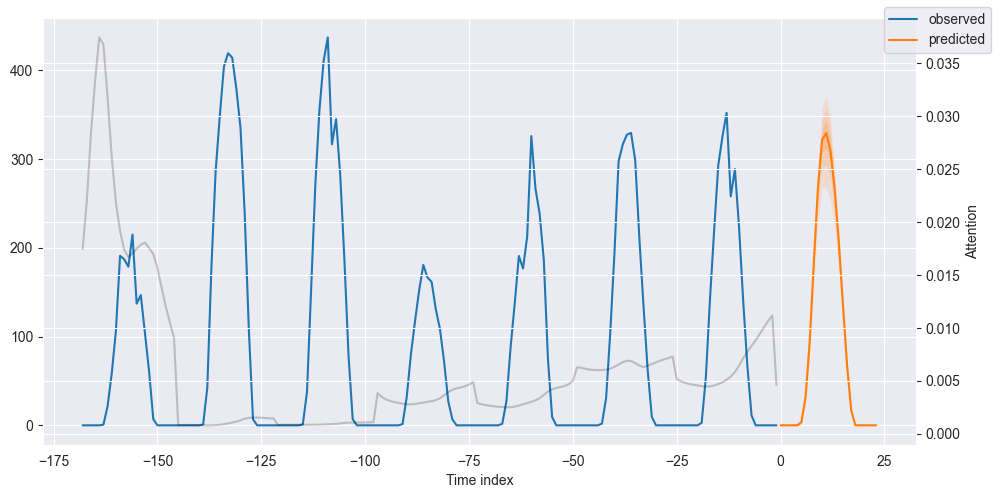

In [387]:
#encoder data is the last lookback window: we get the last 1 week (168 datapoints) for all 5 consumers = 840 total datapoints

encoder_data = data1[lambda x: x.hours_from_start > x.hours_from_start.max() - max_encoder_length]
last_data = data1[lambda x: x.hours_from_start == x.hours_from_start.max()]

#decoder_data is the new dataframe for which we will create predictions. 
#decoder_data df should be max_prediction_length*consumers = 24*5=120 datapoints long : 24 datapoints for each cosnumer
#we create it by repeating the last hourly observation of every consumer 24 times since we do not really have new test data
#and later we fix the columns

decoder_data = pd.concat(
    [last_data.assign(date=lambda x: x.date + pd.offsets.Hour(i)) for i in range(1, max_prediction_length + 1)],
    ignore_index=True,
)

#fix the new columns
decoder_data["hours_from_start"] = (decoder_data["date"] - earliest_time).dt.seconds / 60 / 60 + (decoder_data["date"] - earliest_time).dt.days * 24
decoder_data['hours_from_start'] = decoder_data['hours_from_start'].astype('int')
decoder_data["hours_from_start"] += encoder_data["hours_from_start"].max() + 1 - decoder_data["hours_from_start"].min()

decoder_data["month"] = decoder_data["date"].dt.month.astype(np.int64)
decoder_data["hour"] = decoder_data["date"].dt.hour.astype(np.int64)
decoder_data["day"] = decoder_data["date"].dt.day.astype(np.int64)
decoder_data["day_of_week"] = decoder_data["date"].dt.dayofweek.astype(np.int64)

new_prediction_data = pd.concat([encoder_data, decoder_data], ignore_index=True)

fig, ax = plt.subplots(figsize=(10, 5))

#create out-of-sample predictions for MT_002
new_prediction_data=new_prediction_data.query(" idpoint == '6260'")
new_raw_predictions, new_x = best_tft.predict(new_prediction_data, mode="raw", return_x=True)
best_tft.plot_prediction(new_x, new_raw_predictions, idx=0, show_future_observed=False, ax=ax);

### Интерпретируемое прогнозирование
Точное прогнозирование - это одно, но объяснимость также имеет большое значение в наши дни.

И это еще хуже для моделей глубокого обучения, которые считаются черными ящиками. Такие методы, как LIME и SHAP, могут обеспечить объяснимость (в некоторой степени), но плохо работают для временных рядов. Кроме того, они являются внешними методами post-hoc и не привязаны к конкретной модели.

Трансформатор временного слияния обеспечивает три типа интерпретируемости:

С учетом сезонности: TFT использует свой новый интерпретируемый многоголовый механизм внимания для вычисления важности прошедших временных шагов.
Многофункциональность: TFT использует свой сетевой модуль с переменным выбором для расчета важности каждой функции.
Устойчивость к экстремальным событиям: мы можем исследовать, как временные ряды ведут себя во время редких событий
Если вы хотите подробно узнать о внутренней работе интерпретируемого многоголового внимания и сети переменного выбора, ознакомьтесь с моей предыдущей статьей.
https://towardsdatascience.com/temporal-fusion-transformer-googles-model-for-interpretable-time-series-forecasting-5aa17beb621

### Интерпретируемость с учетом сезонности
TFT исследует веса внимания, чтобы понять временные паттерны на прошлых временных этапах.

Серые линии на всех предыдущих графиках представляют показатели внимания. Посмотрите на эти графики еще раз — вы что-нибудь заметили?

Оценки внимания показывают, насколько эффективны те временные шаги, когда модель выдает свой прогноз. Небольшие пики отражают дневную сезонность, в то время как более высокий пик ближе к концу, вероятно, подразумевает недельную сезонность.

Если мы усредним кривые внимания по всем временным шагам и временным рядам (а не только по 5, которые мы использовали в этом руководстве), мы получим симметрично выглядящую фигуру на рисунке 9 из TFT-бумаги:

*Вопрос*: Что в этом хорошего? Разве мы не можем просто оценить закономерности сезонности с помощью таких методов, как графики ACF, декомпозиция временного сигнала и т.д.?

*Ответ:* Верно. Однако изучение весов внимания TFT имеет дополнительные преимущества:

Мы можем подтвердить, что наша модель отражает очевидную сезонную динамику наших последовательностей.
Наша модель также может выявить скрытые закономерности, поскольку веса внимания в текущих окнах ввода учитывают все прошлые входные данные.
График весов внимания отличается от графика автокорреляции: график автокорреляции относится к определенной последовательности, в то время как веса внимания здесь фокусируются на влиянии каждого временного шага путем просмотра всех ковариат и временных рядов.

## Test on new Data

In [373]:
last_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6 entries, 116202 to 116207
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   idpoint           6 non-null      object 
 1   ceres_hevel395    6 non-null      float32
 2   ceres_5           6 non-null      float32
 3   ceres_6           6 non-null      float32
 4   ghi               6 non-null      float32
 5   t_2m              6 non-null      float32
 6   ceres_t_2m        6 non-null      float32
 7   ceres_albedo      6 non-null      float32
 8   month             6 non-null      int16  
 9   hour              6 non-null      int16  
 10  hours_from_start  6 non-null      int64  
 11  day               6 non-null      int16  
 12  day_of_week       6 non-null      int64  
dtypes: float32(7), int16(3), int64(2), object(1)
memory usage: 396.0+ bytes


In [374]:
#encoder data is the last lookback window: we get the last 1 week (168 datapoints) for all 5 consumers = 840 total datapoints
encoder_data = data1[lambda x: x.hours_from_start > x.hours_from_start.max() - max_encoder_length]
last_data = data1[lambda x: x.hours_from_start == x.hours_from_start.max()]

#decoder_data is the new dataframe for which we will create predictions. 
#decoder_data df should be max_prediction_length* consumers = 24*5=120 datapoints long : 24 datapoints for each cosnumer
#we create it by repeating the last hourly observation of every consumer 24 times since we do not really have new test data
#and later we fix the columns
decoder_data = pd.concat(
    [last_data.assign(date=lambda x: x.date + pd.offsets.Hour(i)) for i in range(1, max_prediction_length + 1)],
    ignore_index=True,
)

#fix the new columns
decoder_data["hours_from_start"] = (decoder_data["date"] - earliest_time).dt.seconds / 60 / 60 + (decoder_data["date"] - earliest_time).dt.days * 24
decoder_data['hours_from_start'] = decoder_data['hours_from_start'].astype('int')
decoder_data["hours_from_start"] += encoder_data["hours_from_start"].max() + 1 - decoder_data["hours_from_start"].min()

decoder_data["month"] = decoder_data["date"].dt.month.astype(np.int64)
decoder_data["hour"] = decoder_data["date"].dt.hour.astype(np.int64)
decoder_data["day"] = decoder_data["date"].dt.day.astype(np.int64)
decoder_data["day_of_week"] = decoder_data["date"].dt.dayofweek.astype(np.int64)

new_prediction_data = pd.concat([encoder_data, decoder_data], ignore_index=True)

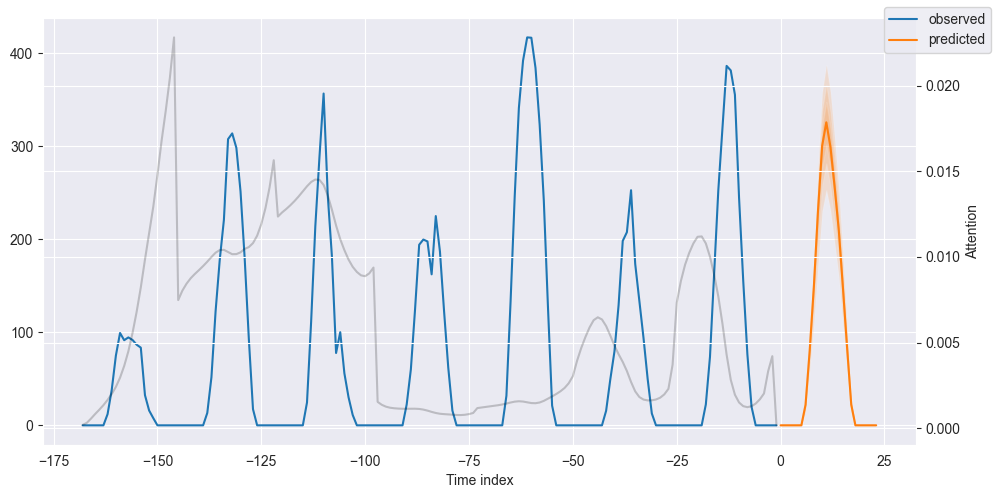

In [375]:
fig, ax = plt.subplots(figsize=(10, 5))

#create out-of-sample predictions for MT_002
new_prediction_data=new_prediction_data.query(" idpoint == '3702'")
new_raw_predictions, new_x = best_tft.predict(new_prediction_data, mode="raw", return_x=True)
best_tft.plot_prediction(new_x, new_raw_predictions, idx=0, show_future_observed=False, ax=ax);

# Feature Importances

Интерпретируемость с точки зрения функций

Сетевой компонент TFT с переменным выбором позволяет легко оценить важность функций:

{'attention': <Figure size 1500x1500 with 1 Axes>,
 'static_variables': <Figure size 700x300 with 1 Axes>,
 'encoder_variables': <Figure size 700x350 with 1 Axes>,
 'decoder_variables': <Figure size 700x350 with 1 Axes>}

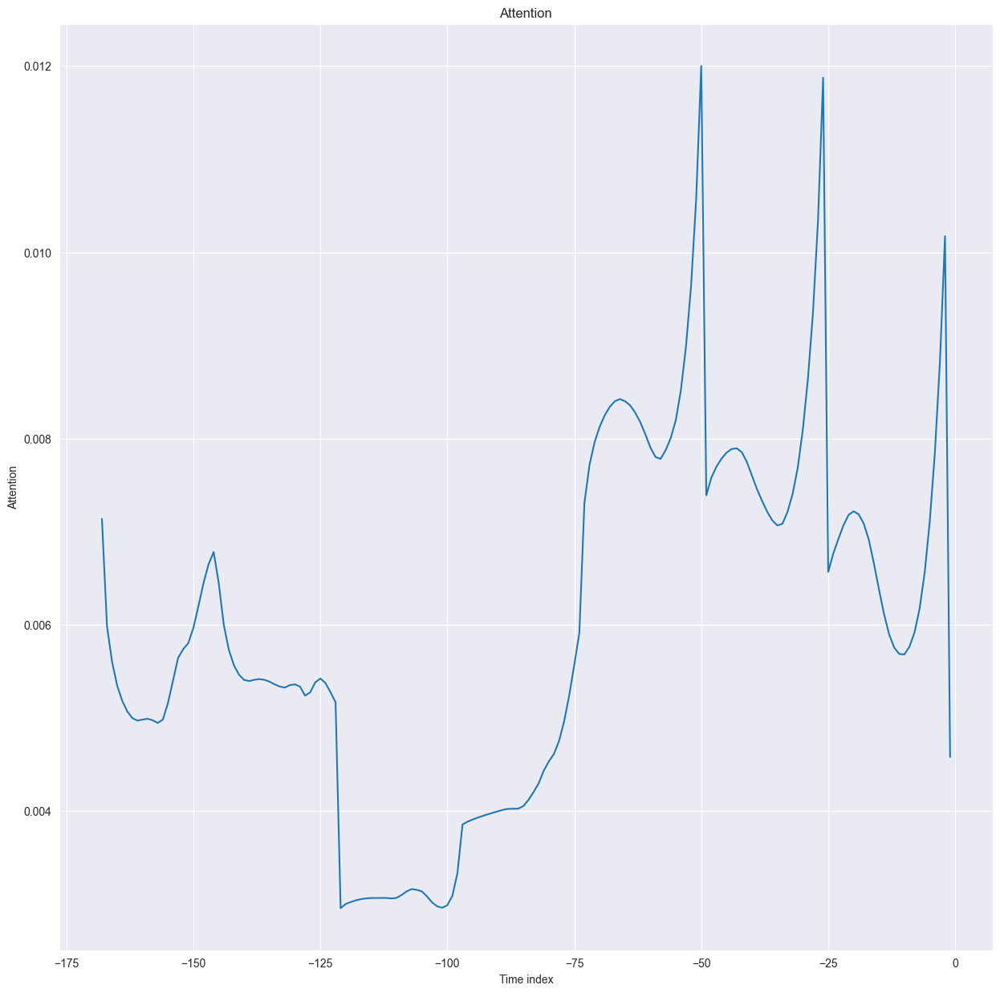

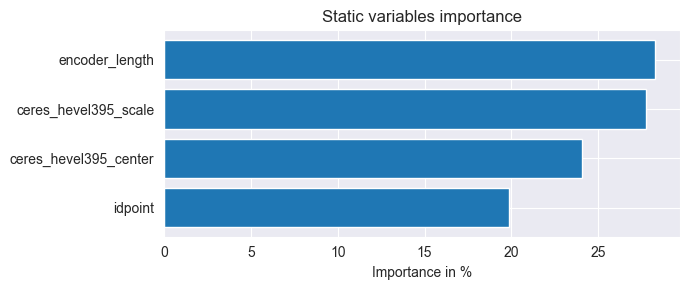

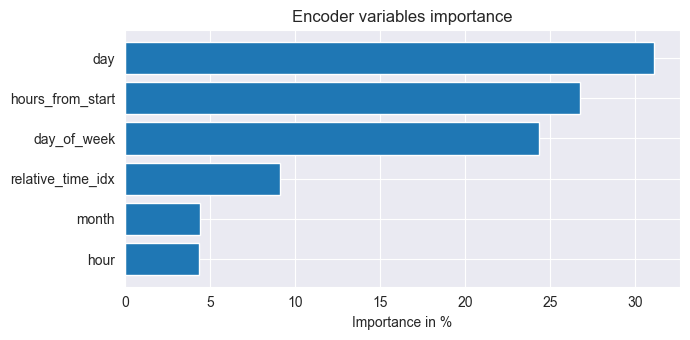

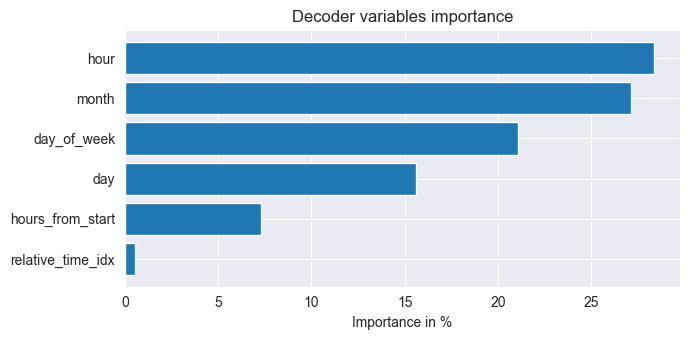

In [378]:
raw_predictions, x = best_tft.predict(val_dataloader, mode="raw", return_x=True)
interpretation = best_tft.interpret_output(raw_predictions, reduction="sum")
best_tft.plot_interpretation(interpretation)

На рисунке мы замечаем следующее:

Час и месяц имеют высокие оценки, как в качестве прошлых наблюдений, так и в качестве будущих ковариат. Эталонный показатель в оригинальной статье разделяет тот же вывод.

Идентификатор пользователя здесь не очень важен, потому что мы используем только 6 потребителей. 

### Extreme Event Detection

Временные ряды печально известны тем, что подвержены внезапным изменениям своих свойств во время редких событий (также называемых шоками).

Хуже того, эти события очень неуловимы. Представьте, что ваша целевая переменная становится изменчивой на короткий период, потому что ковариация незаметно изменяет поведение:

Является ли это каким-то случайным шумом или скрытым постоянным паттерном, который ускользает от нашей модели?

С помощью TFT мы можем анализировать надежность каждой отдельной функции во всем диапазоне их значений. К сожалению, текущий набор данных не показывает волатильности или редких событий — их, скорее всего, можно найти в финансовых данных, данных о продажах и так далее. Тем не менее, мы покажем, как их рассчитать:

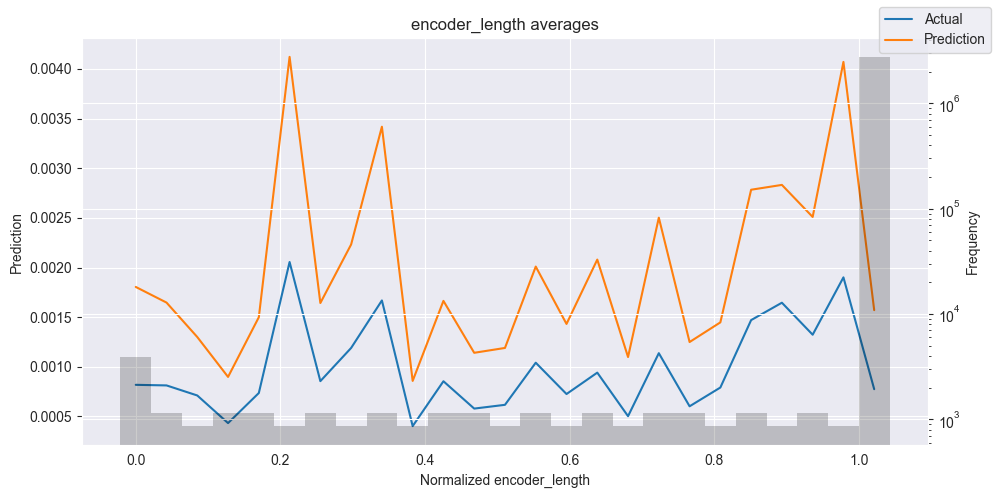

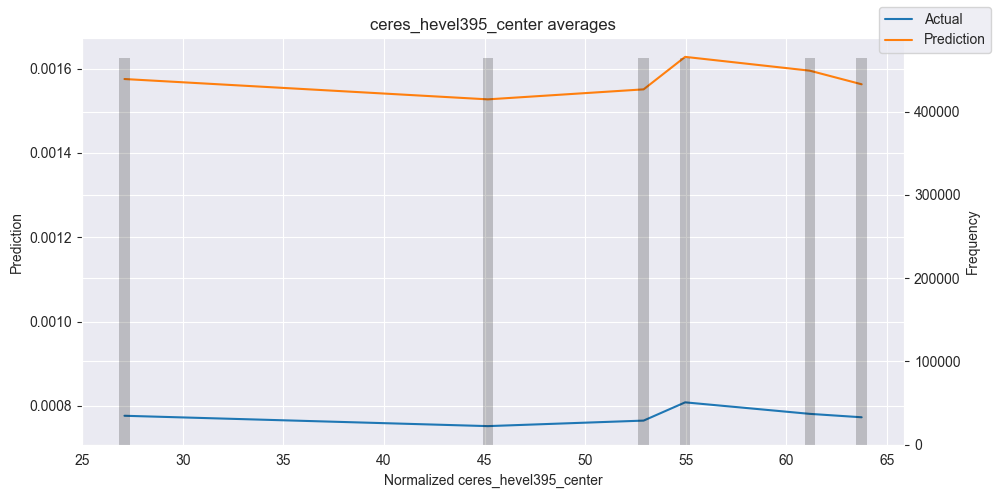

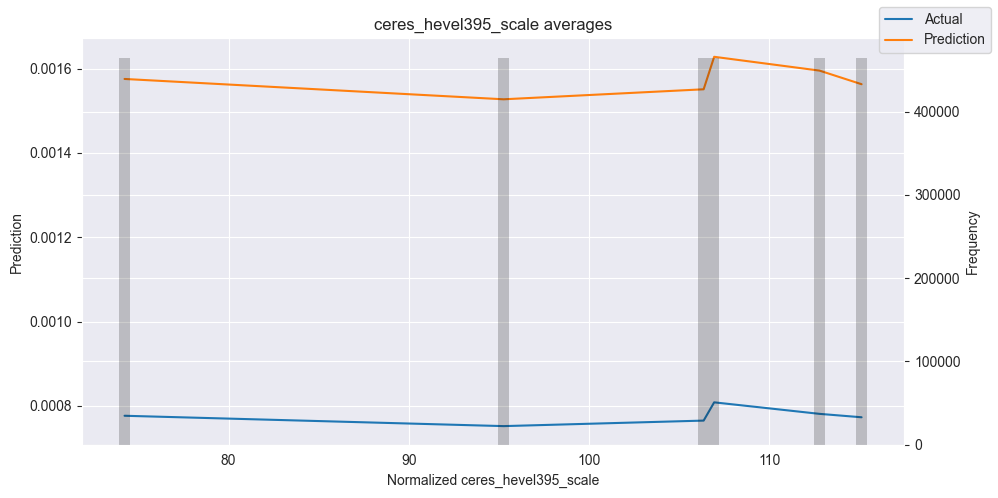

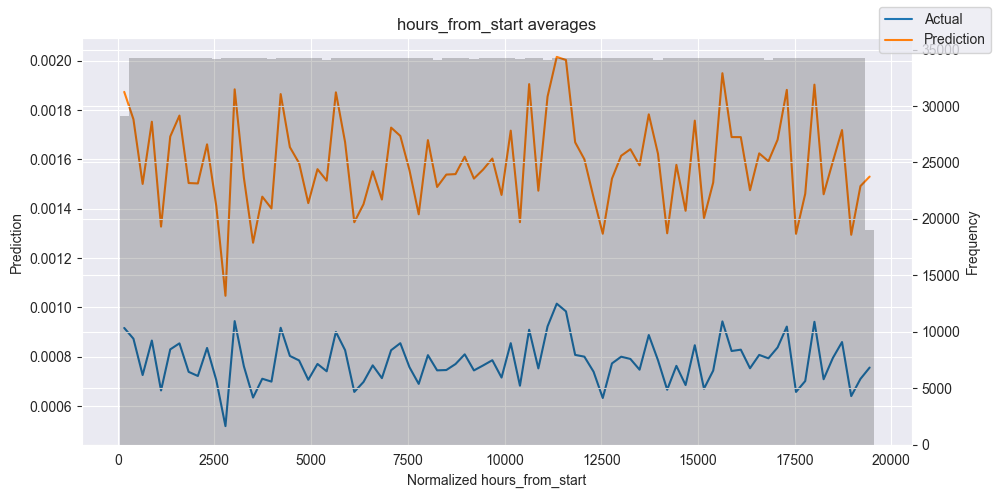

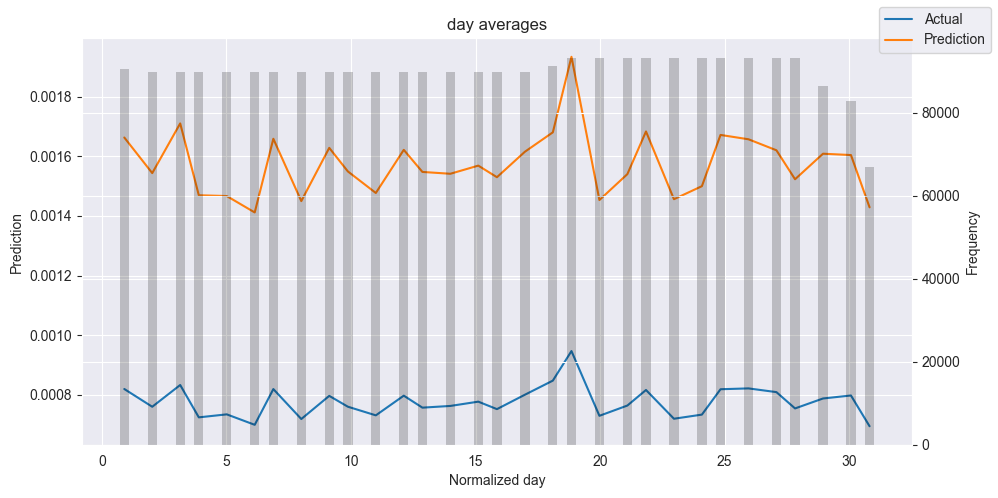

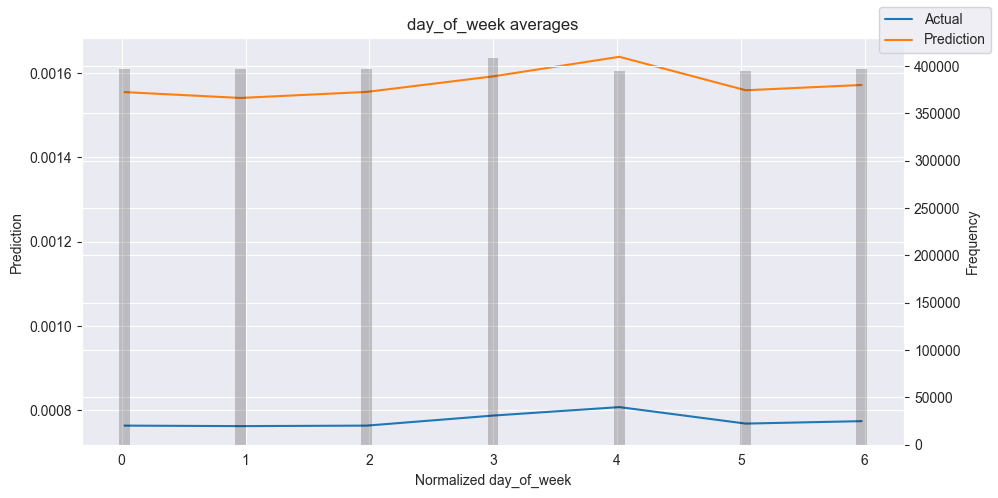

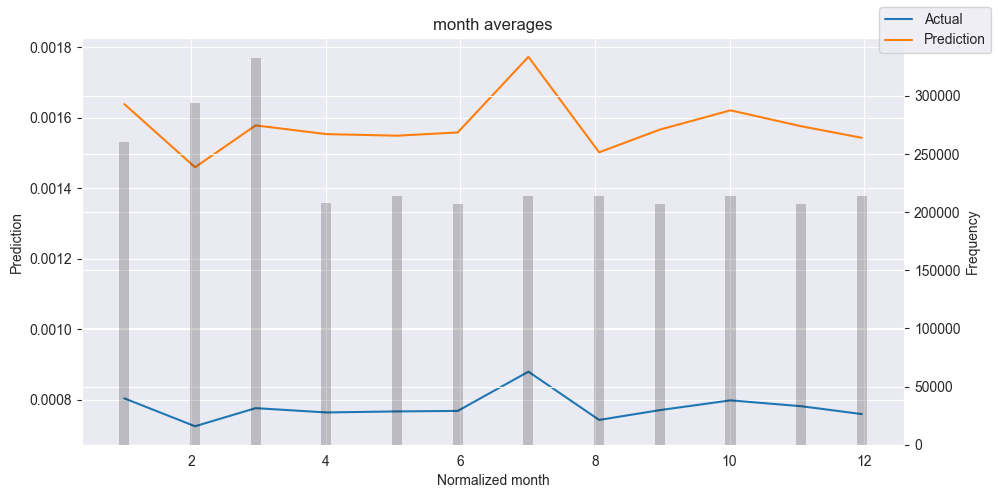

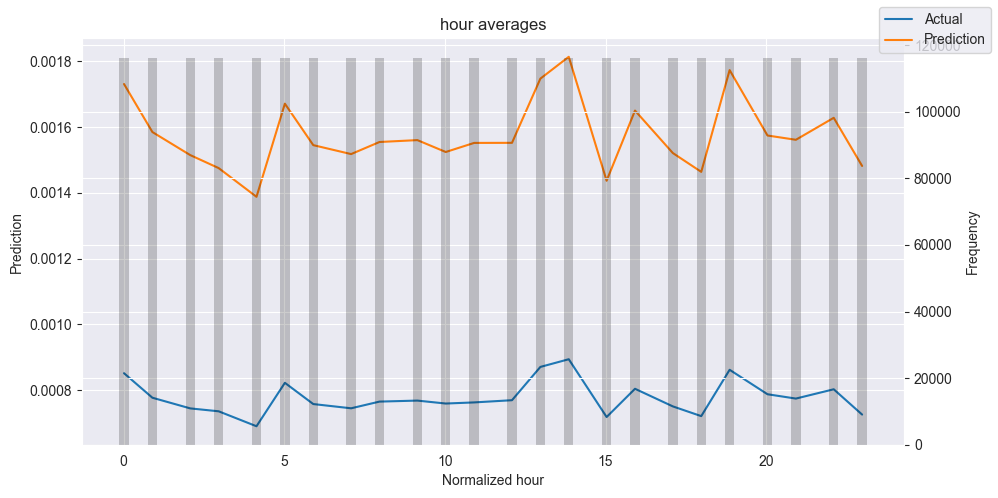

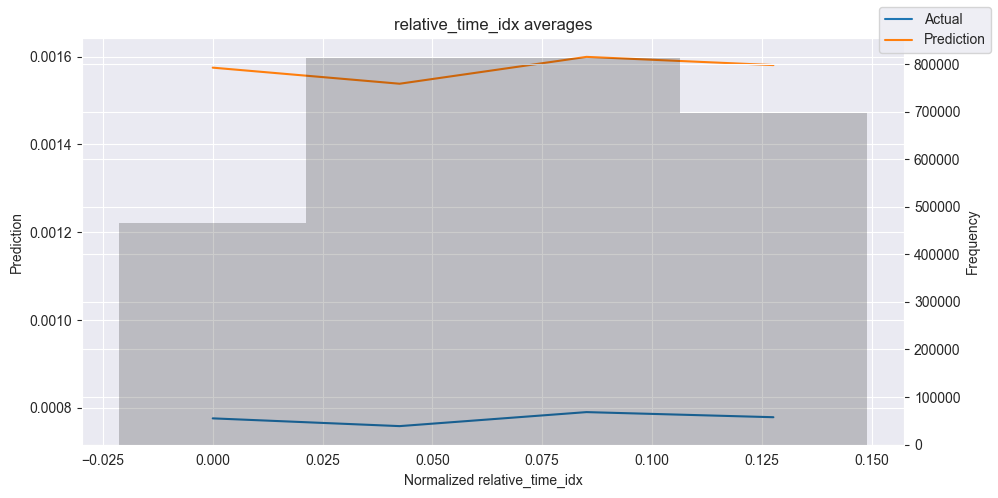

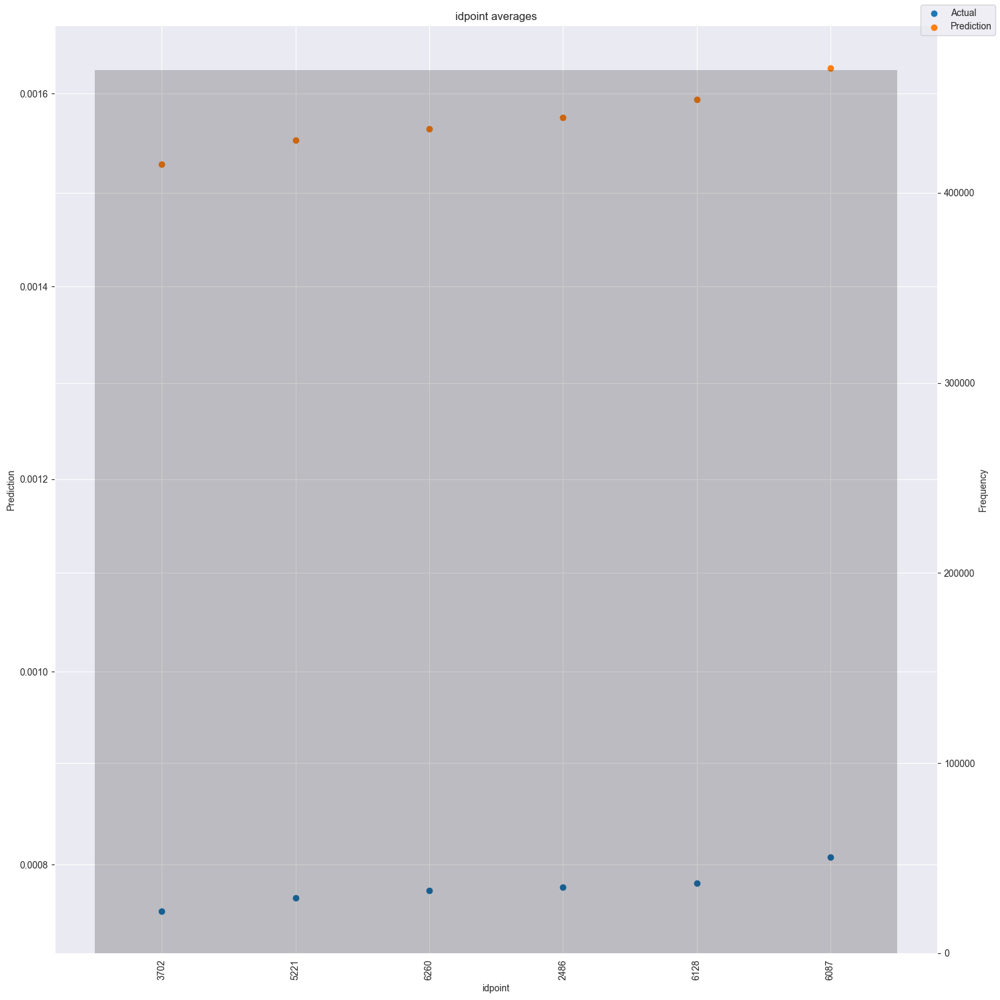

In [379]:
#Analysis on the training set
predictions, x = best_tft.predict(train_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(x, predictions)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals);

## Hyperparameter Tuning

Мы можем легко использовать Temporal Fusion Transformer с Optuna для выполнения настройки гиперпараметров:

In [380]:
# create a new study
study = optimize_hyperparameters(
    train_dataloader,
    val_dataloader,
    model_path="optuna_test",
    n_trials=1,
    max_epochs=1,
    gradient_clip_val_range=(0.01, 1.0),
    hidden_size_range=(30, 128),
    hidden_continuous_size_range=(30, 128),
    attention_head_size_range=(1, 4),
    learning_rate_range=(0.001, 0.1),
    dropout_range=(0.1, 0.3),
    reduce_on_plateau_patience=4,
    use_learning_rate_finder=False 
)

# save study results
with open("test_study.pkl", "wb") as fout:
    pickle.dump(study, fout)

# print best hyperparameters
print(study.best_trial.params)

[I 2023-01-07 19:32:57,456] A new study created in memory with name: no-name-5e56a504-a6ab-44d0-8c60-51b797f370da
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\talic\anaconda3\envs\rtx-3060\lib\site-packages\pytorch_lightning\utilities\parsing.py:262: UserWar

{'gradient_clip_val': 0.5853825989002635, 'hidden_size': 34, 'dropout': 0.13108844892713833, 'hidden_continuous_size': 33, 'attention_head_size': 3, 'learning_rate': 0.02146894482850912}
